In [59]:
#Package Imports
import imageio.v3 as iio
import matplotlib.pyplot as plt
import numpy as np
import skimage as ski
import pandas as pd
import cv2
import matplotlib.pyplot as plt

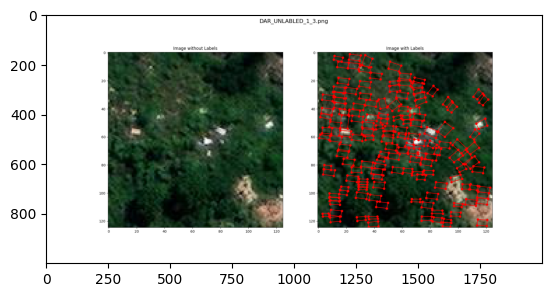

In [48]:
comparison_image =iio.imread('SuperimposedSatelliteTiles/comparison_images/DAR_UNLABLED_1_3.png')
plt.imshow(comparison_image)

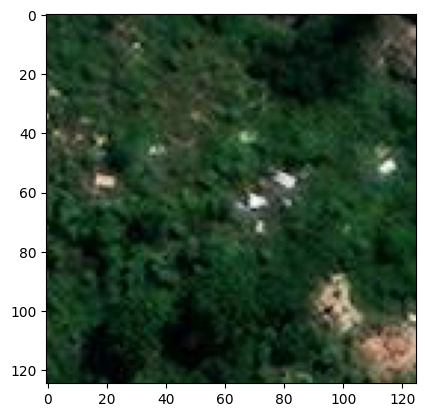

In [49]:
image = iio.imread('/Users/kweitzel/Library/CloudStorage/OneDrive-ResearchTriangleInstitute/Projects/NYU Detect/satellite_drone_overlays/SuperimposedSatelliteTiles/DAR_UNLABLED_1_3.png')
plt.imshow(image)

Text(0, 0.5, 'Pixel count')

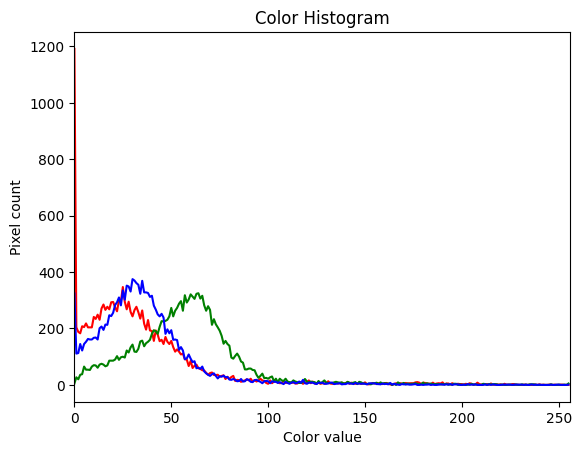

In [8]:
# tuple to select colors of each channel line
colors = ("red", "green", "blue")

# create the histogram plot, with three lines, one for
# each color
plt.figure()
plt.xlim([0, 256])
for channel_id, color in enumerate(colors):
    histogram, bin_edges = np.histogram(
        image[:, :, channel_id], bins=256, range=(0, 256)
    )
    plt.plot(bin_edges[0:-1], histogram, color=color)

plt.title("Color Histogram")
plt.xlabel("Color value")
plt.ylabel("Pixel count")

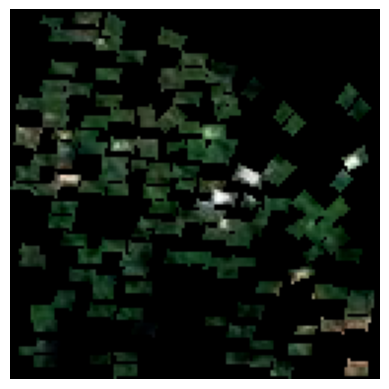

Text(0, 0.5, 'Pixel count')

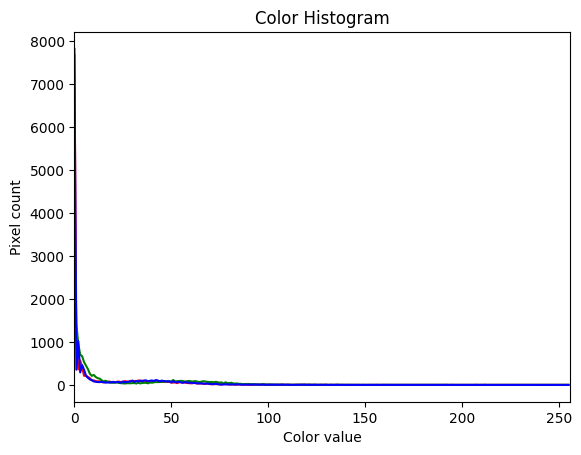

In [63]:
from PIL import Image, ImageDraw
import pandas as pd

# Load image
input_image_path = '/Users/kweitzel/Library/CloudStorage/OneDrive-ResearchTriangleInstitute/Projects/NYU Detect/satellite_drone_overlays/SuperimposedSatelliteTiles/DAR_UNLABLED_1_3.png'
image = Image.open(input_image_path)

# Load coordinates from CSV
image_label_path ='/Users/kweitzel/Library/CloudStorage/OneDrive-ResearchTriangleInstitute/Projects/NYU Detect/satellite_drone_overlays/SuperimposedSatelliteTiles/DAR_UNLABLED_1_3.txt'

df = pd.read_csv(image_label_path,
            sep=' ',
            names=['x1', 'y1', 'x2', 'y2', 'x3', 'y3', 'x4', 'y4', 'label', 'difficulty'])


# Create a blank image with the same size as the original image
output_image = Image.new('RGB', image.size, (0, 0, 0))
draw = ImageDraw.Draw(output_image)

# Iterate through rows in the DataFrame and paste the cropped regions onto the blank image
for index, row in df.iterrows():
    points = [(row[f'x{i+1}'], row[f'y{i+1}']) for i in range(4)]
    mask = Image.new('L', image.size, 0)
    draw_mask = ImageDraw.Draw(mask)
    draw_mask.polygon(points, outline=255, fill=255)
    cropped_region = Image.composite(image, Image.new('RGB', image.size, (255, 255, 255)), mask)
    output_image.paste(cropped_region, mask=mask)

# Save the output image
output_image.save('output_cropped_image.jpg')

# Display the output image using matplotlib
plt.imshow(output_image)
plt.axis('off')
plt.show()

graves_only_image = iio.imread('output_cropped_image.jpg')

# tuple to select colors of each channel line
colors = ("red", "green", "blue")

# create the histogram plot, with three lines, one for
# each color
plt.figure()
plt.xlim([0, 256])
for channel_id, color in enumerate(colors):
    histogram, bin_edges = np.histogram(
        graves_only_image[:, :, channel_id], bins=256, range=(0, 256)
    )
    plt.plot(bin_edges[0:-1], histogram, color=color)

plt.title("Color Histogram")
plt.xlabel("Color value")
plt.ylabel("Pixel count")

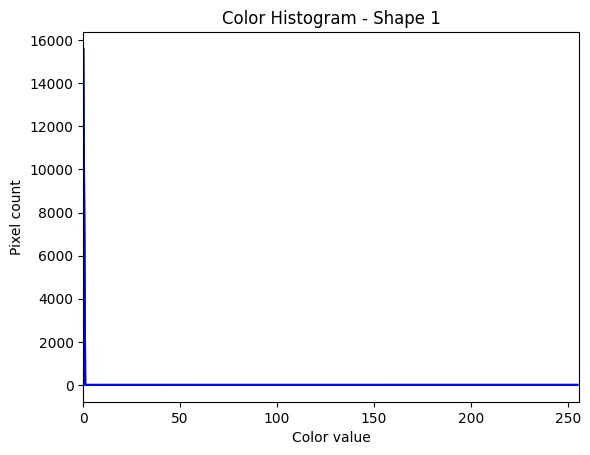

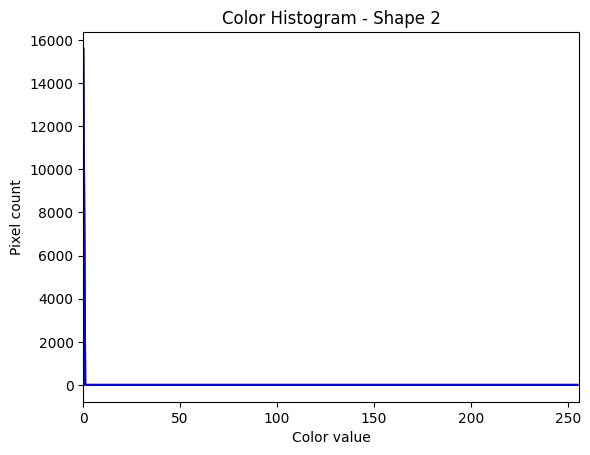

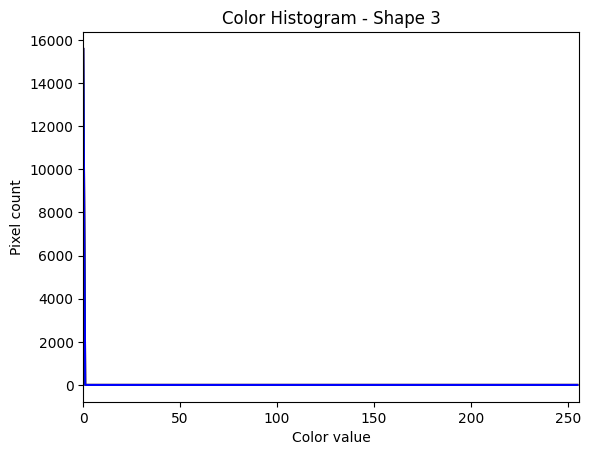

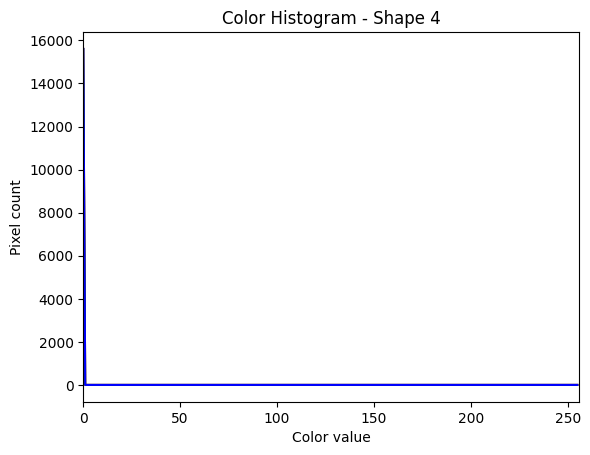

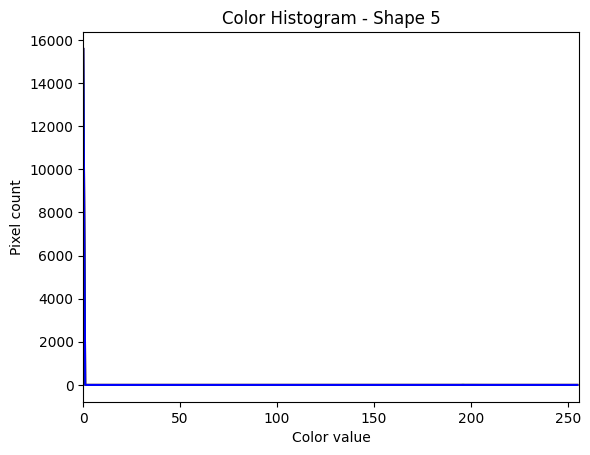

...

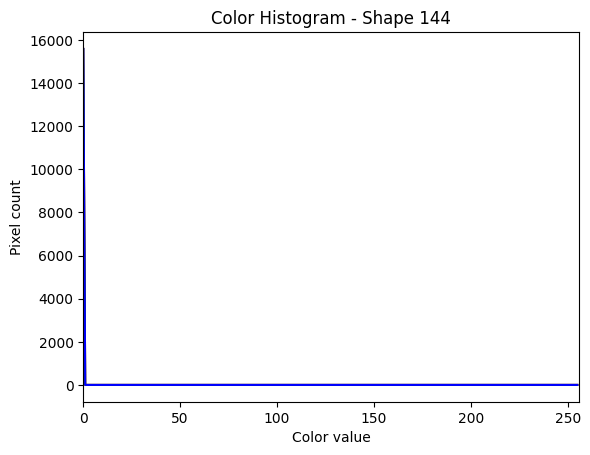

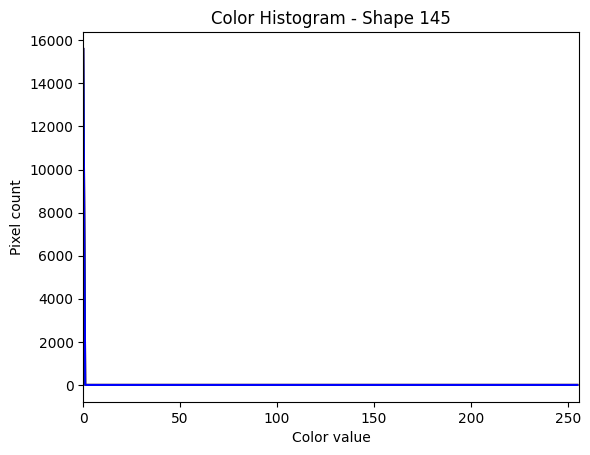

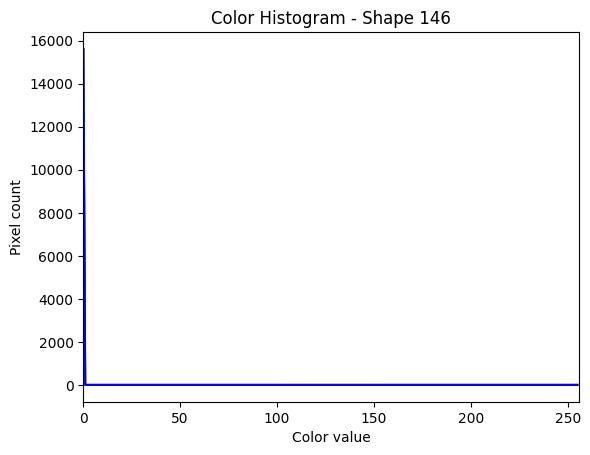

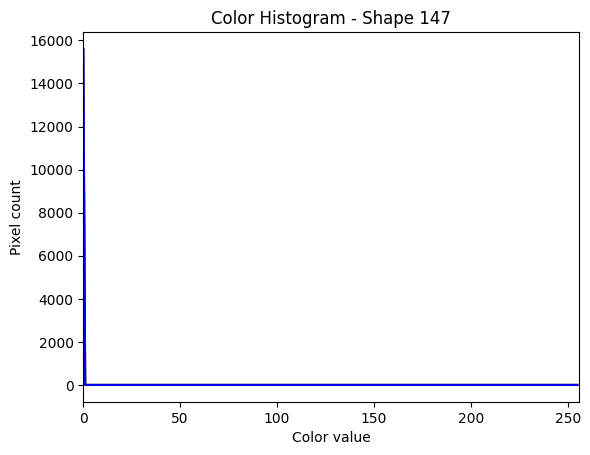

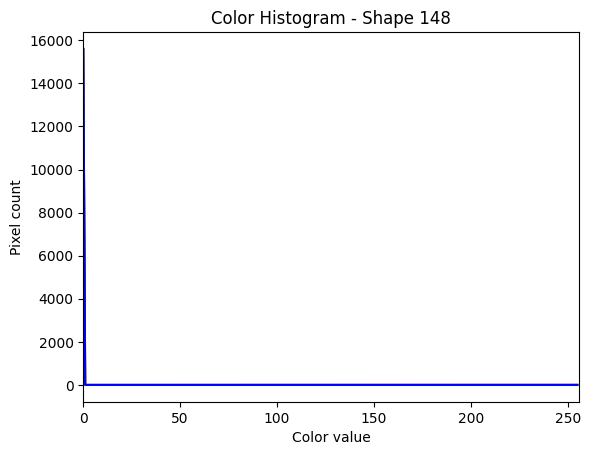

In [56]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import pandas as pd

# Load image
input_image_path = '/Users/kweitzel/Library/CloudStorage/OneDrive-ResearchTriangleInstitute/Projects/NYU Detect/satellite_drone_overlays/SuperimposedSatelliteTiles/DAR_UNLABLED_1_3.png'
image = Image.open(input_image_path)

# Load coordinates from CSV
image_label_path ='/Users/kweitzel/Library/CloudStorage/OneDrive-ResearchTriangleInstitute/Projects/NYU Detect/satellite_drone_overlays/SuperimposedSatelliteTiles/DAR_UNLABLED_1_3.txt'

# Convert PIL Image to NumPy array
image_array = np.array(image)

df = pd.read_csv(image_label_path,
            sep=' ',
            names=['x1', 'y1', 'x2', 'y2', 'x3', 'y3', 'x4', 'y4', 'label', 'difficulty'])

# Tuple to select colors of each channel line
colors = ("red", "green", "blue")

# Iterate through rows in the DataFrame and create a color histogram for each shape
for index, row in df.iterrows():
    # Extract points for the current shape
    points = [(row[f'x{i+1}'], row[f'y{i+1}']) for i in range(4)]
    
    # Create a mask for the current shape
    mask = Image.new('L', image.size, 0)
    draw_mask = ImageDraw.Draw(mask)
    draw_mask.polygon(points, outline=255, fill=255)
    mask_array = np.array(mask)

    # Extract pixel values within the shape
    masked_image = image_array * mask_array[:, :, np.newaxis]
    
    # Create a color histogram for each channel
    plt.figure()
    plt.xlim([0, 256])
    for channel_id, color in enumerate(colors):
        histogram, bin_edges = np.histogram(
            masked_image[:, :, channel_id], bins=256, range=(0, 256)
        )
        plt.plot(bin_edges[0:-1], histogram, color=color)

    plt.title(f"Color Histogram - Shape {index+1}")
    plt.xlabel("Color value")
    plt.ylabel("Pixel count")
    plt.show()


[(67.24983128732151, 21.653514420941065), (74.27805146424129, 21.61521794513237), (74.31839676744642, 24.51447174023733), (66.9411724763687, 24.768099661880854)]


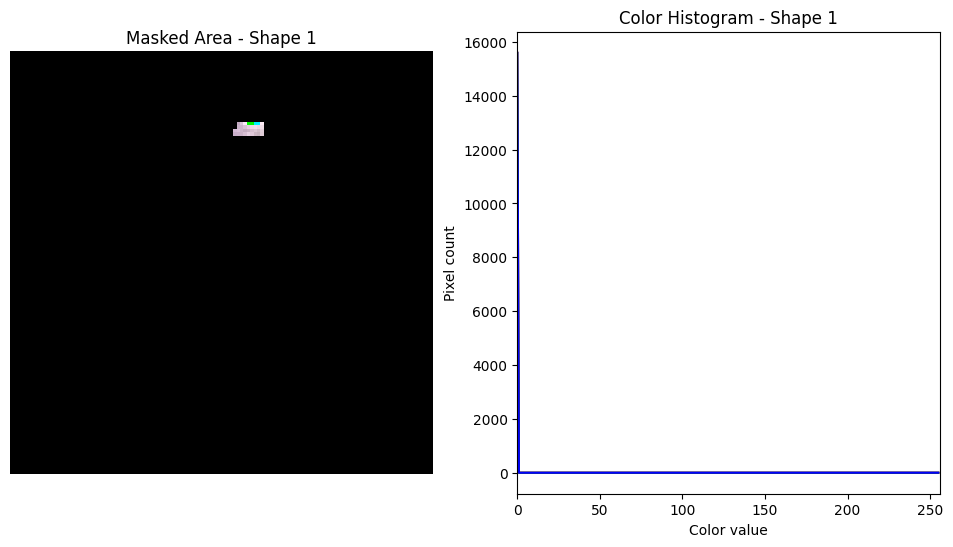

[(58.40835846017672, 14.42240741543722), (66.19383030667029, 15.244060604866718), (65.35196471533271, 19.219940380560075), (57.73260770229143, 18.23206095845464)]


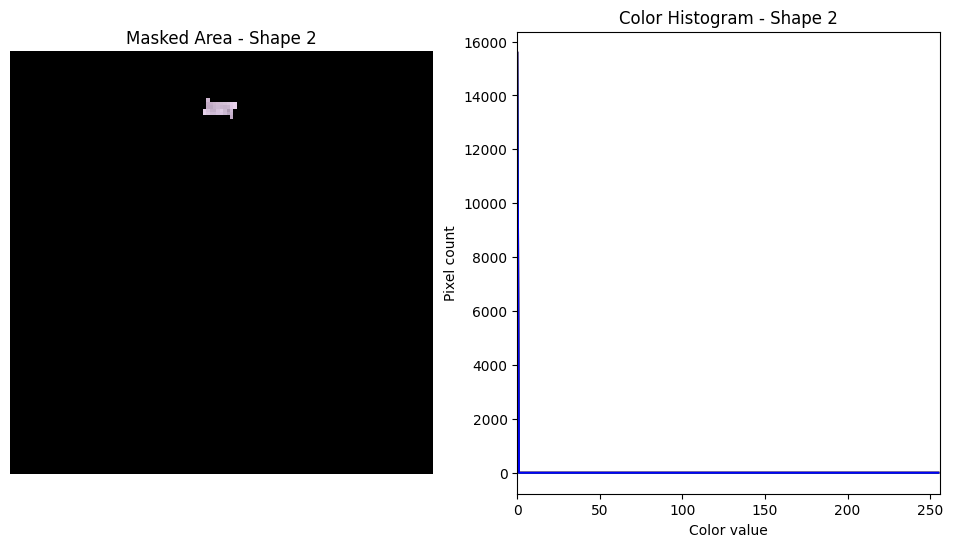

[(22.52187737920363, 1.0464519358367284), (30.298402349799204, 1.8660715837379769), (29.455961431236915, 5.839053595546858), (21.84543023692385, 4.853305553019709)]


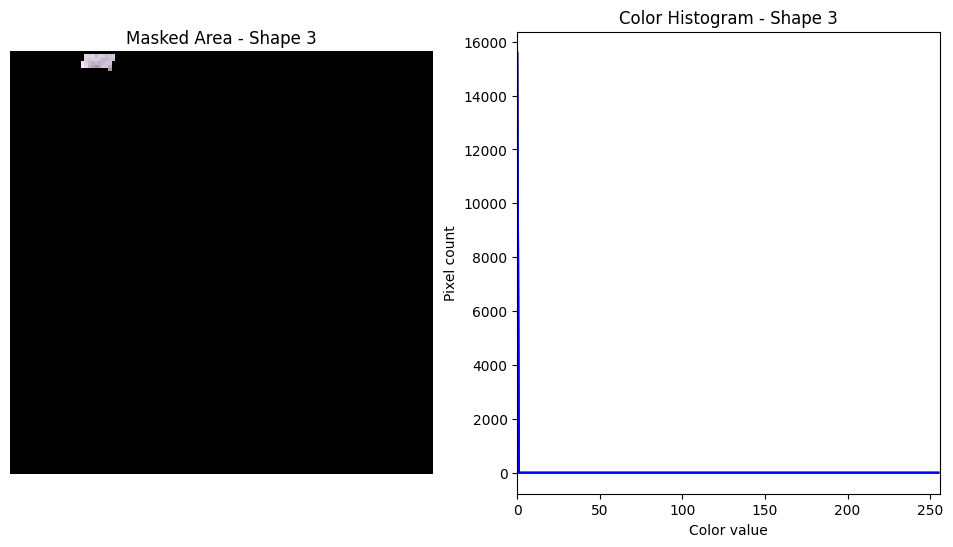

[(11.430128035037429, 2.215890215220924), (17.432306721120597, 3.3682307456118963), (16.70971061717745, 6.231754331792246), (10.87358274935744, 4.913495759315879)]


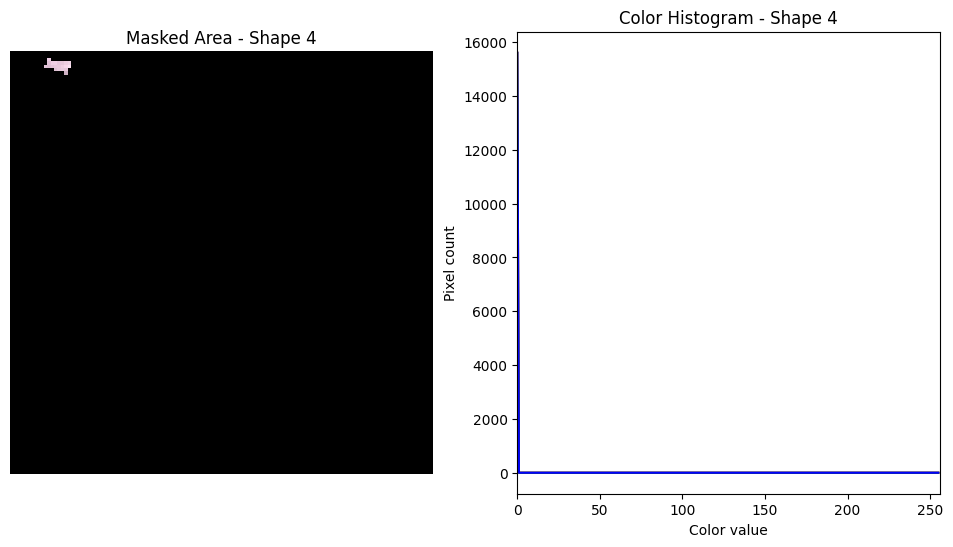

[(33.44419727352687, 1.7636159353779988), (38.567807461196594, 4.241323673555655), (36.0612411284996, 10.534004457958105), (31.101423811070248, 8.552040219779343)]


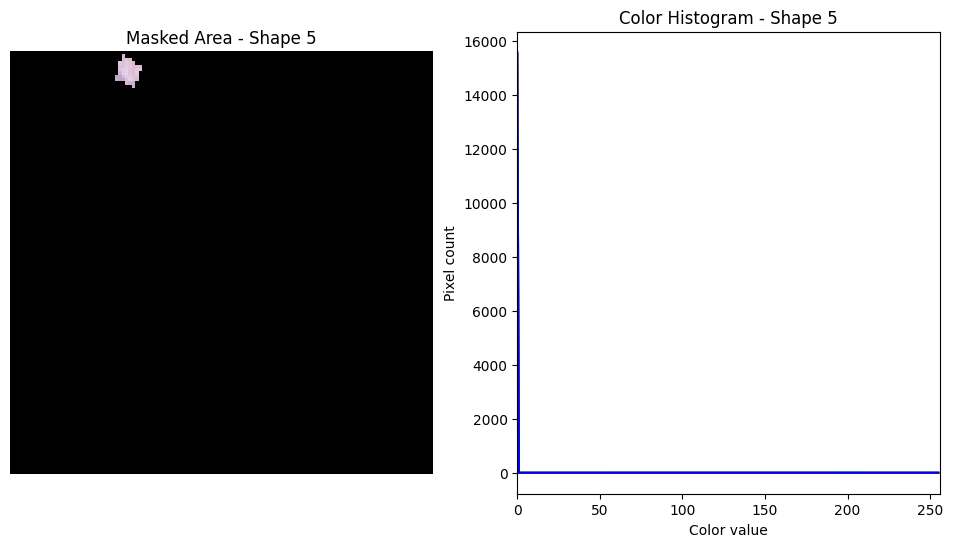

[(51.27938884623393, 6.348161179390274), (50.10255151060022, 11.31634893033626), (57.55062825244352, 13.297016614618144), (59.22156639574507, 9.155648147479384)]


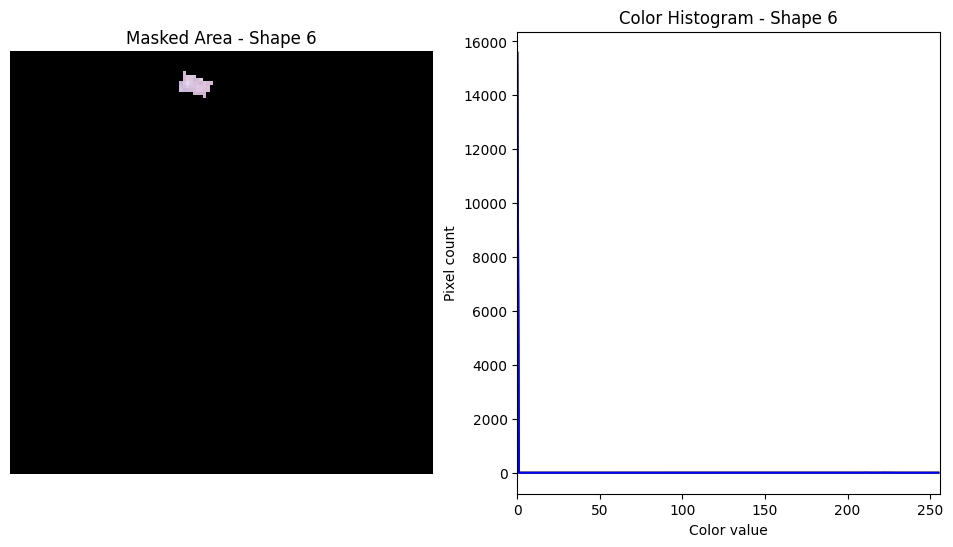

[(21.67176090779759, 7.0049158366573465), (29.44859078627823, 7.825254748480034), (28.60608028279881, 11.798624835381672), (20.99525233391265, 10.812151791990914)]


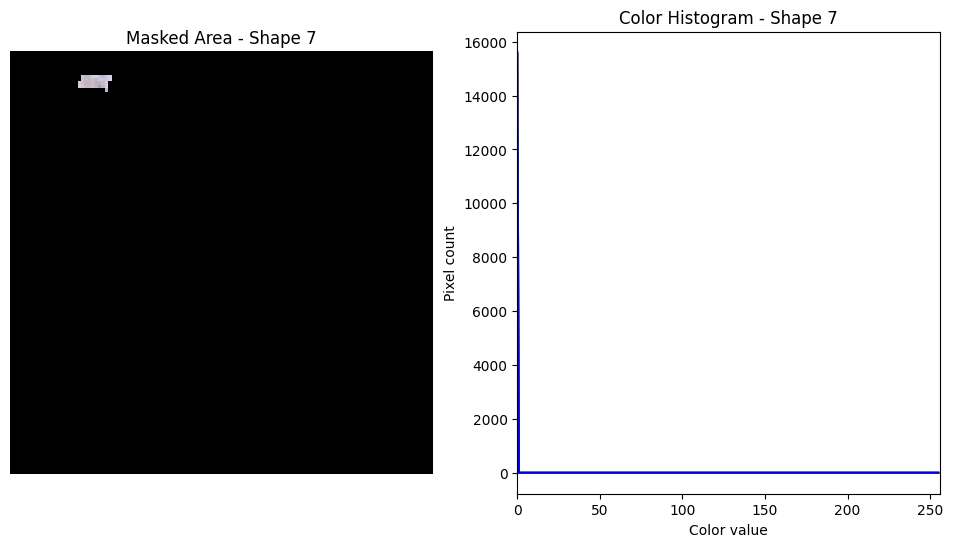

[(29.939719508423053, 9.314512540316628), (37.71854666428729, 10.135225467684023), (36.87617548345108, 14.1092069621902), (29.26337679002245, 13.122338352923748)]


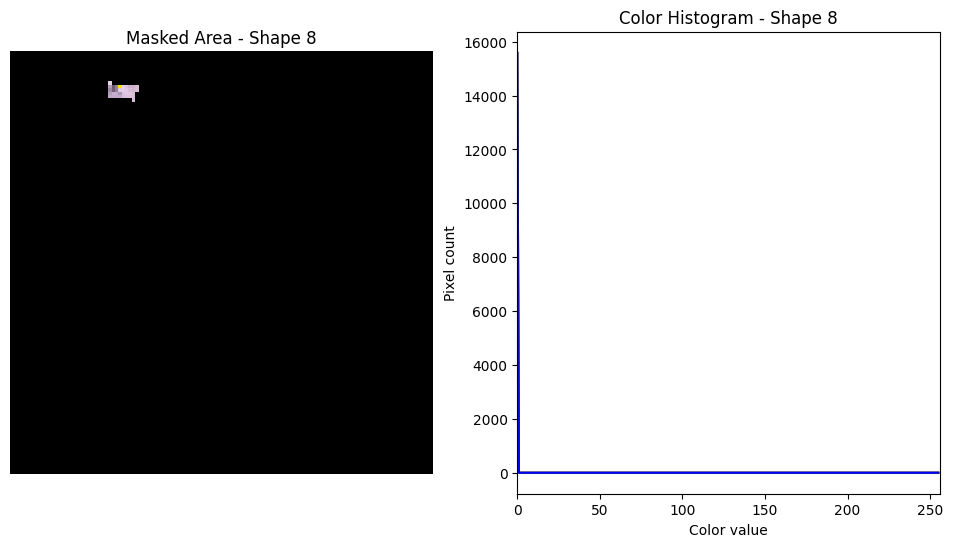

[(14.348299944768089, 17.769369897954988), (22.12441576025188, 18.59094423550724), (21.2816676164596, 22.56470511781518), (13.671552726552108, 21.576999295201404)]


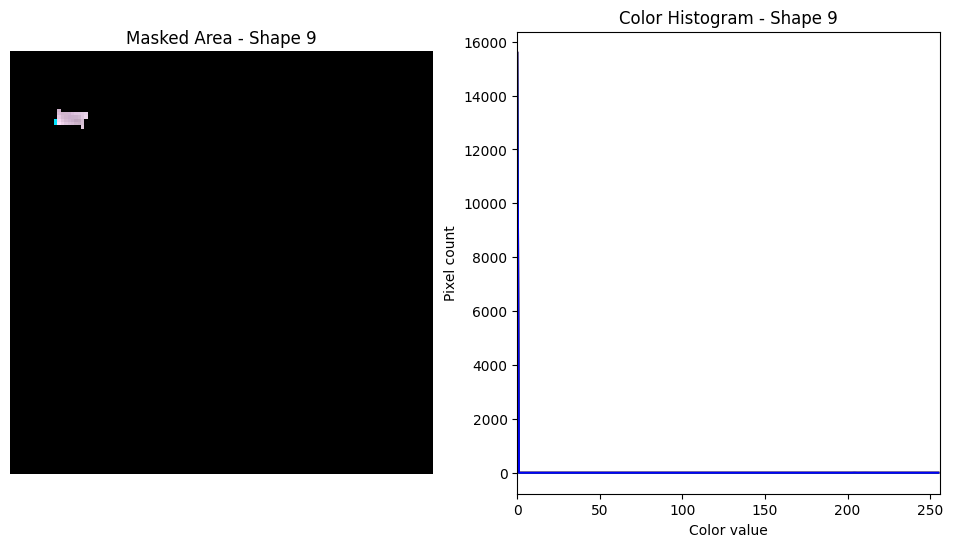

[(14.061533442137003, 6.350087545948867), (21.83664628617672, 7.170262141797224), (20.99399447995137, 11.14317653477977), (13.384861727727866, 10.156885755374615)]


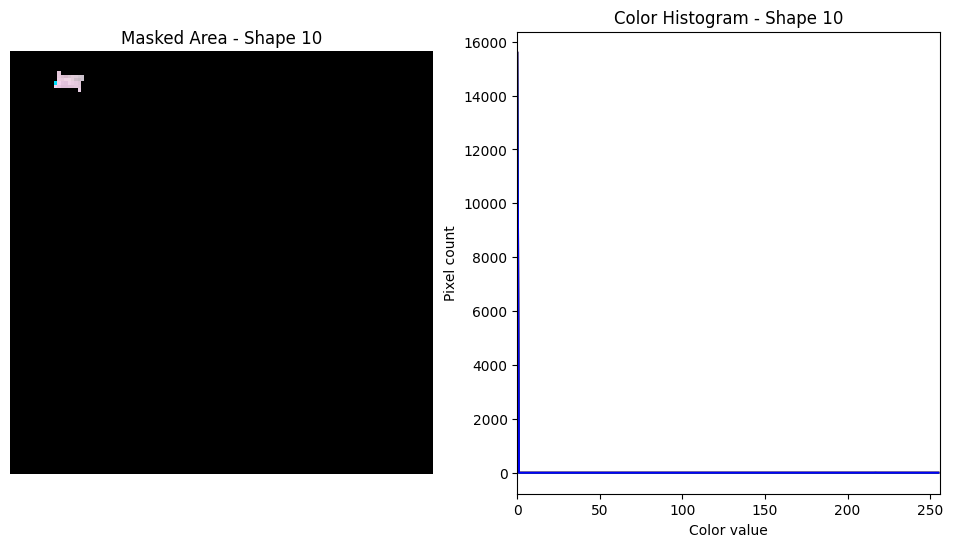

[(29.73427288653471, 20.075082139590364), (37.51394140095519, 20.897109121849724), (36.67147029505492, 24.87186285951384), (29.05784858277923, 23.883666847111897)]


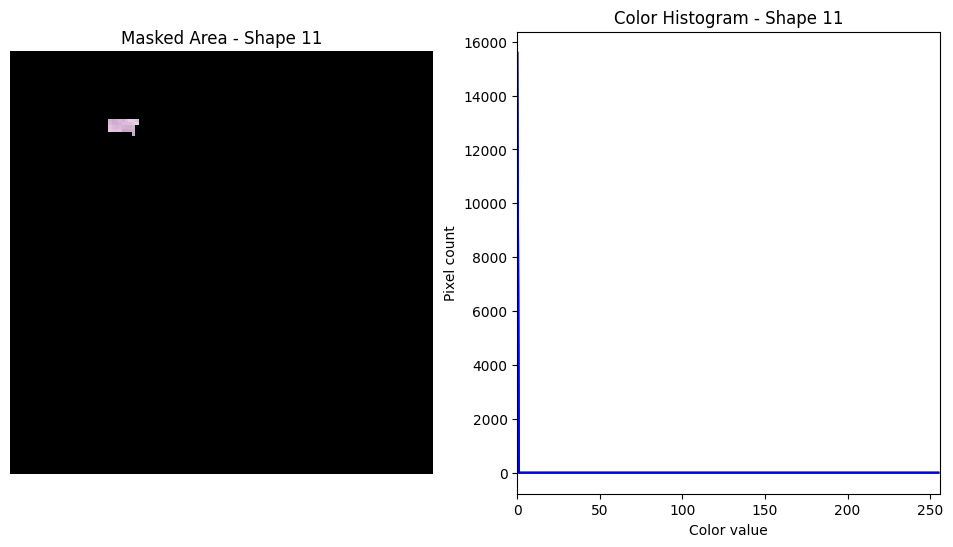

[(11.0139162158016, 24.061921097186318), (18.789821482708533, 24.884228145563185), (17.946952722546087, 28.85826824329237), (10.3370503677001, 27.869829129003307)]


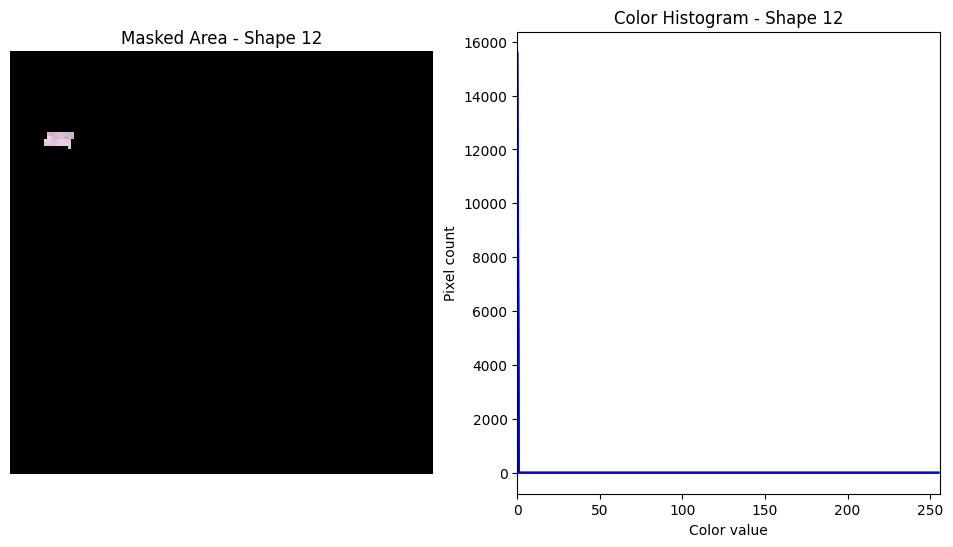

[(19.78365138828812, 24.717983341144414), (27.56152730434175, 25.540467954359286), (26.718822287135595, 29.51502607614341), (19.10697427560325, 28.52638884197165)]


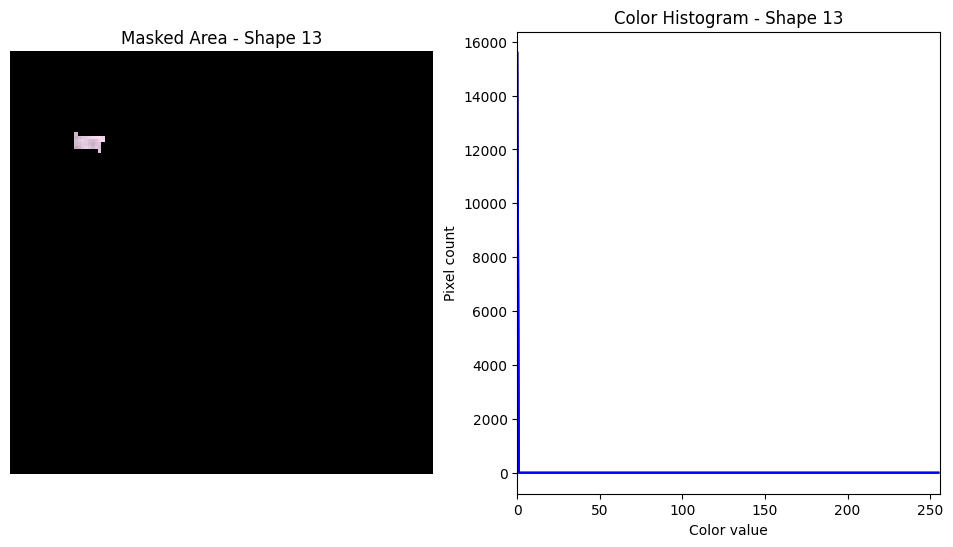

[(3.2140428169152813, 29.695348087806), (10.988707424355027, 30.51825766076402), (10.145637597415371, 34.49228953655495), (2.5369645920686423, 33.50325820047189)]


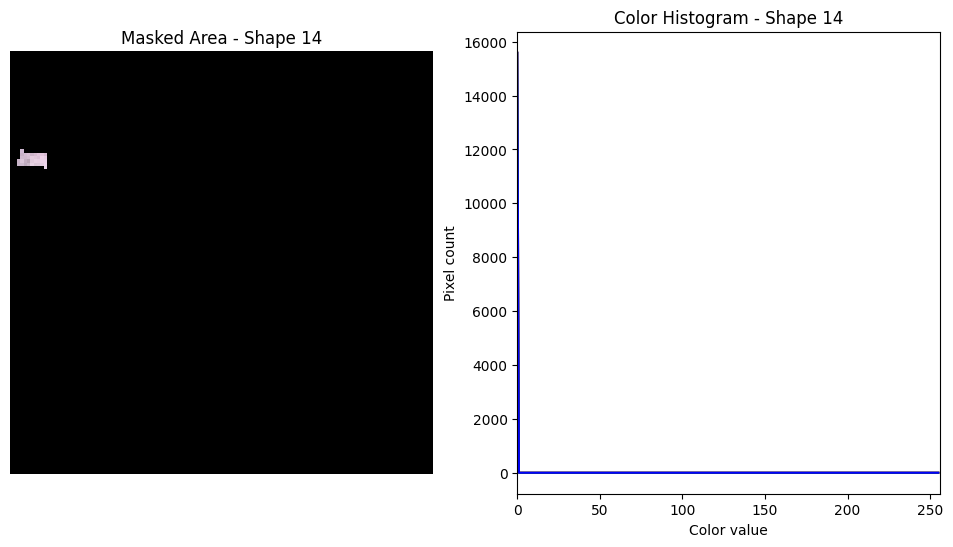

[(11.496202842859988, 27.703524630451422), (19.272513357796957, 28.52628249996195), (18.42962142948639, 32.500613530060804), (10.819321532896396, 31.511717836896597)]


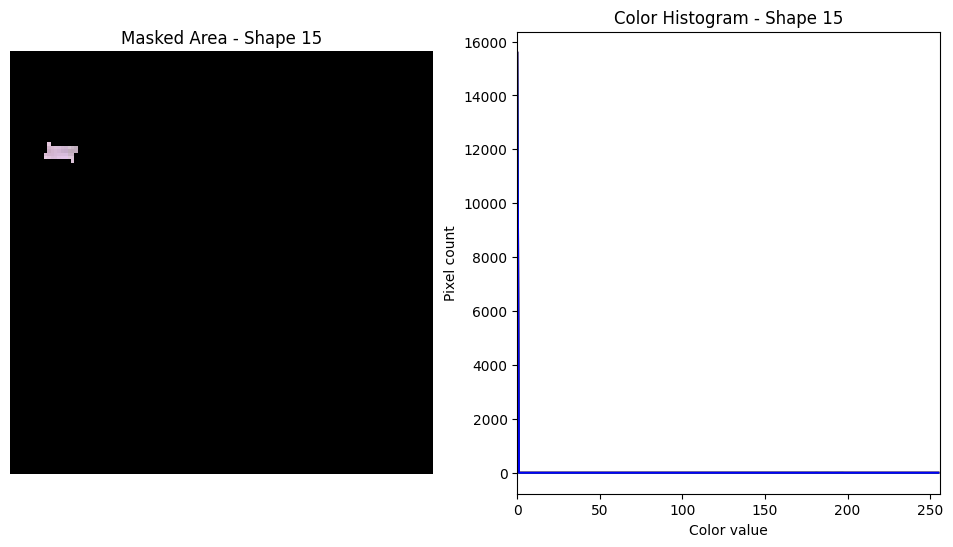

[(11.812376482821406, 31.511119803876568), (19.58906961498917, 32.33434699457783), (18.746149826456787, 36.30897214204669), (11.135474858877645, 35.31960153046978)]


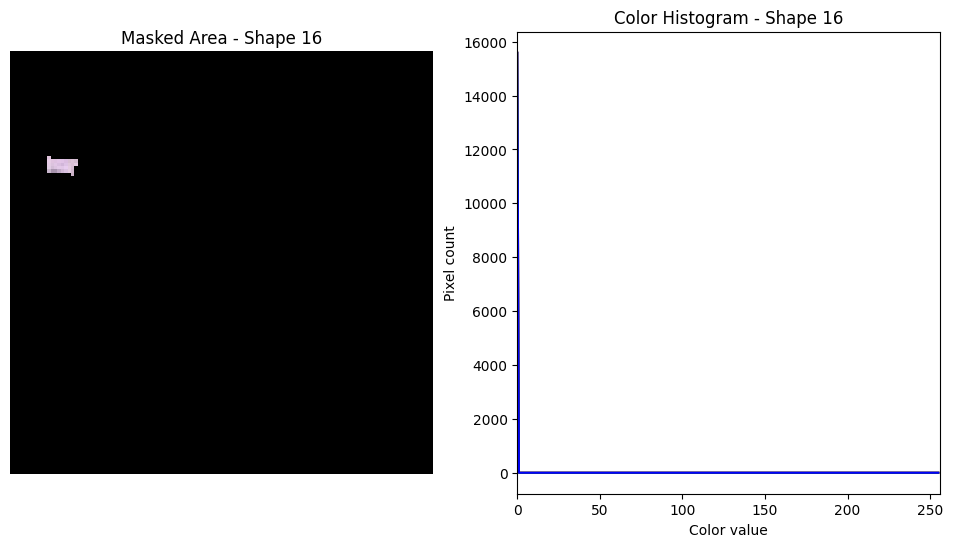

[(11.797540872914707, 35.31923682008846), (19.57454432554735, 36.1429297559973), (18.731590271452237, 40.11783131767763), (11.120611630735368, 39.12799010719706)]


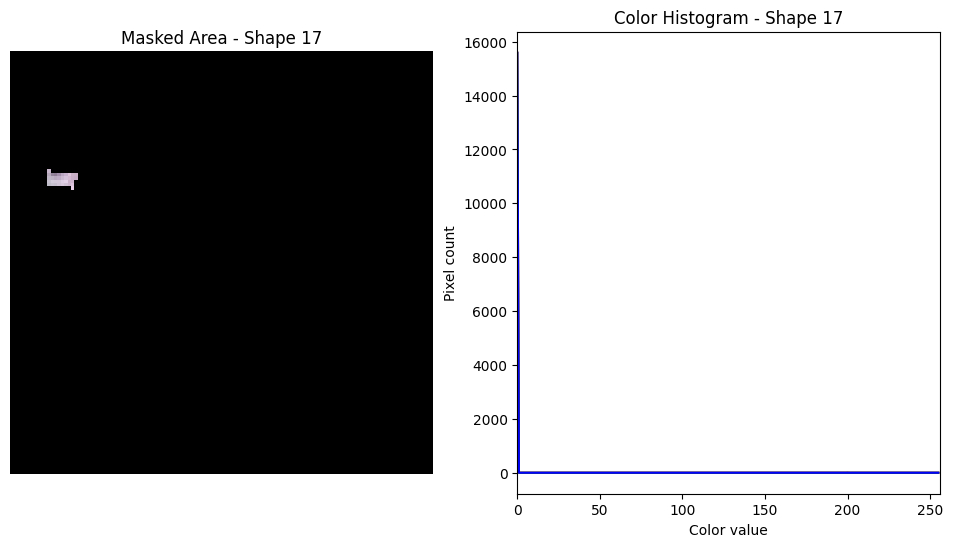

[(34.7802117973896, 43.9200125150808), (42.5629474024812, 44.745013557237655), (41.7203613594981, 48.72177385376151), (34.10372815298729, 47.73056184113796)]


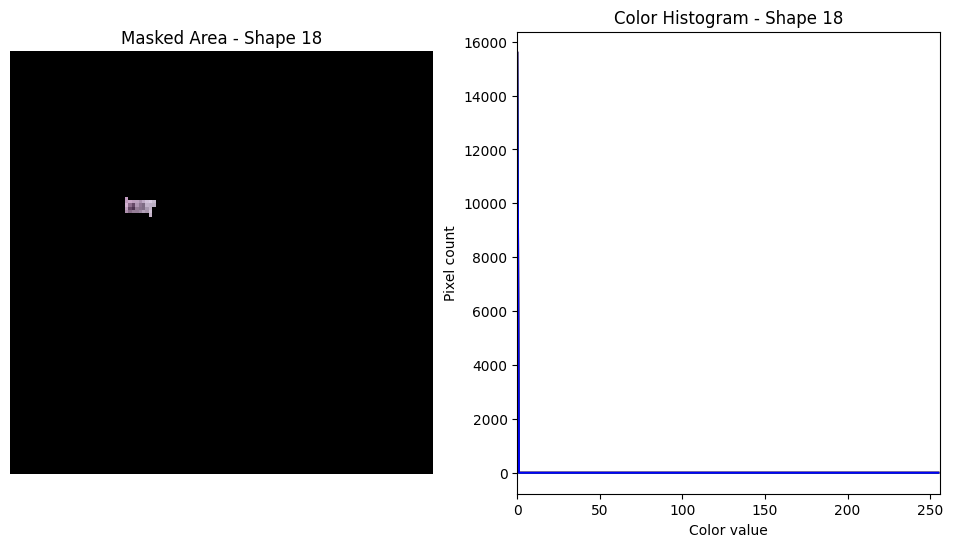

[(37.53855255381609, 14.108652831312298), (45.31943562523497, 14.930036384663737), (44.47716873832701, 18.904774282662885), (36.86234320766755, 17.917211812934056)]


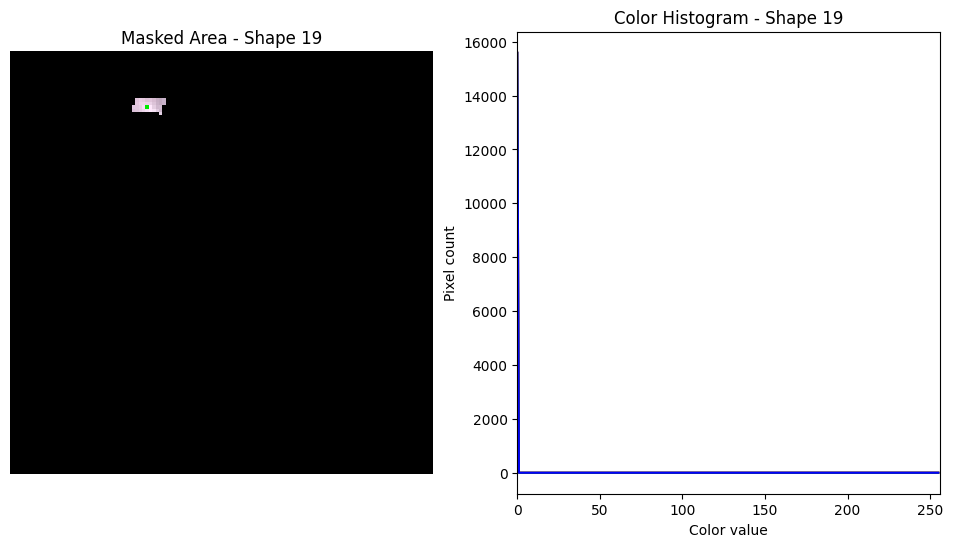

[(2.679308233361411, 39.29777653595952), (10.454646556197332, 40.12185488594551), (9.611480684712348, 44.09655705989812), (2.002149373328791, 43.10634582531151)]


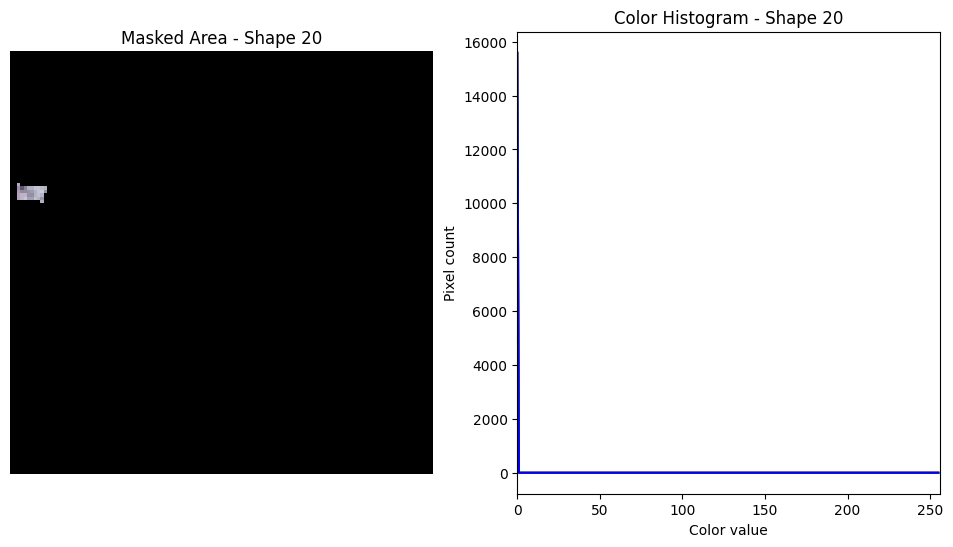

[(2.002149373328791, 43.10634582531151), (9.360274073536516, 44.84188022542466), (8.604688647716529, 47.57472540895384), (1.329259715938946, 45.838803187960735)]


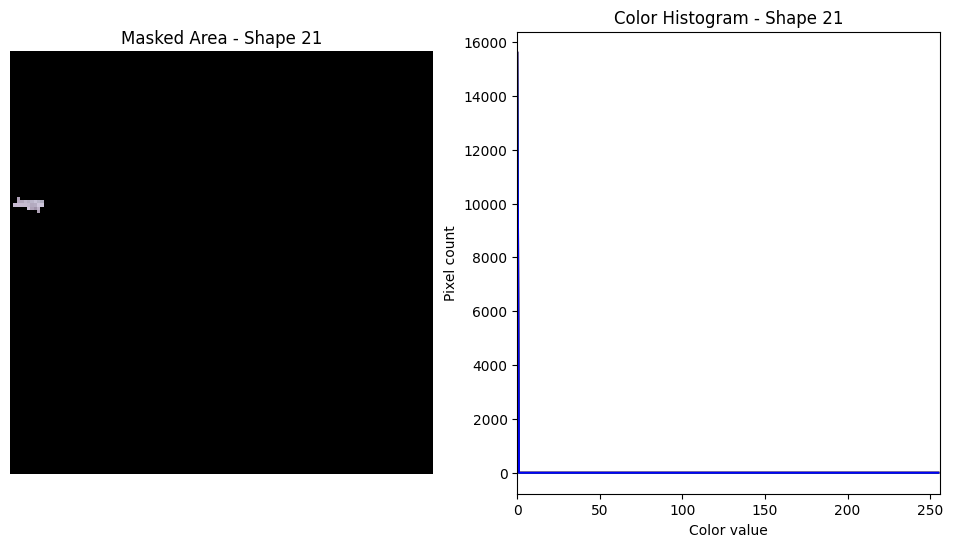

[(8.43330504013636, 49.06532339467995), (16.210705055039, 49.890660950542895), (15.367563276293708, 53.86638279102664), (7.756203067835571, 52.87488688290179)]


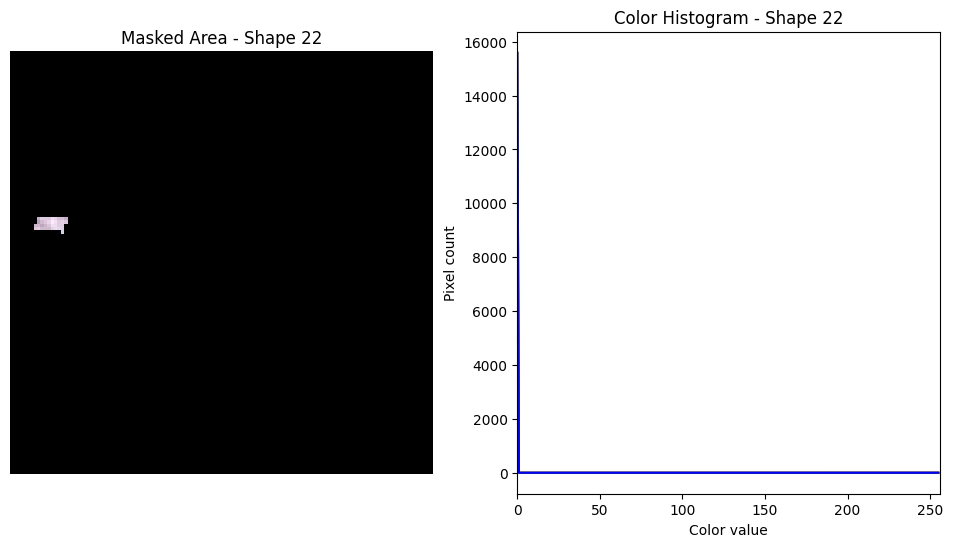

[(15.528020440609254, 55.191552763954405), (23.30747560705251, 56.01771914470203), (22.46441641328039, 59.99426754511745), (14.851031099385269, 59.00191900469173)]


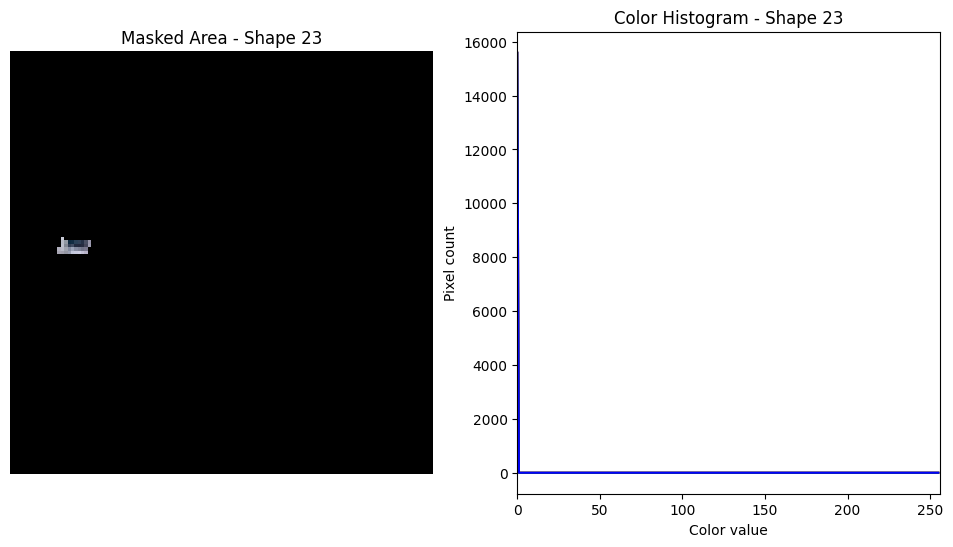

[(51.09716825301791, 20.62200722149564), (56.89825814834268, 19.95516555355104), (57.22058725416588, 22.60498340523128), (51.41813419625669, 23.60290585858661)]


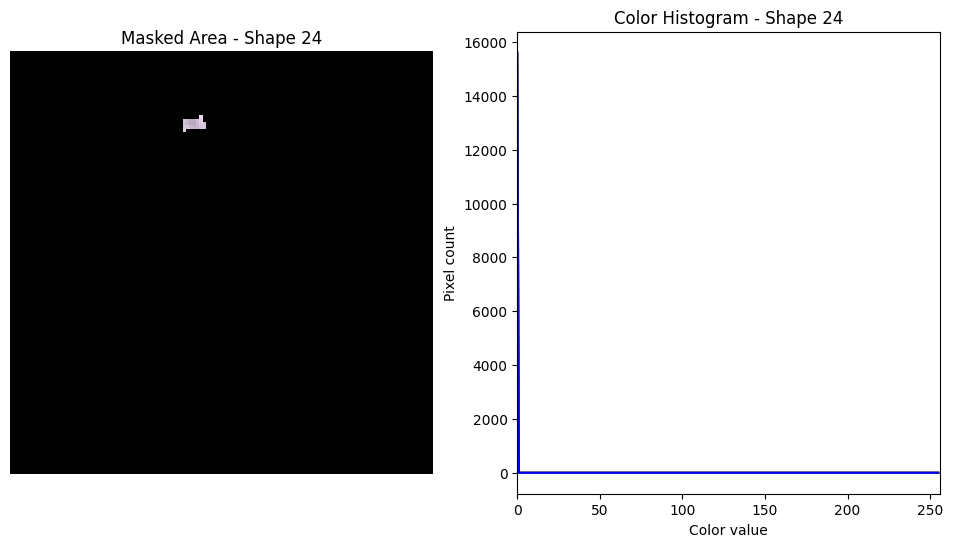

[(22.041630486455347, 40.44745601054328), (29.82129529150868, 41.27189034156624), (28.97849365453928, 45.24771462244101), (21.364890516677605, 44.257102409748114)]


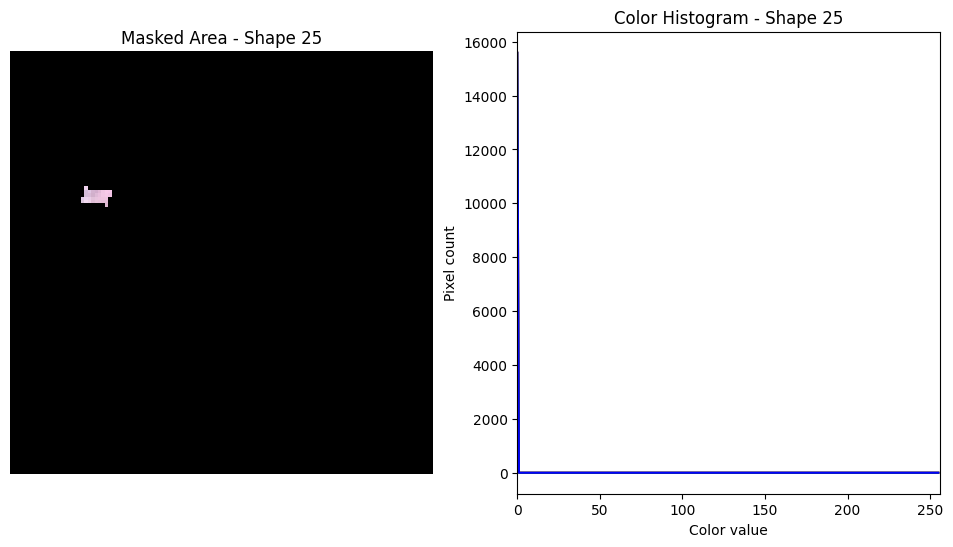

[(25.203812566299604, 36.13989161818057), (32.98381385007099, 36.96383395970548), (32.141111820236006, 40.93951422642112), (24.527173235497717, 39.94939242285017)]


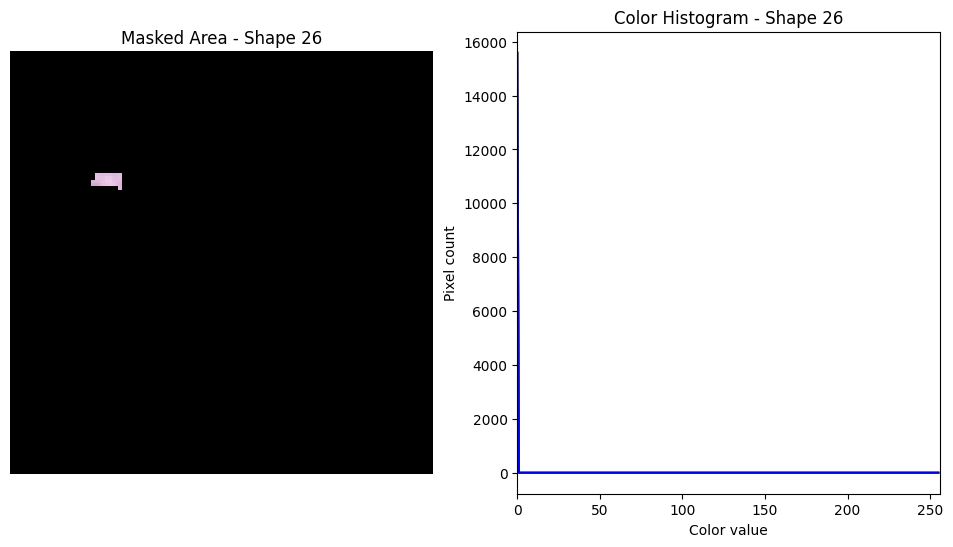

[(29.8679381799756, 28.68506944195661), (37.64834505113521, 29.508151360067984), (36.80579975786671, 33.483539038398106), (29.191455173518705, 32.49427674048809)]


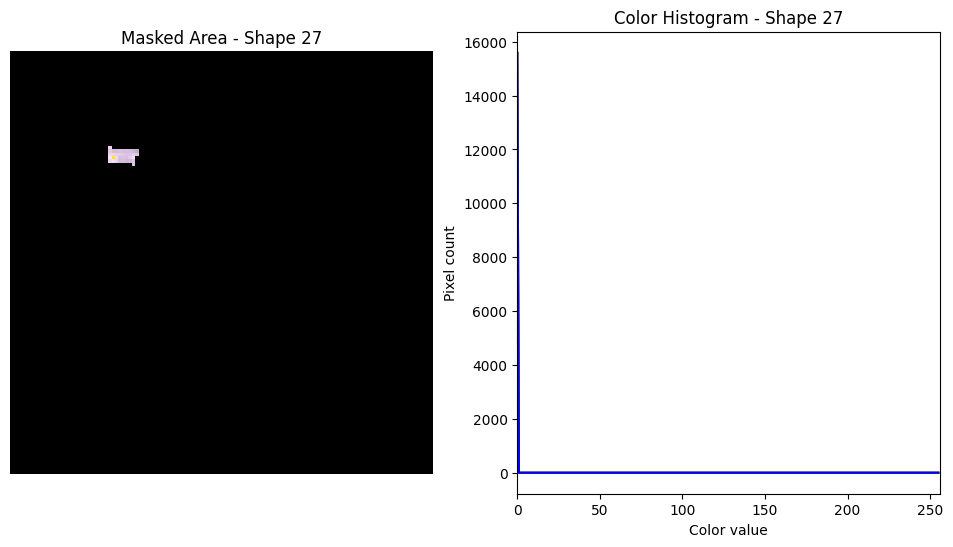

[(31.77935587879557, 49.22245935992612), (39.56187214605055, 50.04807608126811), (38.71918072896548, 54.02506151328751), (31.102768014029408, 53.03323376320333)]


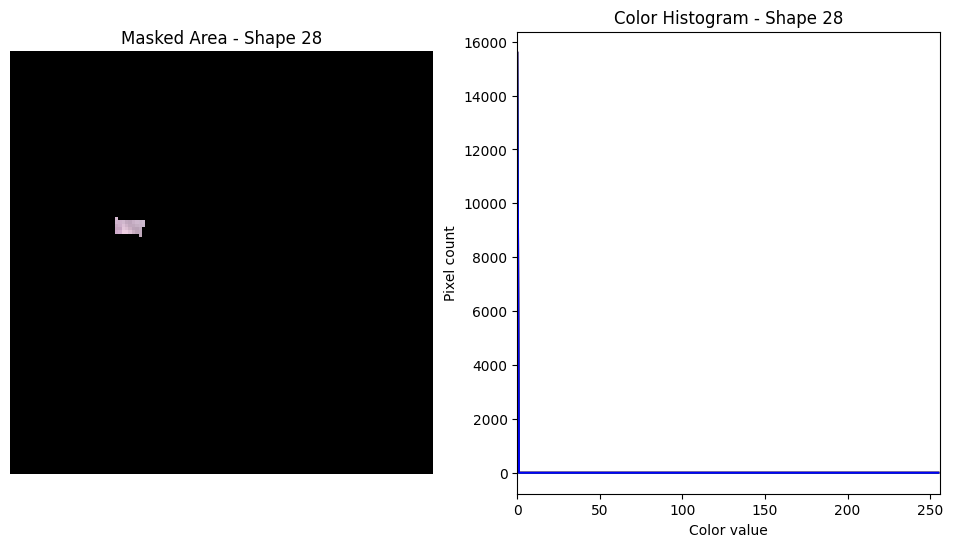

[(34.155265226374354, 33.65068463518324), (41.93701833894176, 34.47442182272033), (41.09451175182275, 38.45040092080484), (33.478841303013695, 37.46046734439389)]


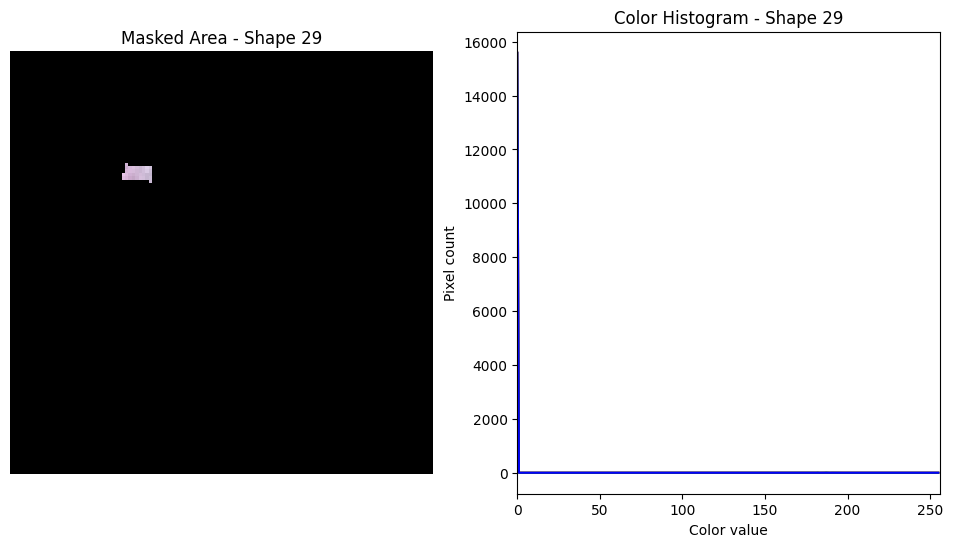

[(43.39721856927929, 43.08788672919735), (49.68955033543057, 44.16206827744443), (48.93344440820198, 47.144918976702485), (43.05494424409048, 46.15310174563649)]


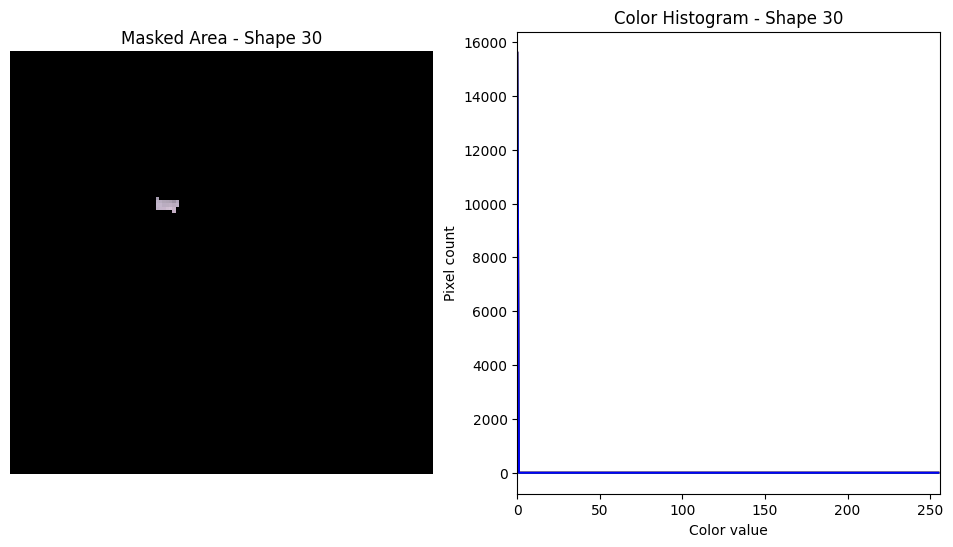

[(43.10108338820032, 33.21489316575568), (47.41067234194804, 32.549807428381484), (49.04479689030967, 39.0096426614933), (44.23713141579023, 39.84036799260815)]


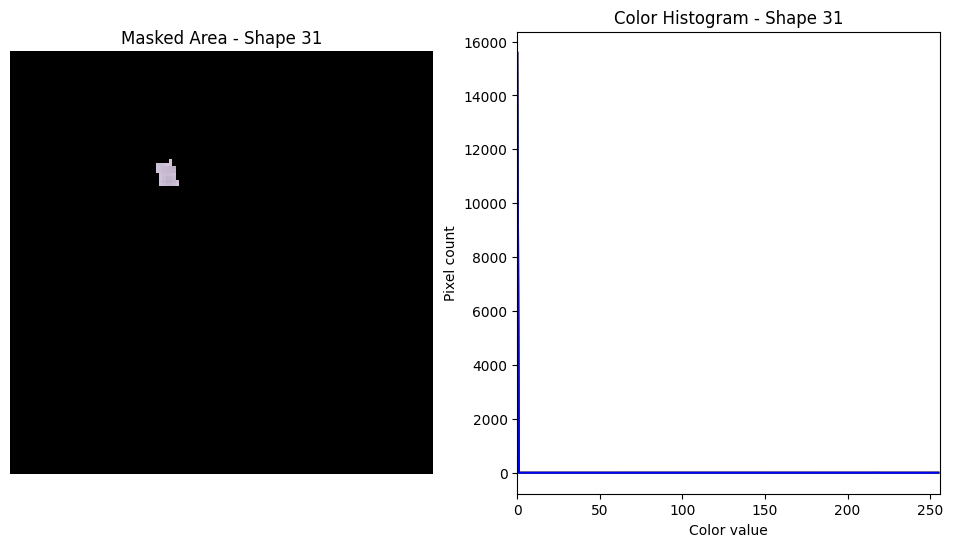

[(50.75509619763966, 23.702749250862663), (58.04790346088794, 22.952221750505714), (58.41537261498468, 26.960553509260848), (51.12201370430665, 27.76044571042189)]


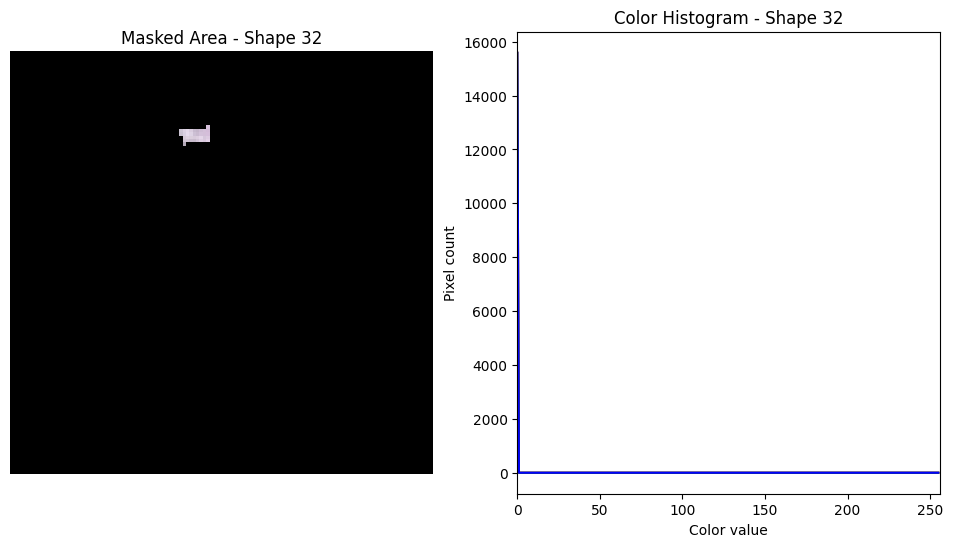

[(56.373601023023696, 28.00549453362817), (64.15974710416168, 28.828787549907812), (63.317721098021934, 32.80554713854073), (55.697708174986246, 31.816015034214843)]


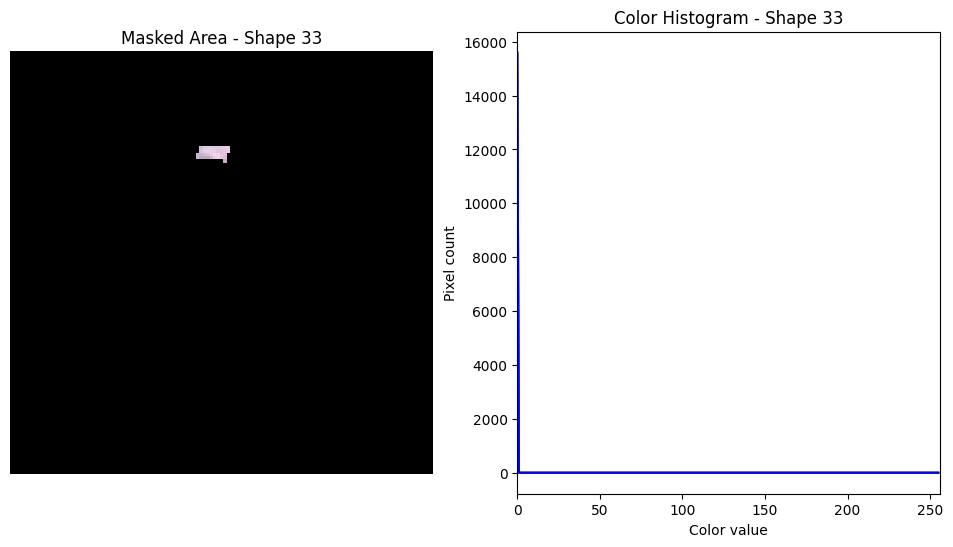

[(57.83049983476451, 38.11051193512634), (63.9281448157339, 38.60449556418095), (64.03391907404983, 41.67008087091307), (57.45503598984965, 41.292028912555054)]


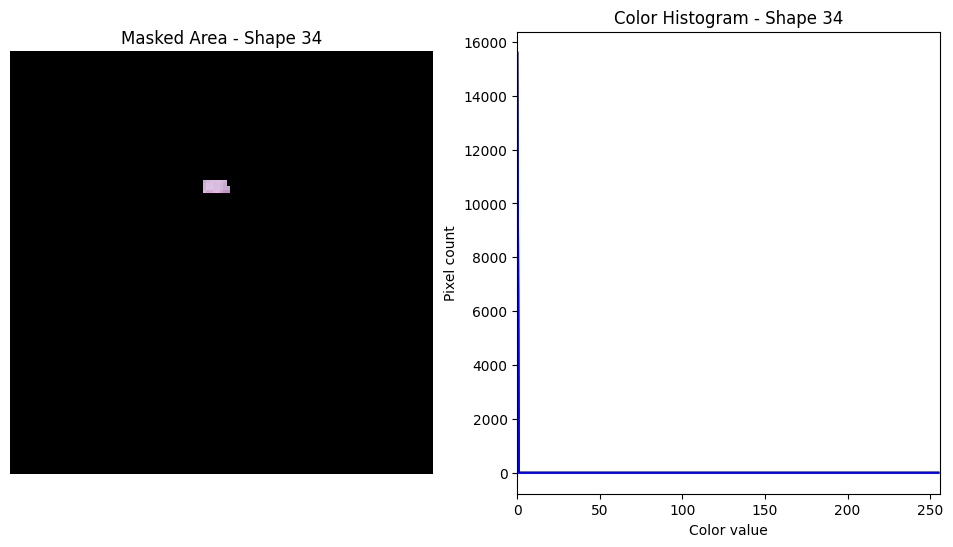

[(65.78097099992067, 39.713819204169226), (72.24870739983362, 39.01459334323505), (72.48282886695642, 43.48926701235084), (65.56836942081554, 43.82376370434497)]


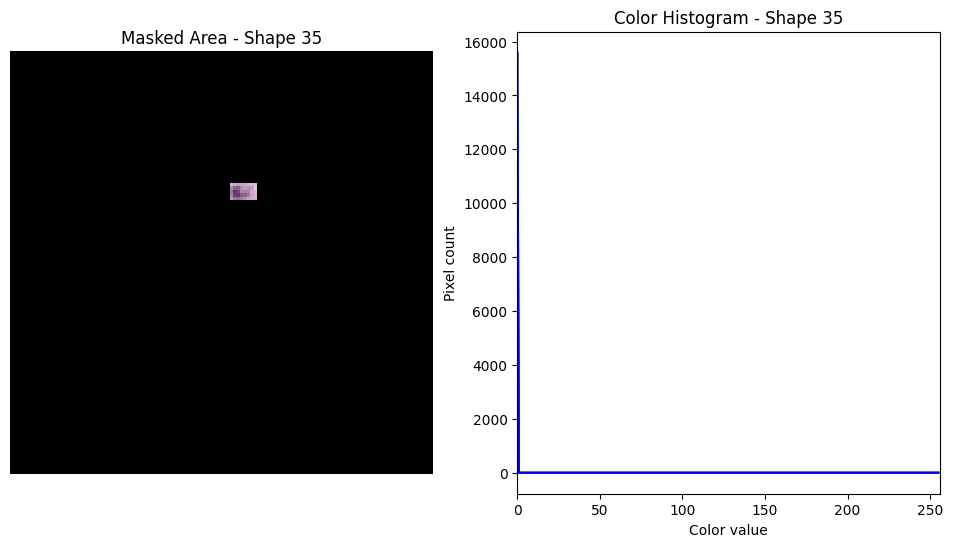

[(60.1777699181676, 44.8204109451691), (65.34966292634255, 44.78508003316583), (65.54059130458921, 47.18814348625867), (60.234645594039705, 47.60453362565824)]


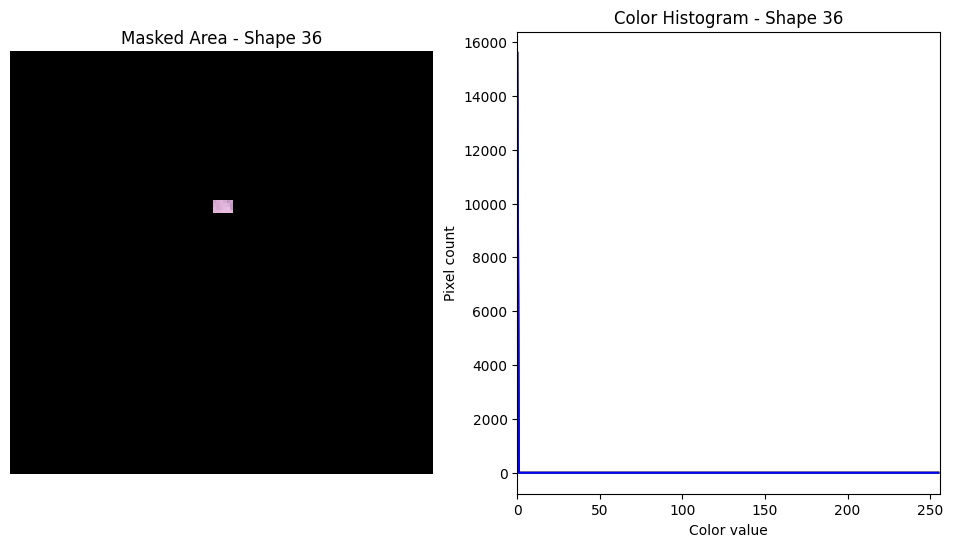

[(53.661648352245095, 45.601976541194745), (58.753073819099086, 44.60558406112034), (59.25934369146592, 46.82600460712729), (53.867707034951366, 48.31955884903925)]


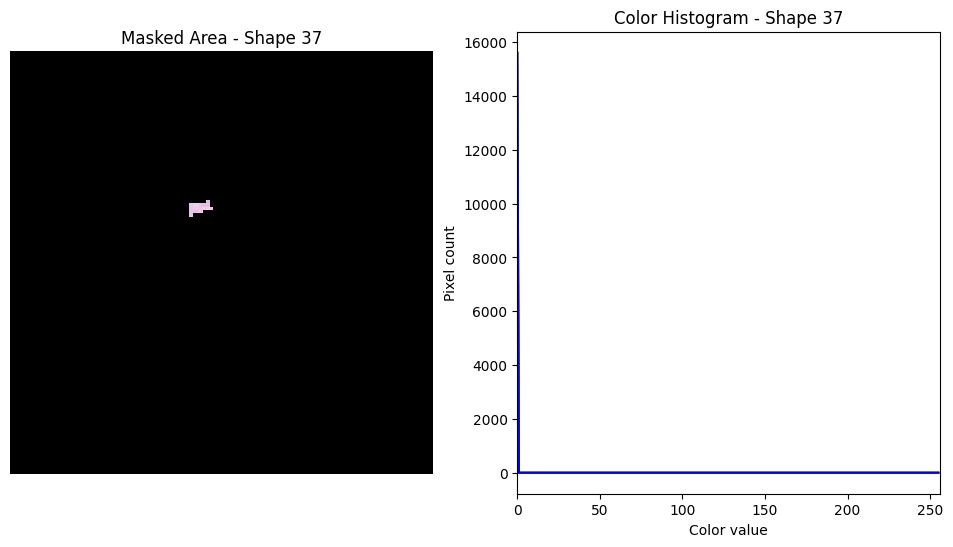

[(58.22438586418474, 19.78853472952457), (58.04739526455984, 23.10129527827073), (65.83405442562162, 23.75834911869592), (66.17709536495425, 20.2794257479828)]


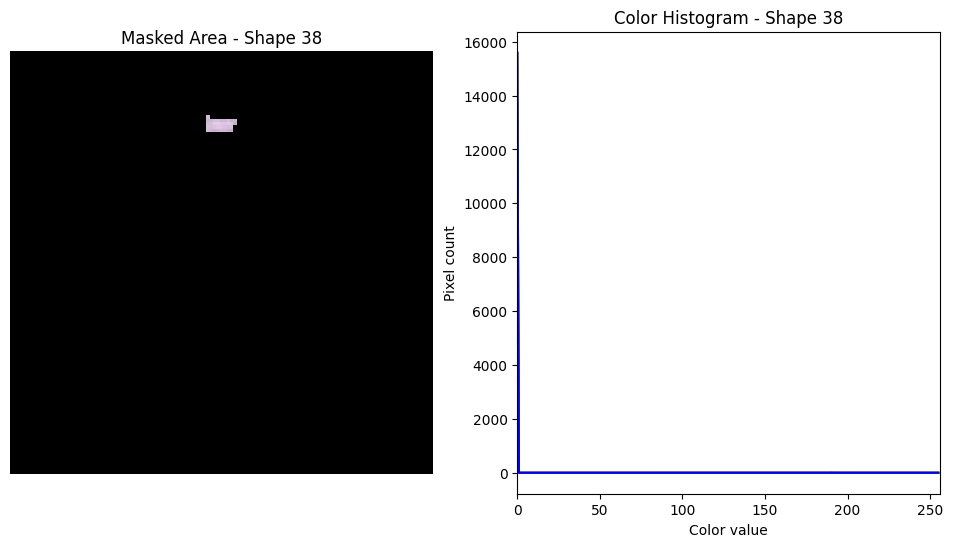

[(68.83767618343325, 17.627075195279673), (68.00021945346612, 20.278052733272403), (75.45350878069394, 22.09480168553239), (76.12569623560819, 19.277938267605435)]


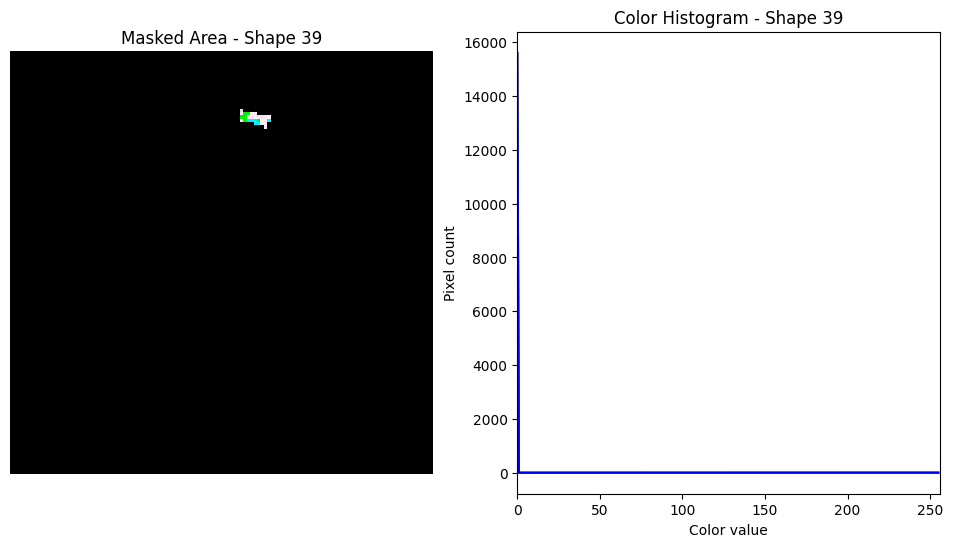

[(82.246371410368, 23.581064945617385), (85.22282976350937, 26.23022270030347), (81.7259039408973, 30.87243089190096), (78.08434608754578, 28.886185398757164)]


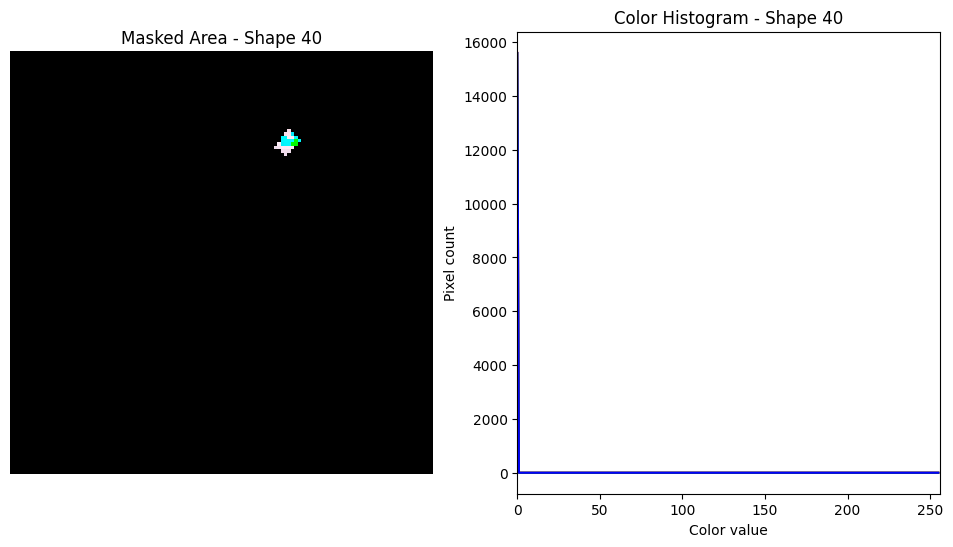

[(68.14626689131819, 26.24171107481669), (68.13641818458666, 29.223883703839988), (74.2742970907924, 27.8944610724096), (74.28395363257465, 24.91212541140419)]


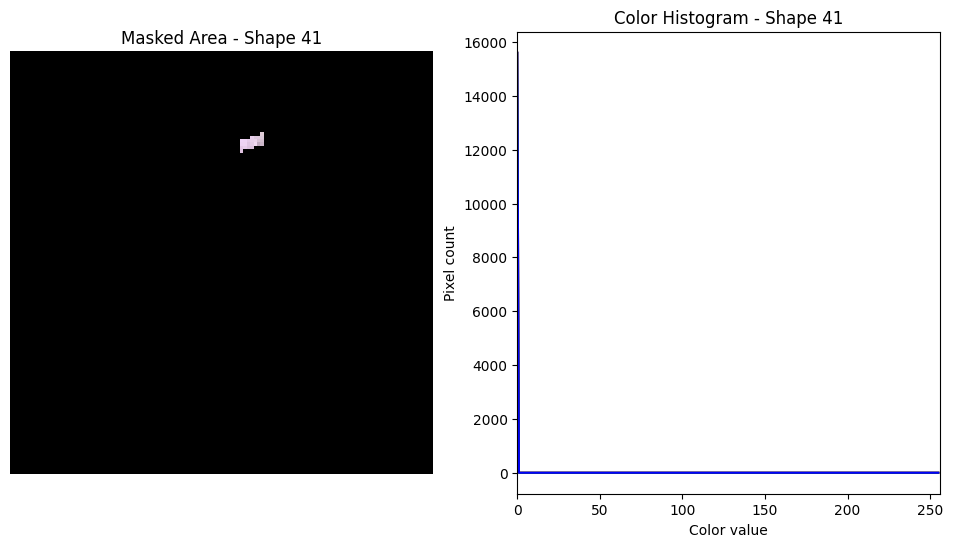

[(68.46575112593689, 29.886407427332387), (69.61411887459462, 33.530940054838084), (76.25096524808203, 31.87001267738077), (75.76584930895427, 28.059184706679417)]


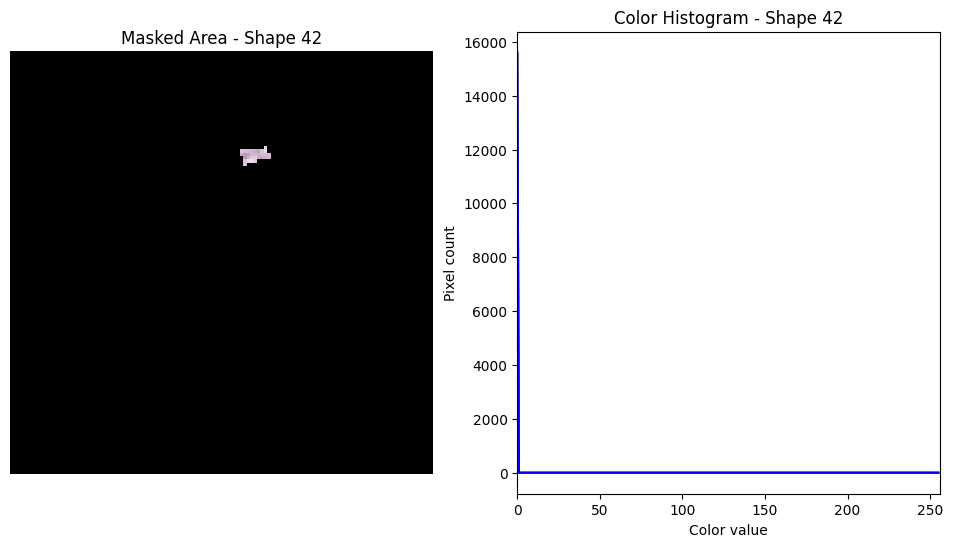

[(69.11462101020891, 34.194025286993735), (70.09730304270505, 37.83907428937508), (77.06987216916644, 35.018125471473155), (76.58256636592722, 31.869814758752653)]


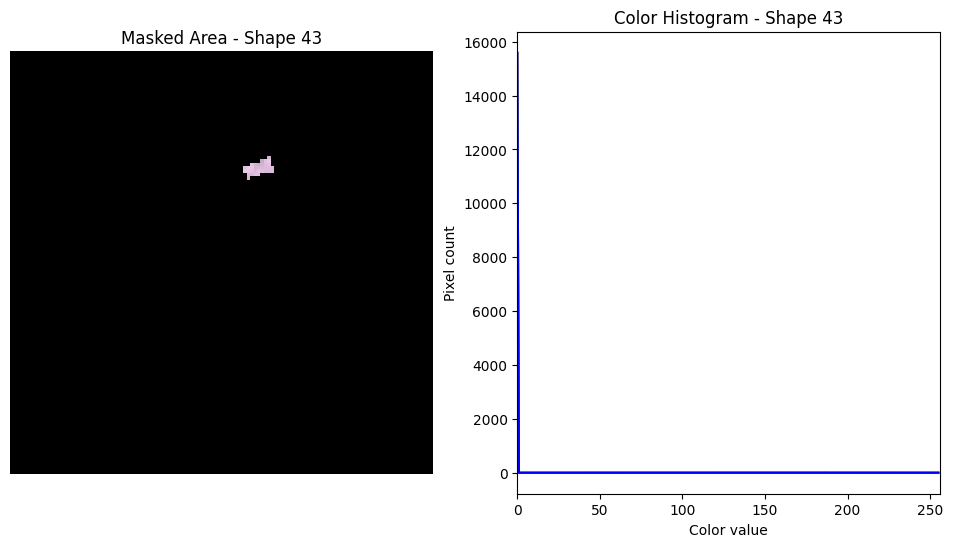

[(92.66978687539074, 31.528723783555307), (95.64662536753656, 34.51053980775825), (91.81867488101813, 38.65668381053143), (89.00442032979782, 36.834772042421775)]


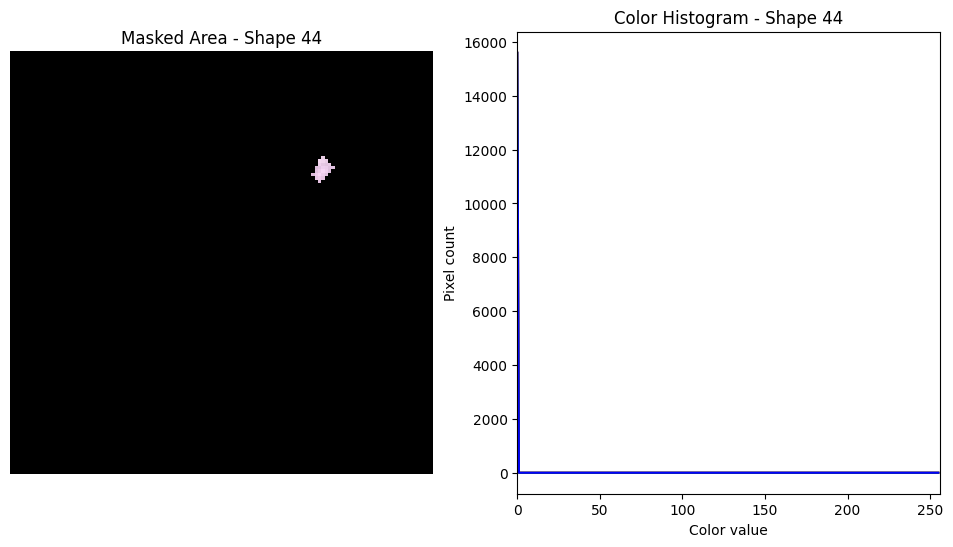

[(96.10843120676134, 35.405404772076565), (99.08577609622176, 38.38775901580277), (95.2574646643206, 42.53423514818735), (92.4427676543918, 40.71194249458043)]


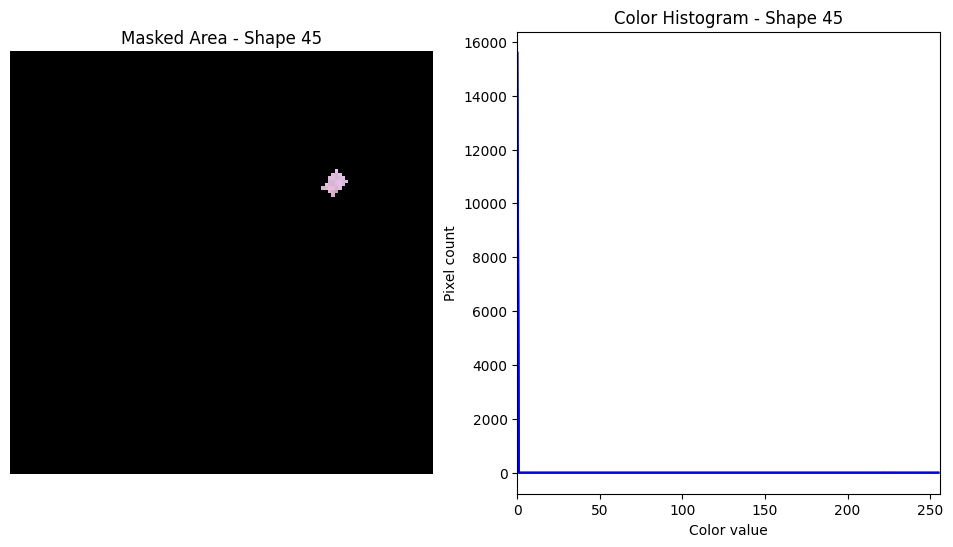

[(114.5539071235313, 25.94525192067985), (117.5330161043148, 28.927371128309854), (113.70399335871878, 33.07453628494079), (110.8878231836319, 31.25251411235624)]


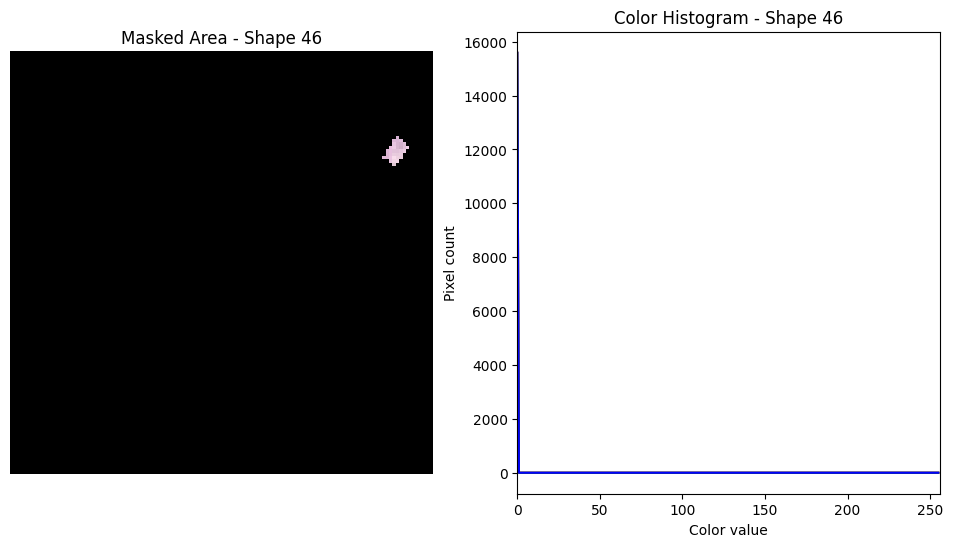

[(118.52522825283762, 30.25309990243707), (121.50491697001462, 33.2358232644053), (117.67548419771572, 37.38336588039735), (114.85880788343968, 35.560916741426325)]


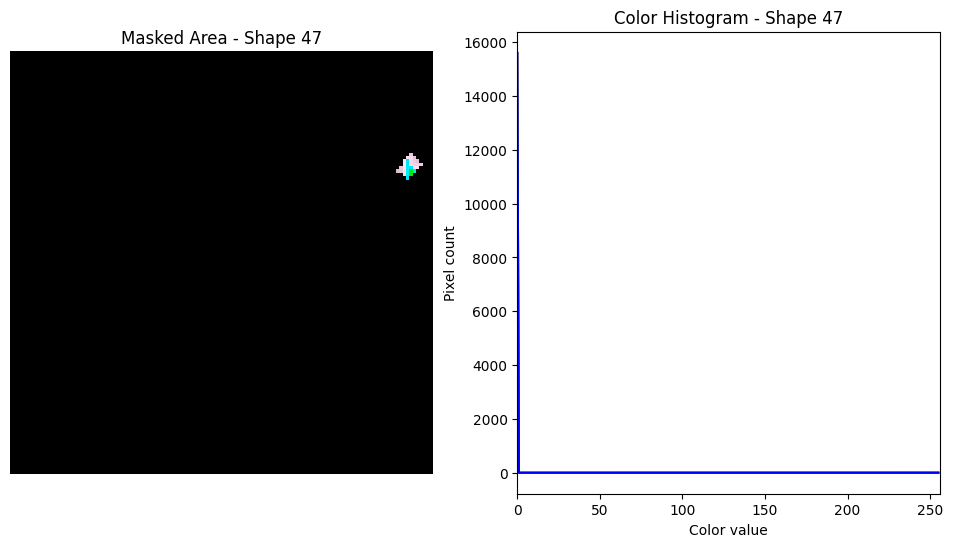

[(119.30912089139424, 46.9183575897768), (120.7066319149049, 51.89388741457401), (114.64036798994232, 54.21803070624307), (112.90785961815676, 50.486642285921306)]


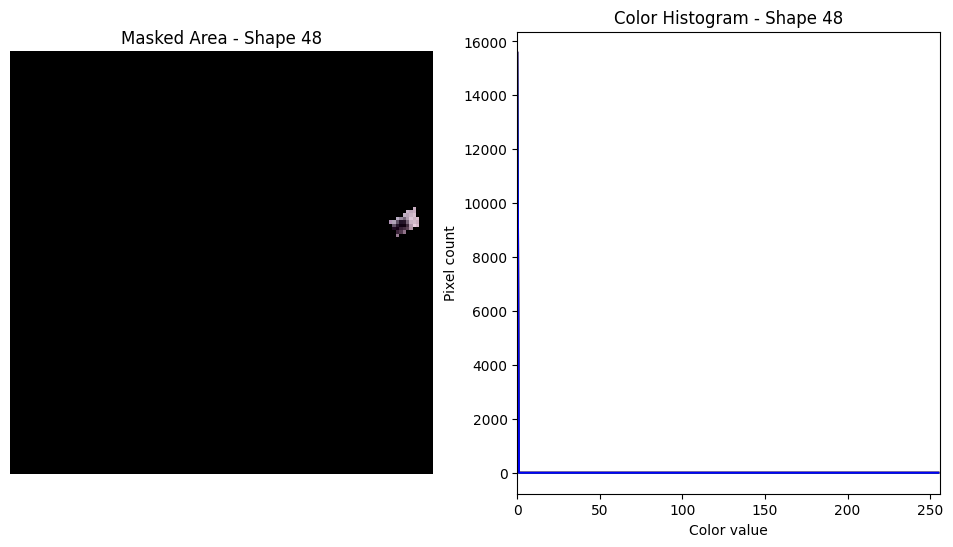

[(112.1491153498302, 54.63343674694392), (115.12885909775162, 57.61842043536117), (111.29881754044813, 61.7664871318334), (108.48202202274688, 59.94232968029155)]


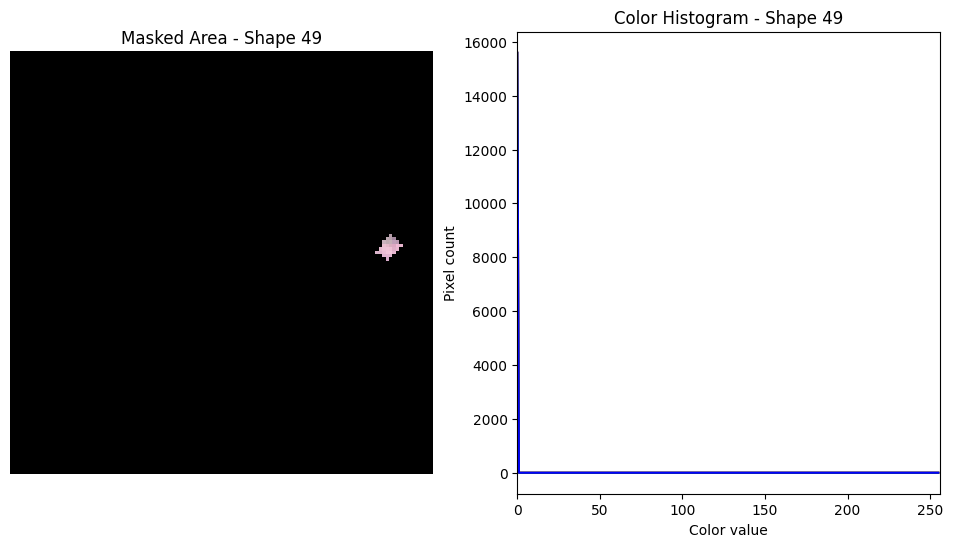

[(31.596012247522083, 54.02718799493968), (39.54426142362945, 54.93619696378795), (38.536146362376, 58.8307163257073), (30.9193859328241, 57.83829666618488)]


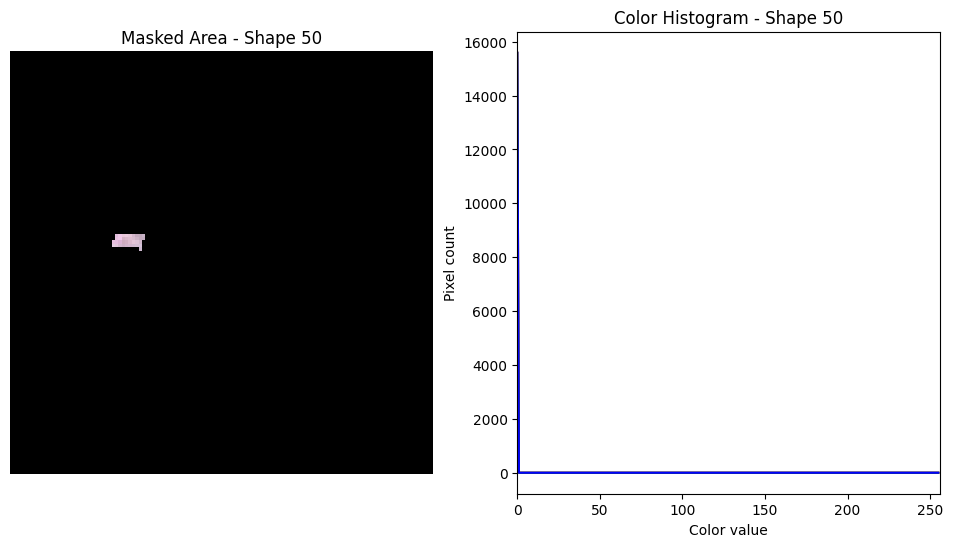

[(1.3619304112874318, 58.342501388072094), (8.228046500816248, 59.16910431501989), (7.637556190482087, 61.98538926670784), (0.6074979484403684, 60.7444123694608)]


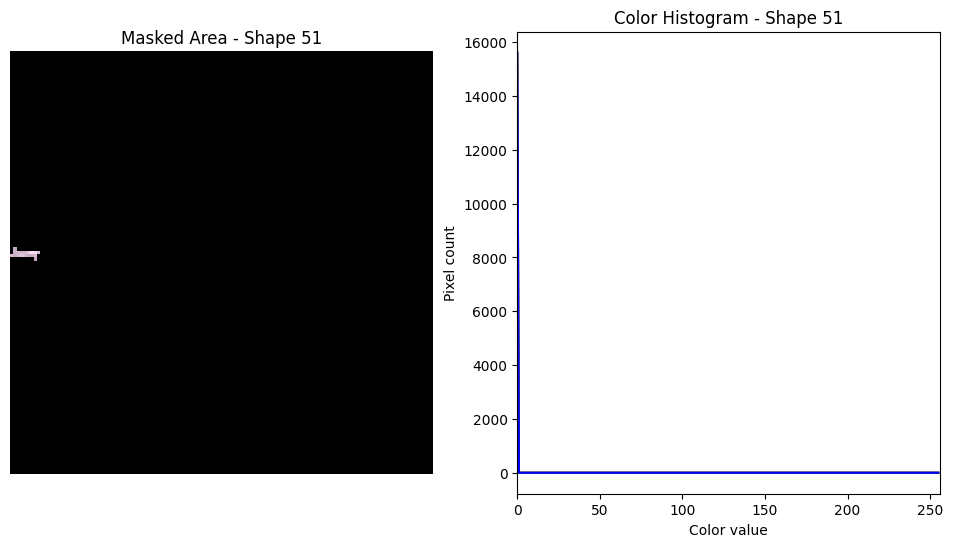

[(9.056424883376792, 59.00326058026289), (16.834779350178593, 59.82982139743871), (15.991560941334086, 63.80630020726343), (8.379265427387196, 62.81356688552279)]


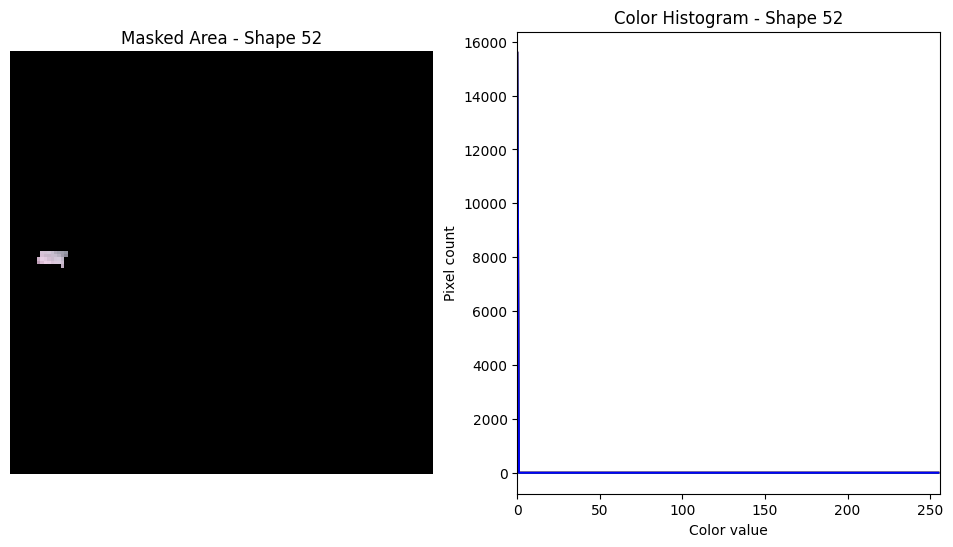

[(24.458631499188957, 58.17126234188643), (32.240284304187725, 58.99789301976208), (31.39737136628719, 62.97513739734595), (23.78181792639185, 61.98230066381368)]


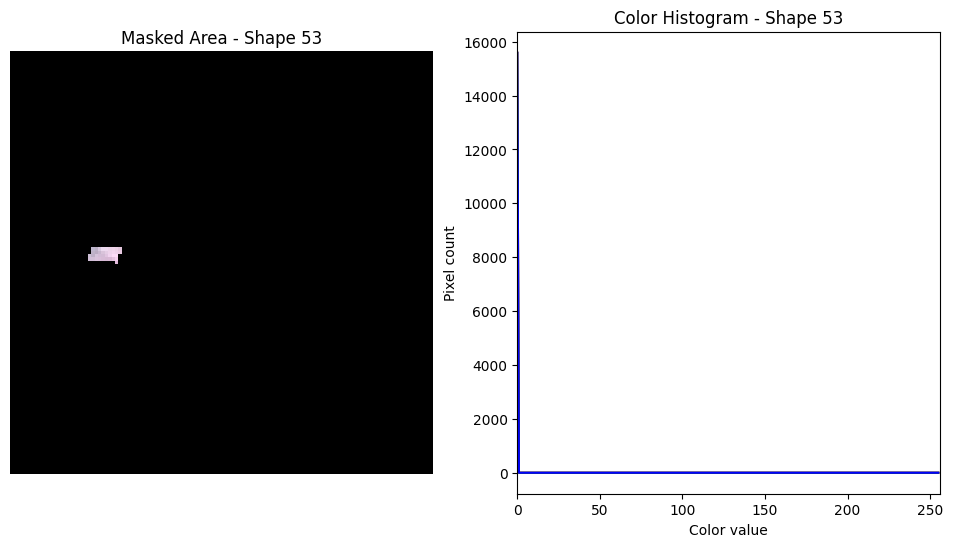

[(45.82437639592069, 59.49195753938093), (53.6108096476479, 60.31898812909009), (52.76829871209248, 64.29747470474533), (45.14802523623018, 63.30418834253692)]


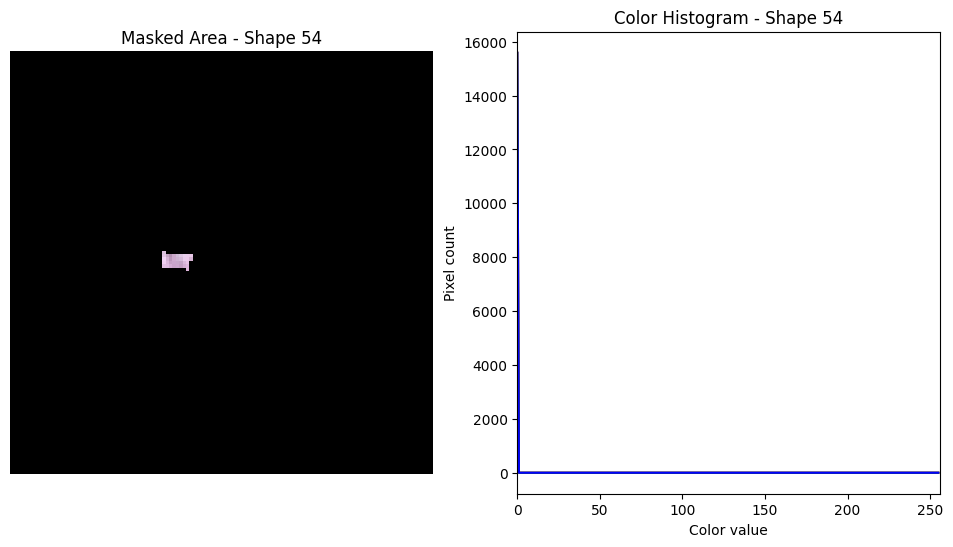

[(46.41724603751754, 55.84571337149293), (53.79143791230922, 56.0094358106648), (53.53394913463245, 58.57858274904743), (46.40729956057544, 58.66314033489897)]


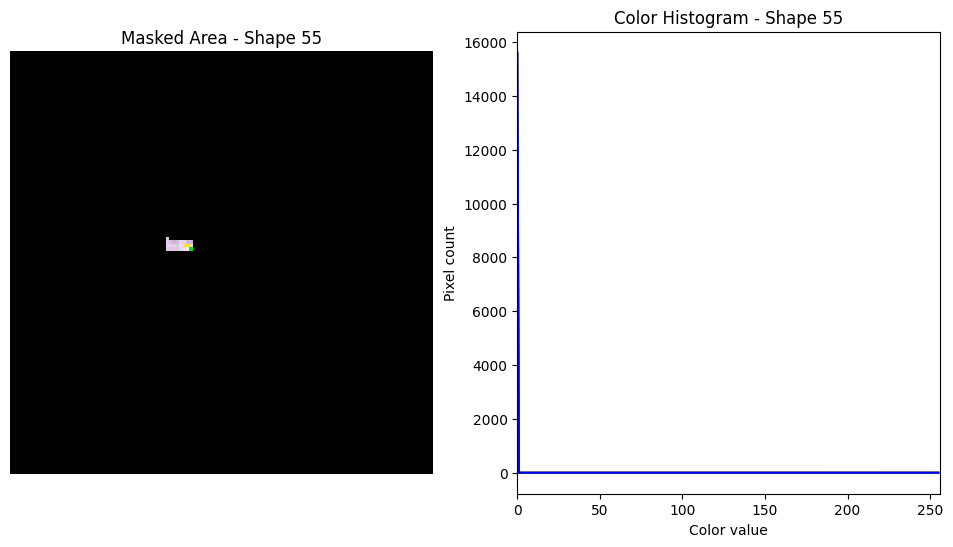

[(47.7391878027828, 52.1994566377202), (53.572628033079184, 52.18099895338065), (53.69330955003119, 55.62825567998959), (47.295978667948646, 55.71289051253447)]


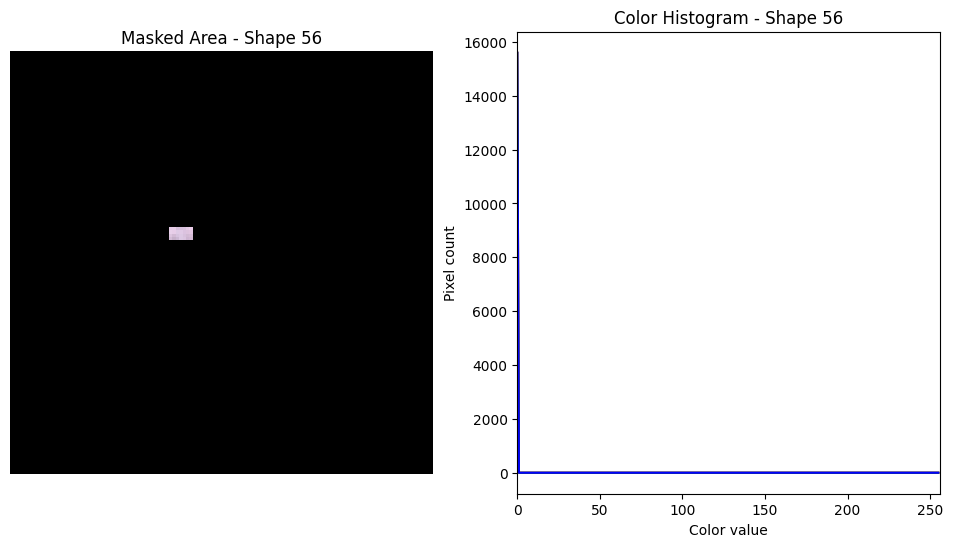

[(57.48245834088601, 57.53336864791408), (62.36994210979759, 58.36098568936745), (61.89665072645715, 61.06321658778401), (56.76112977844531, 60.0365158791636)]


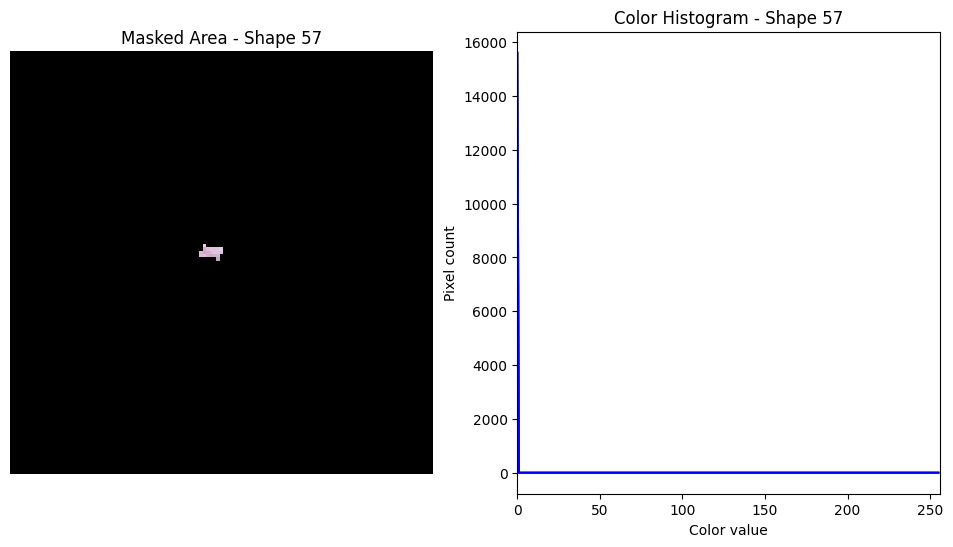

[(55.62659288612139, 52.52837680072443), (63.41459613532243, 53.35466386621903), (62.57233719627203, 57.33316908077308), (54.95050814546357, 56.34061314399728)]


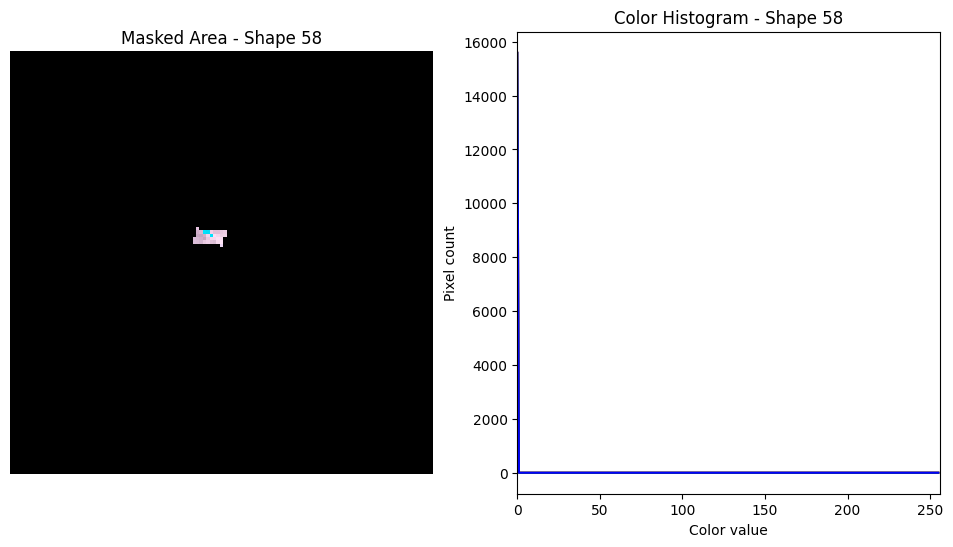

[(41.17921352214407, 51.78732437735201), (45.96966867112292, 51.20576600607816), (46.14327174505206, 53.65826498808653), (41.15254447728788, 54.60431583155105)]


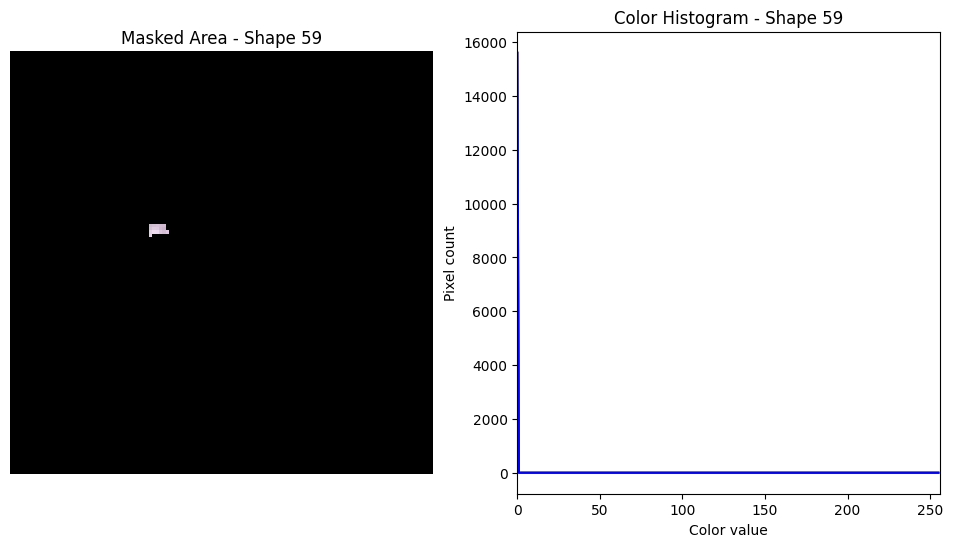

[(64.72758333961508, 57.33262195319679), (72.5179730587567, 58.15959881677915), (71.67584775872893, 62.13894206514041), (64.05166542352919, 61.14566971135173)]


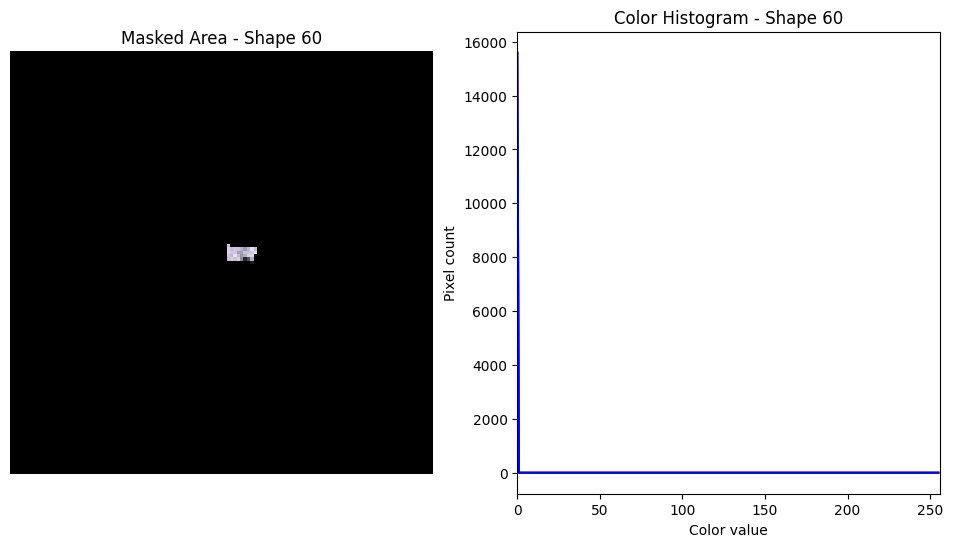

[(68.52680486420991, 61.642147912878926), (76.3183807939547, 62.46969502508608), (75.47629079518657, 66.44955593926699), (67.85094014999385, 65.4556992696476)]


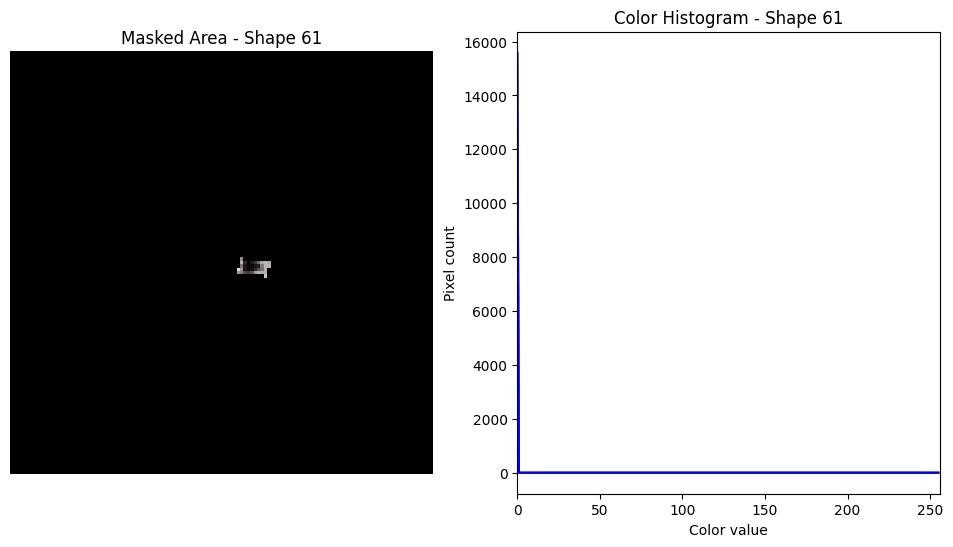

[(66.58270270802382, 47.88385223782009), (74.37271958235709, 48.70969252505921), (73.530714395372, 52.6884471273028), (65.90689335345769, 51.696319300976114)]


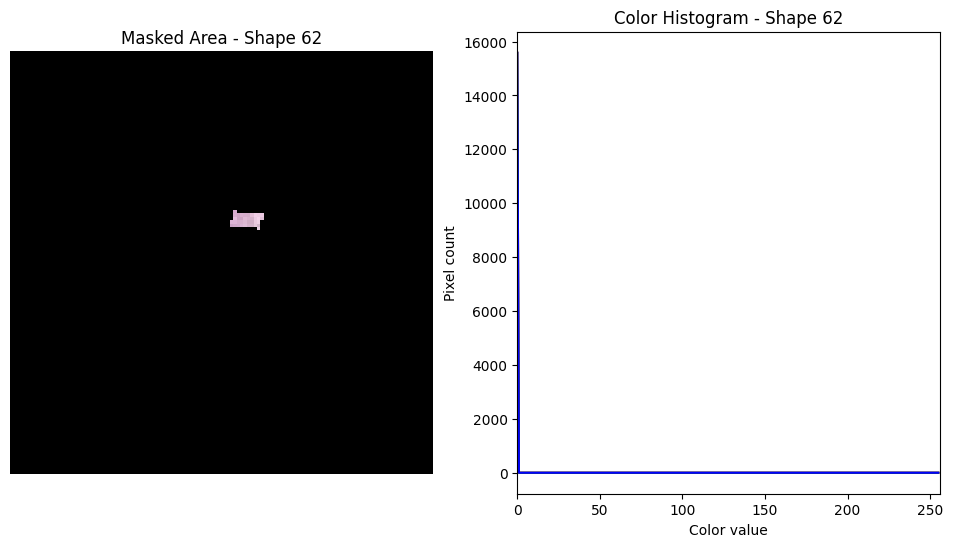

[(77.67580726635634, 52.9192347685466), (75.83662830760085, 57.56191800615756), (84.11983476951201, 60.710453509882), (85.79319354920415, 56.06706587741616)]


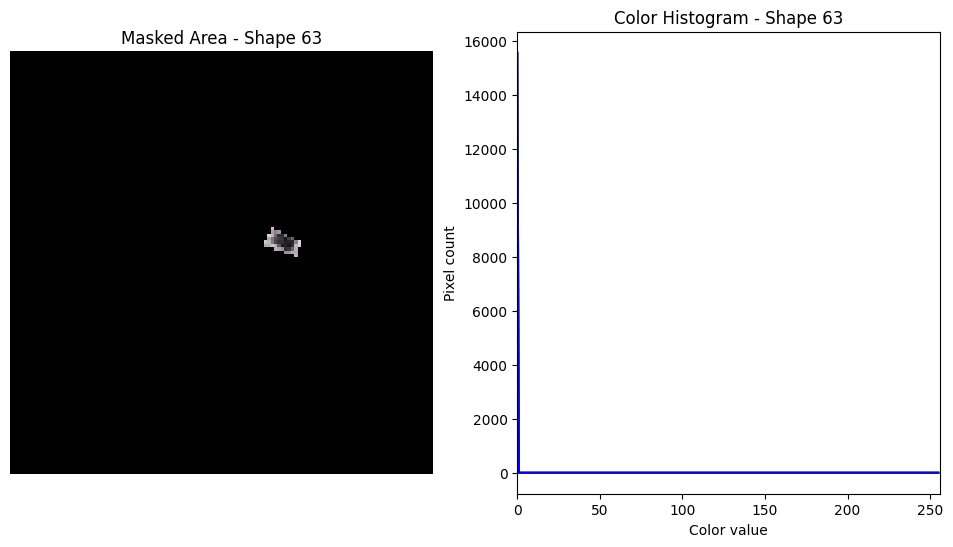

[(90.45911003863957, 49.26746153411065), (96.41831966633048, 53.742507386614), (90.4265645517316, 59.87994057213504), (84.79737913289864, 56.233148328554)]


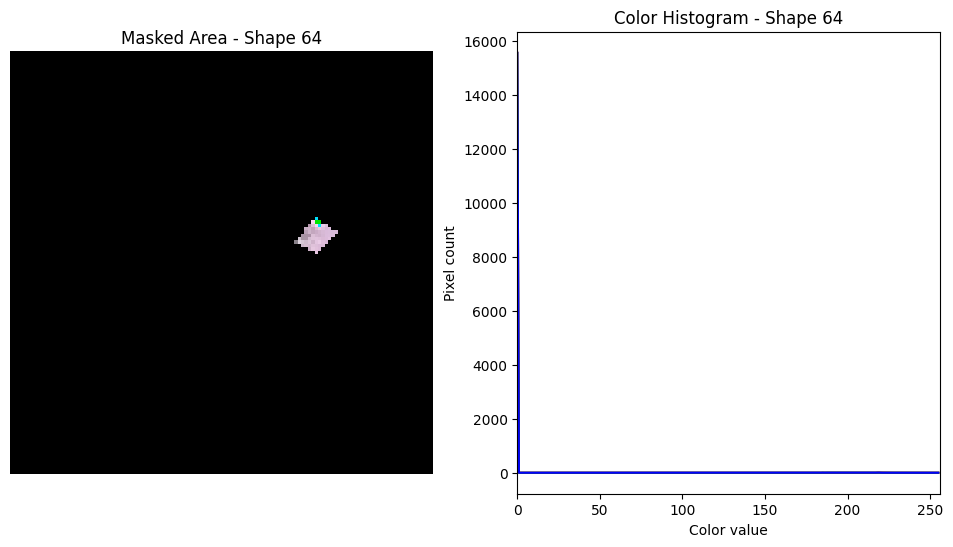

[(99.381487054285, 61.70245304504385), (106.16752045800372, 68.1708917109251), (102.339535004702, 71.65520869551071), (95.88460629056686, 65.6838699958536)]


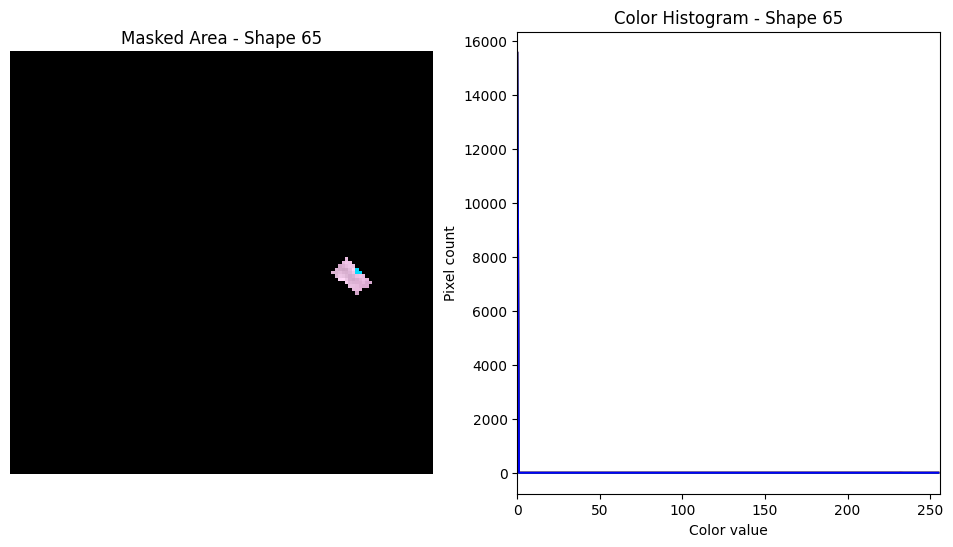

[(111.65903955506712, 63.524910098806174), (114.96781307039328, 67.672179056186), (108.64563918453932, 72.31851133557265), (105.33464756518764, 69.16639671011927)]


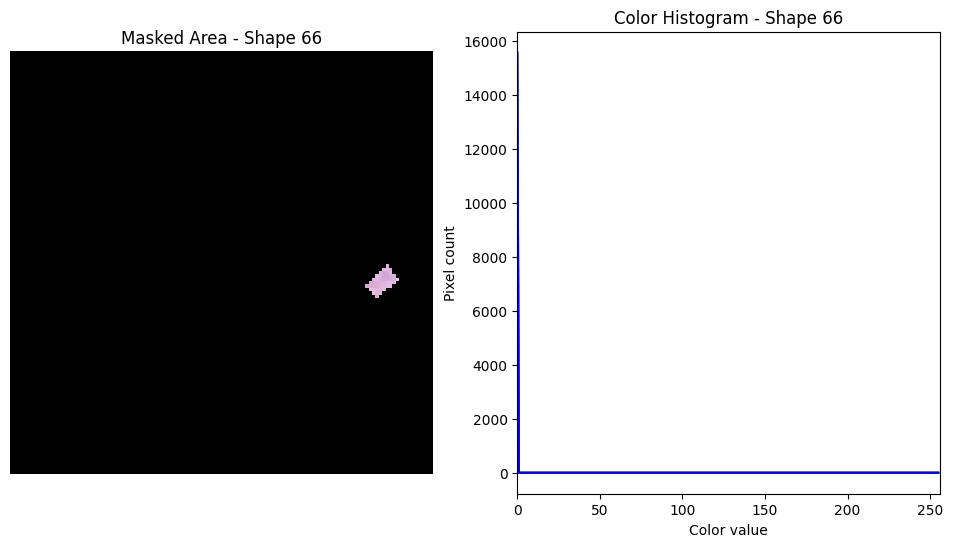

[(100.05657097843276, 69.1005377699152), (103.36399693673344, 73.24789585078992), (97.04285649834952, 77.89357499236249), (93.73309091725928, 74.74133288160391)]


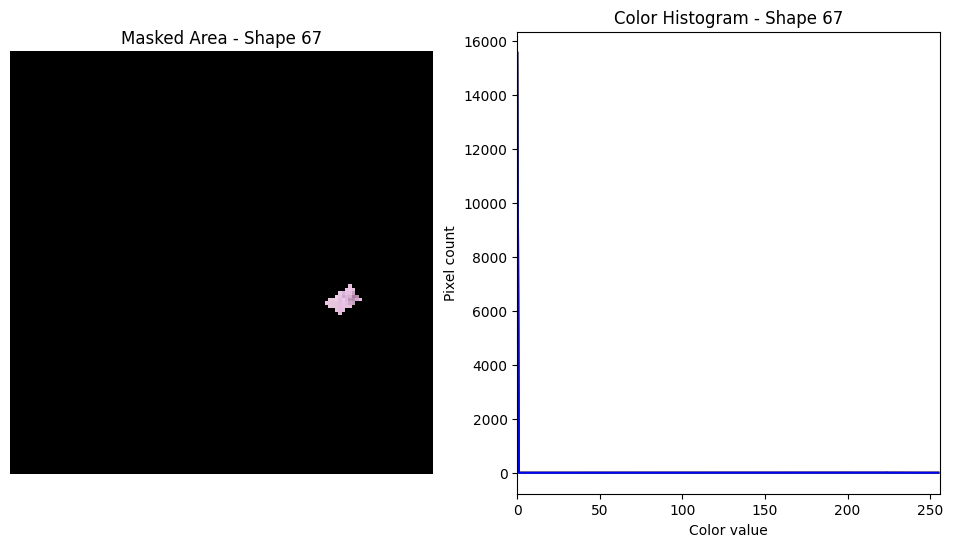

[(106.52617984781324, 70.42719390040688), (109.83451229870025, 74.5750888411502), (103.51249921141238, 79.22119014782771), (100.20189481660242, 76.06852573475777)]


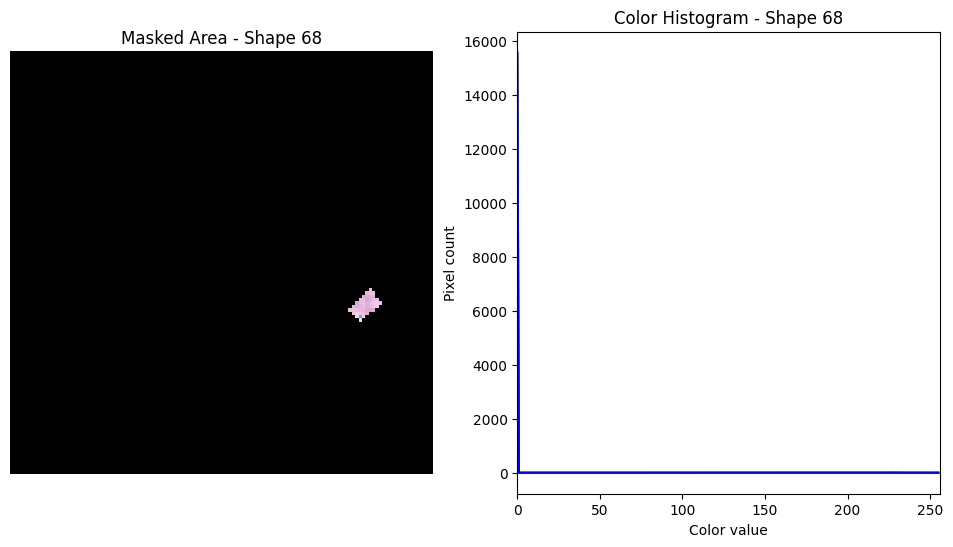

[(111.66318902782427, 73.74536978645588), (114.97232054405492, 77.89399053546228), (108.64946317811558, 82.54045663200552), (105.33811342779, 79.38720494655101)]


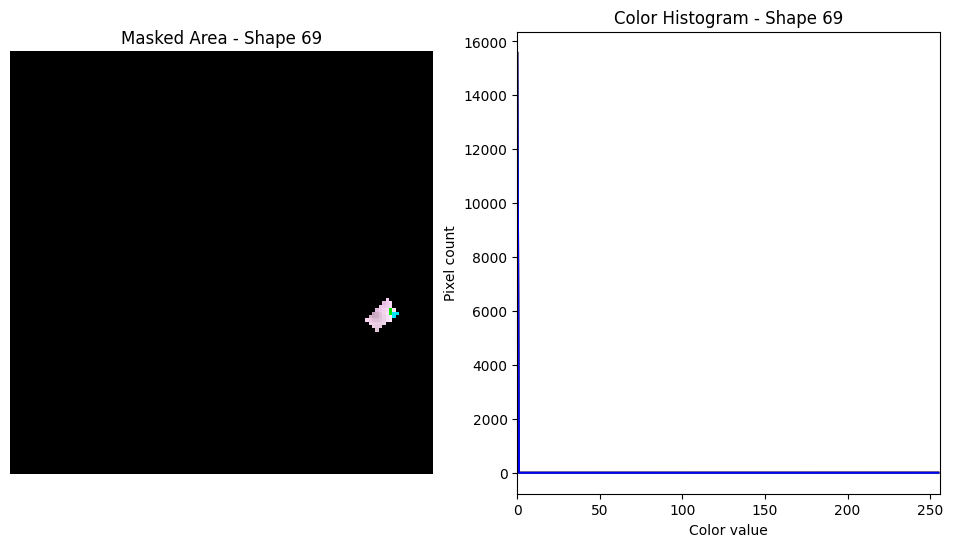

[(55.89388643260958, 32.59451955905561), (59.19416900056939, 36.7345865328991), (52.8808179077883, 41.37702372569723), (49.57773473255304, 38.230714583996274)]


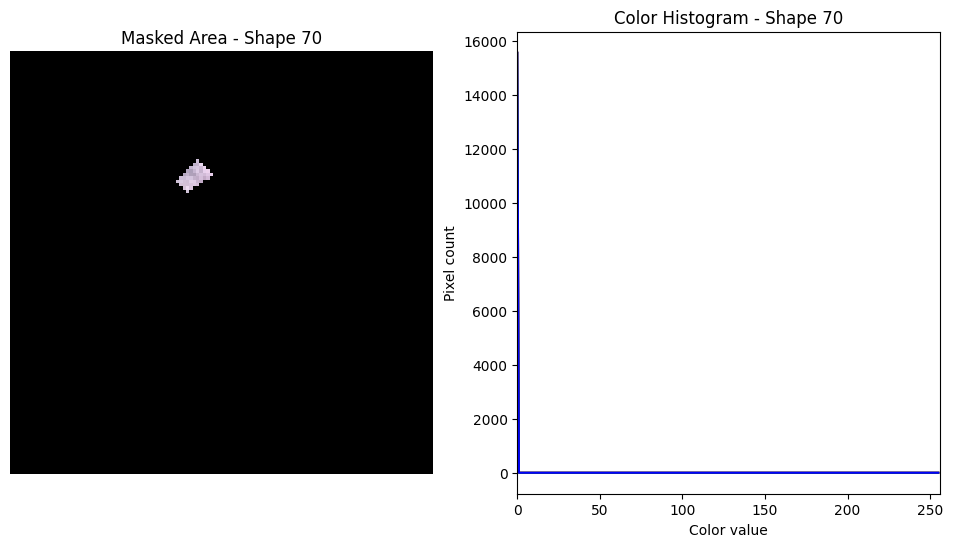

[(48.62299232203424, 64.79542219182869), (56.410474528286215, 65.62313351206183), (55.56797056264713, 69.6021564446333), (47.94666505653987, 68.60817625830285)]


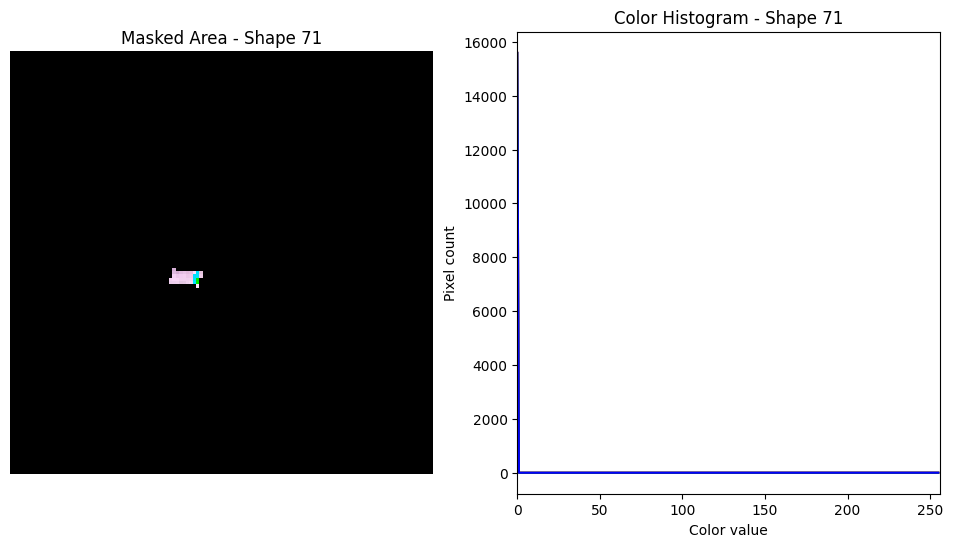

[(44.45986104219671, 70.43199623807865), (50.25781084348682, 71.26048315101465), (49.58321251526547, 74.57638512824295), (43.45637228752241, 73.00158577516169)]


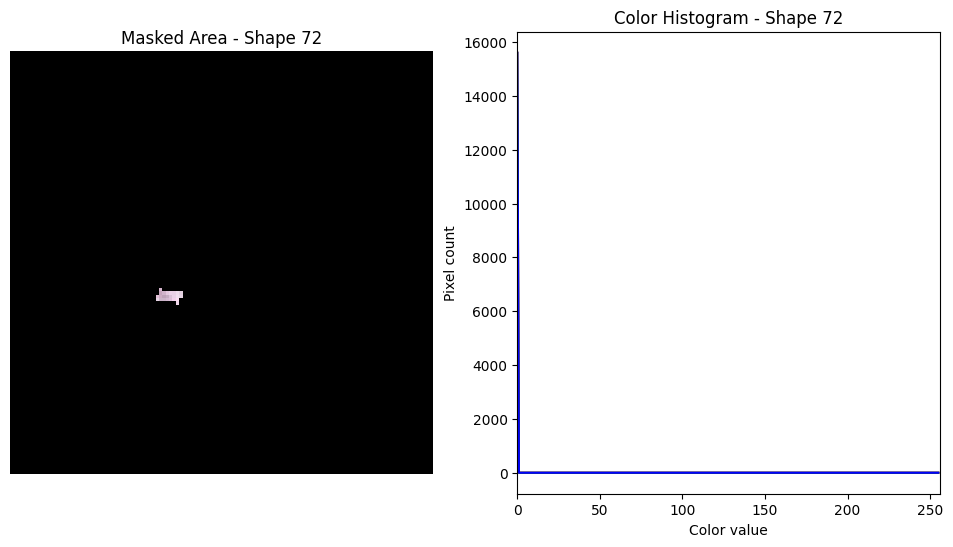

[(63.04688727544618, 64.13003732355344), (68.38009494686946, 65.90330845973068), (68.17327966749201, 68.27447673263336), (62.07690631677616, 66.61710958464809)]


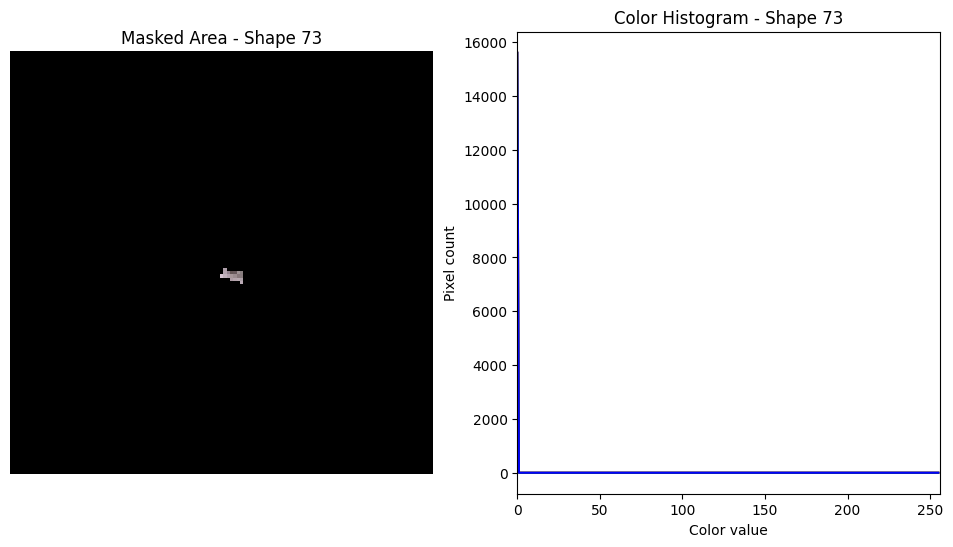

[(57.233672235350525, 67.28088931251892), (65.0232425062083, 68.10900116633977), (64.18088330129922, 72.08866701102639), (56.55751750977669, 71.09426374955319)]


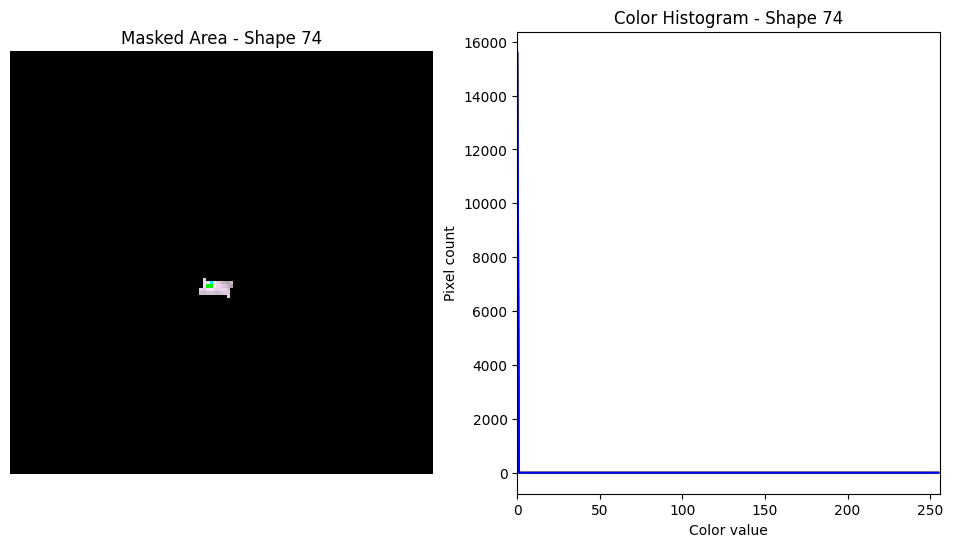

[(64.52802091415475, 67.44582204947588), (72.31920034991492, 68.2740355263972), (71.47698111674191, 72.2541046672327), (63.852026285287536, 71.25958317639407)]


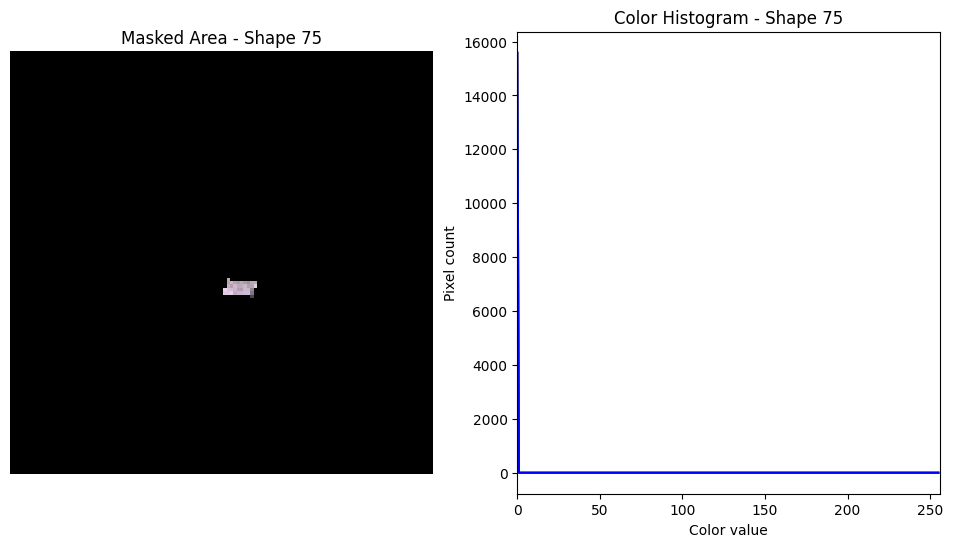

[(50.422985758047616, 71.42626143437036), (58.2114079244688, 72.25480504526183), (57.36887976141571, 76.2344074751934), (49.74665083559097, 75.23958244690803)]


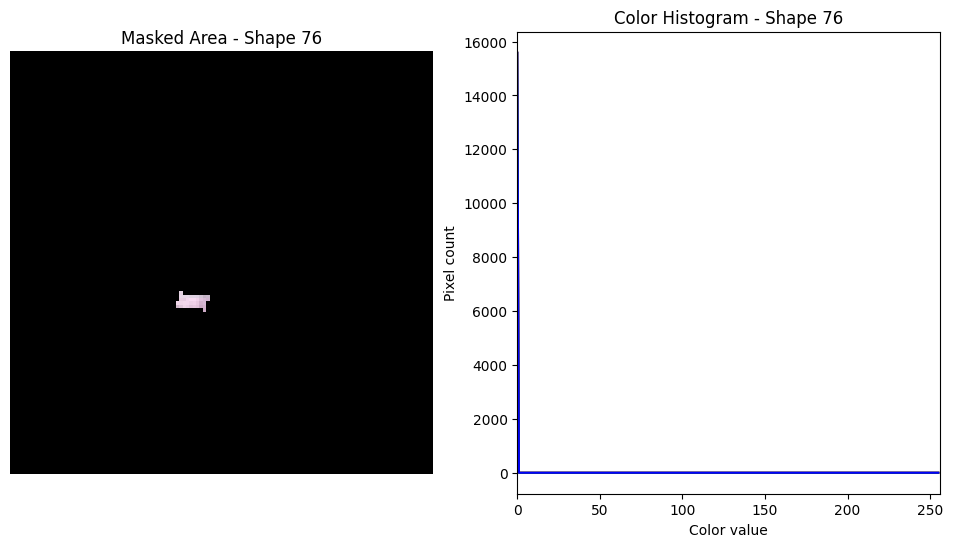

[(14.992936898578051, 65.1319542410071), (22.773093640088234, 65.95933152150272), (21.92993540830929, 69.93657501393079), (14.31586452172624, 68.94300402253475)]


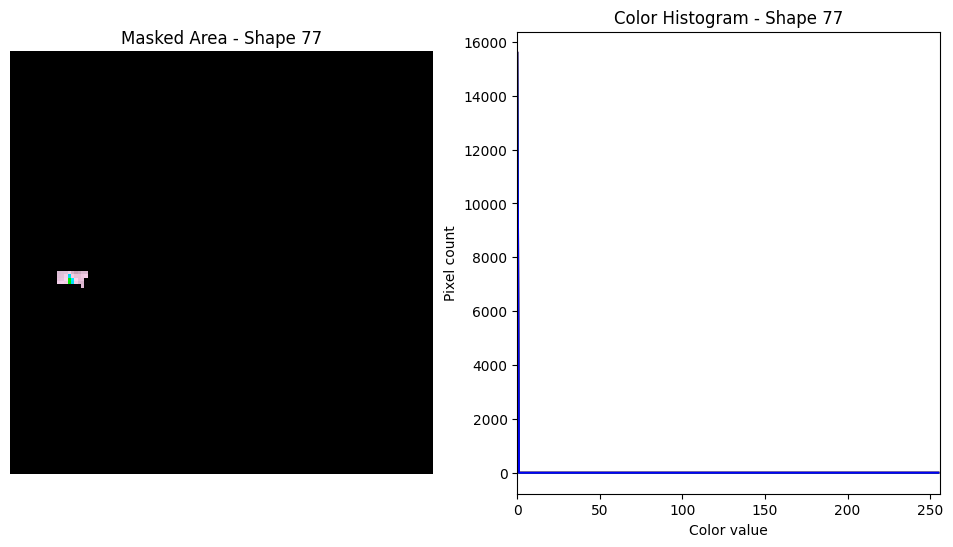

[(4.078130707869036, 82.89608587232689), (11.857364224386489, 83.72551626635979), (11.01383627340121, 87.7034678202821), (3.4006901347206053, 86.70784545660129)]


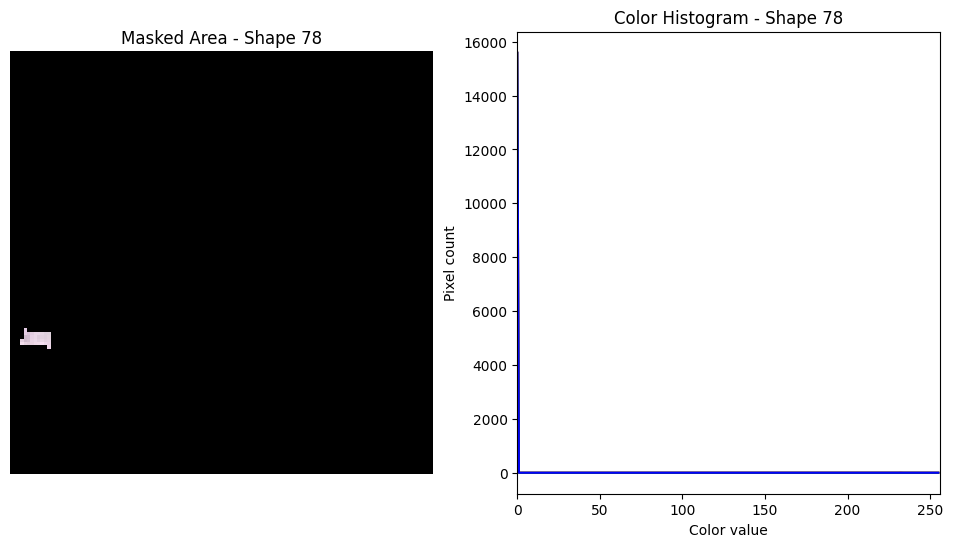

[(4.255352904625596, 79.96283264974369), (9.087818723387386, 80.5431279923246), (9.076637253058324, 83.3937537283168), (3.614546351188352, 82.89604384087767)]


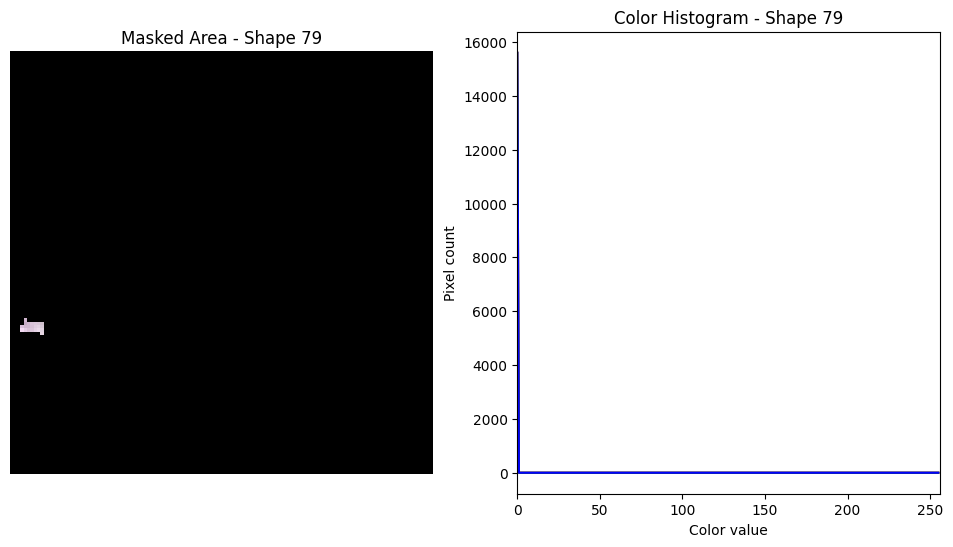

[(18.099848170497324, 75.40571140578183), (25.88153011637519, 76.23438132351956), (25.03834036406704, 80.2125396194584), (17.4227707625069, 79.21765582735111)]


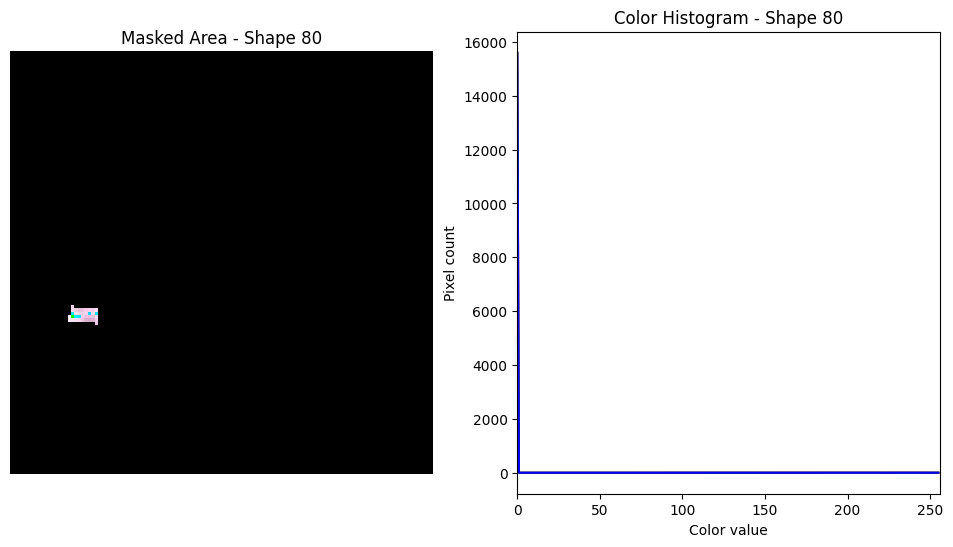

[(13.815894527114295, 69.7715550232902), (21.596176010830504, 70.59948720335728), (20.752953607158105, 74.57700540187423), (13.138762926302206, 73.58287620394279)]


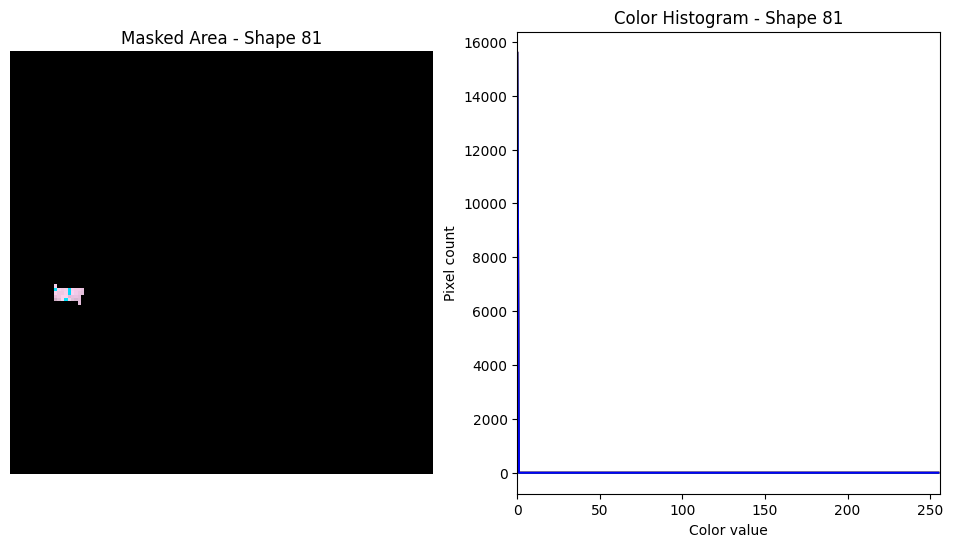

[(31.179121312493493, 77.2289764116104), (38.96381307852889, 78.05801579176509), (38.12086032370959, 82.03700851781105), (30.50231966463352, 81.04172352833632)]


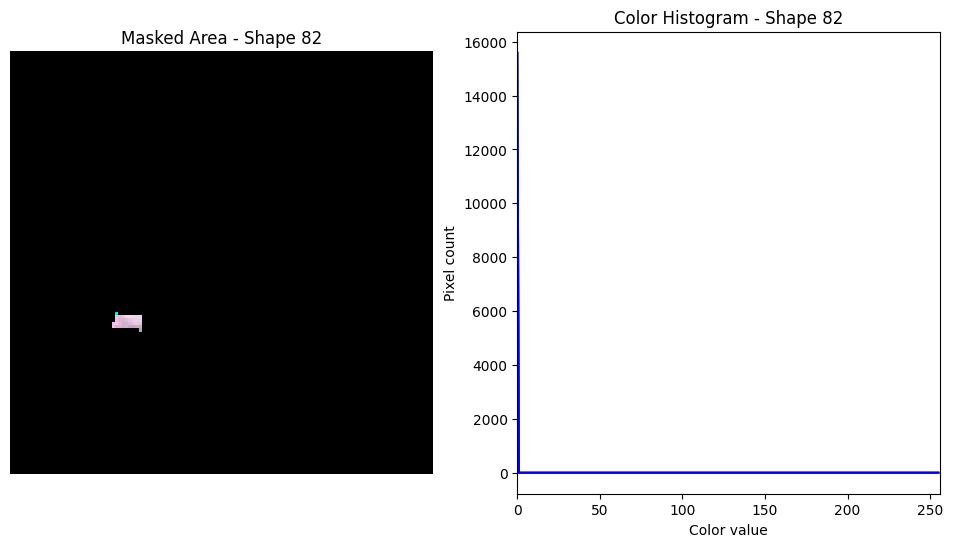

[(43.03851478425855, 73.99628529869145), (47.92412114137619, 75.02406937057663), (46.92128528717706, 77.39500287657981), (41.90347547314019, 76.26755210905705)]


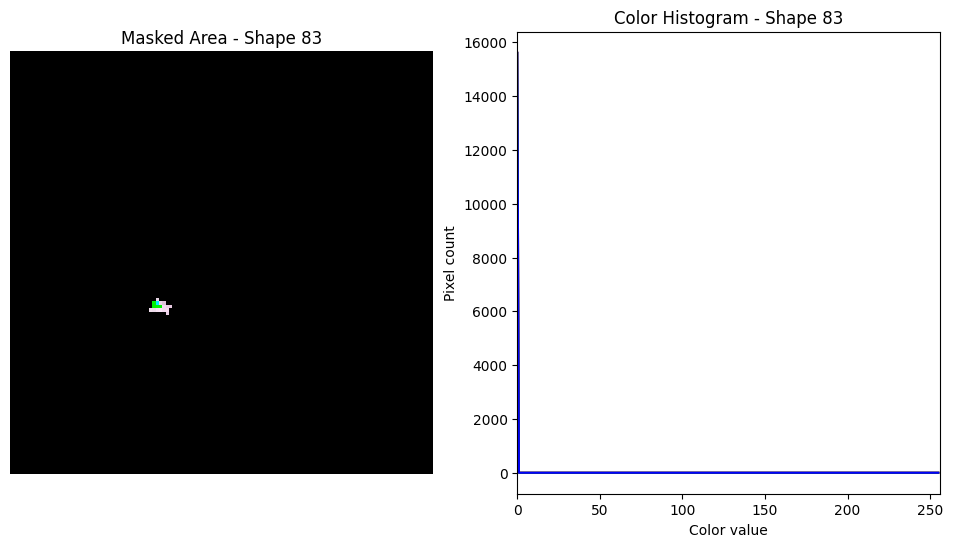

[(70.93391434617132, 70.96061271762781), (76.65343808192353, 71.75628091013564), (76.14328969694549, 75.65390317119767), (70.25858000768045, 74.6091092919392)]


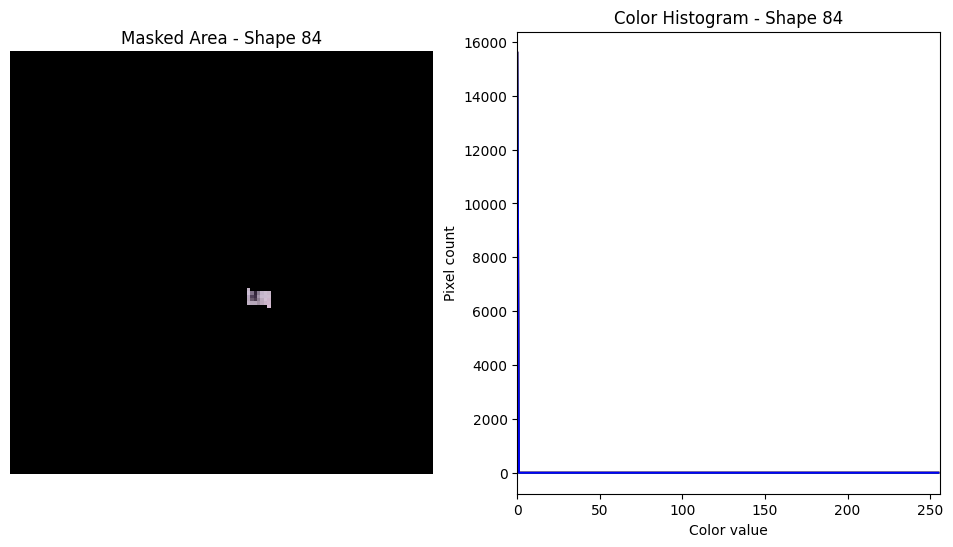

[(66.0822009569165, 73.78002623124303), (73.87424235327569, 74.60903311796892), (73.03199685575828, 78.5896470188292), (65.40619541559431, 77.5943205006844)]


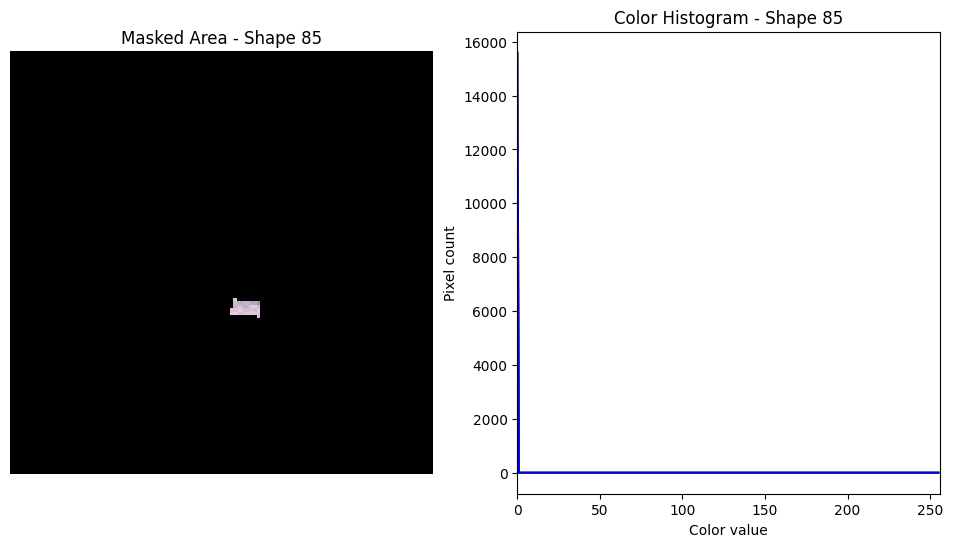

[(40.53604746315489, 78.63832666933564), (47.82417239551978, 79.88215270675727), (47.48128419924234, 83.11559169543011), (40.19178982210465, 82.20297636764607)]


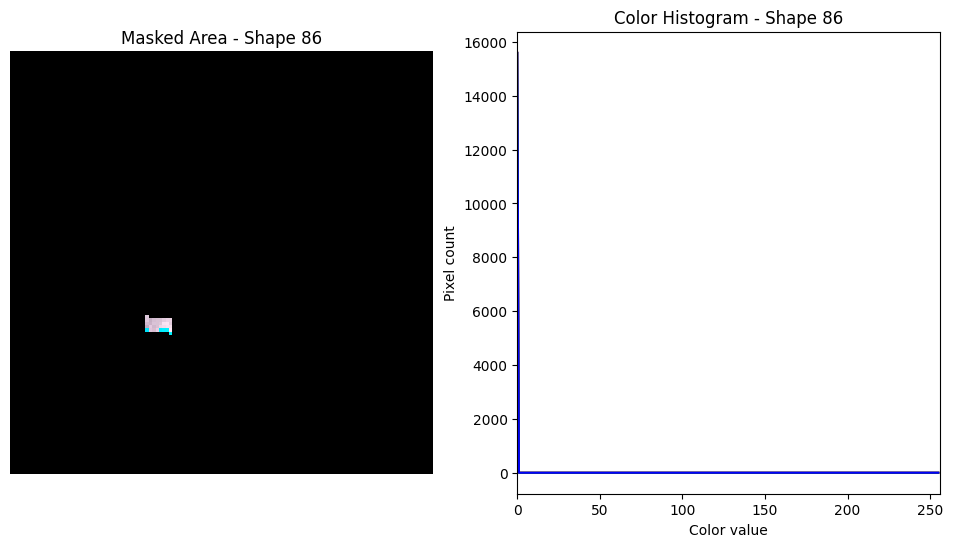

[(8.6602000240581, 105.1104015934988), (15.44990064230089, 105.52762662980804), (15.406221335061048, 108.26389806615389), (8.400361458416654, 108.012130104498)]


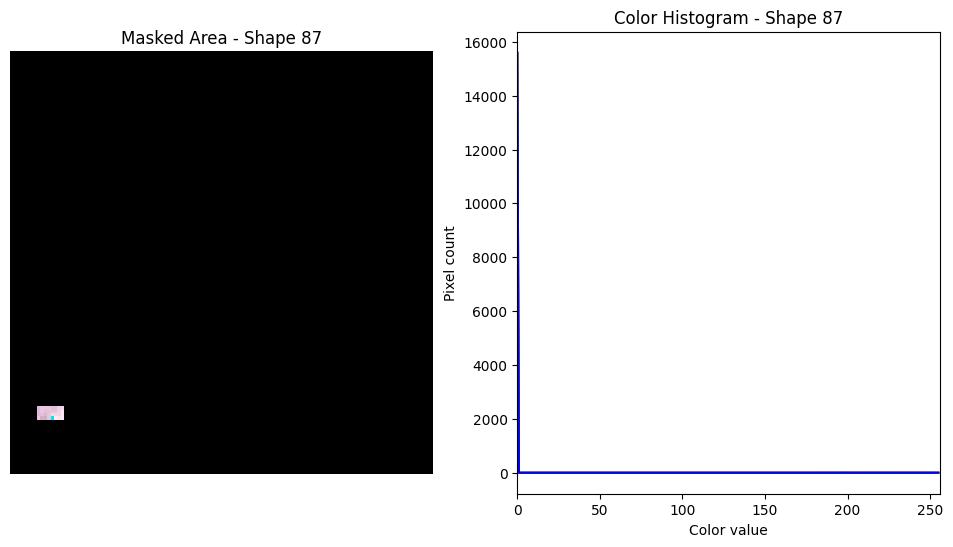

[(15.3643091902764, 97.6512866698976), (20.9103062697028, 98.56488713929176), (20.270170579071987, 101.35050697957456), (14.9719405619594, 100.60254572946744)]


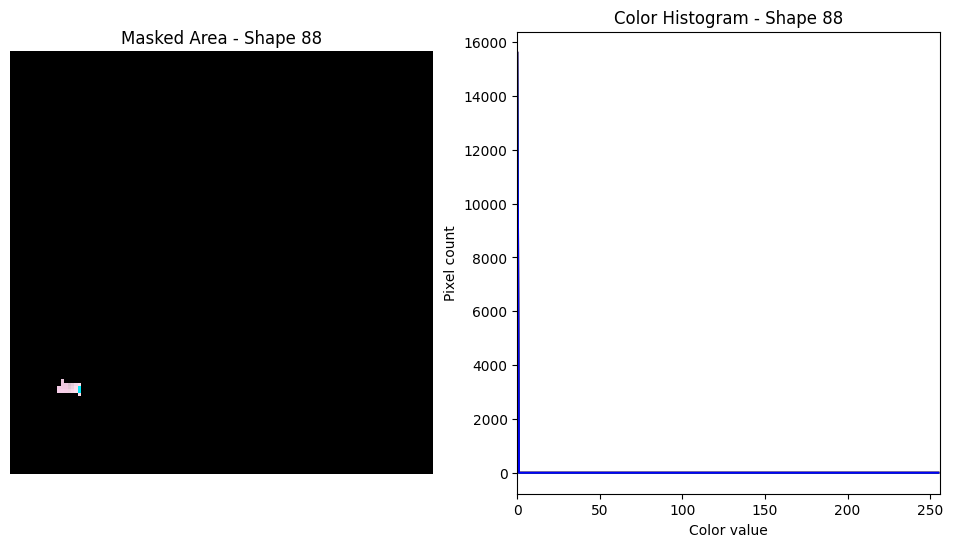

[(16.284093910631753, 95.38007623278315), (21.50128082186345, 95.6301413646049), (21.15912597212292, 98.482052675458), (15.69476661321383, 97.86692792398992)]


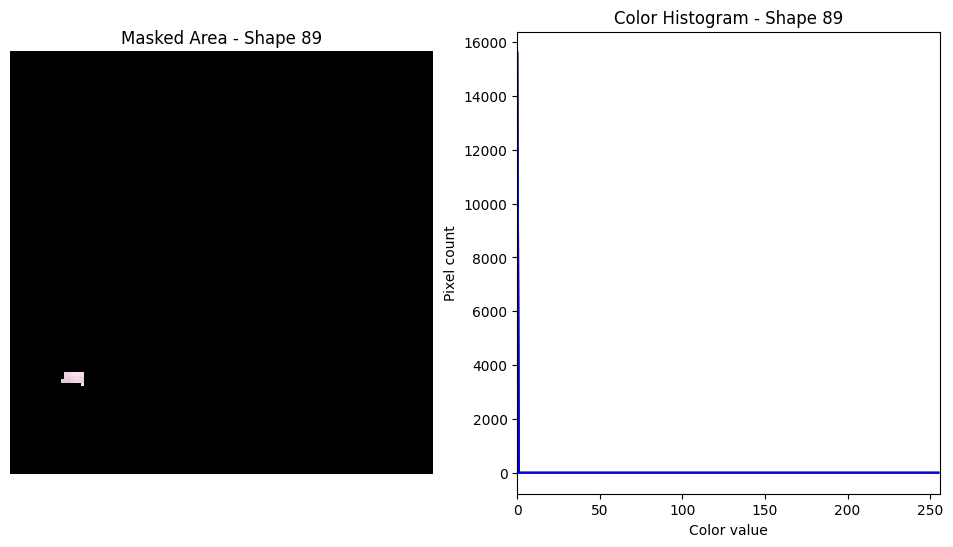

[(20.70445478622179, 87.34025950015405), (28.48768898700197, 88.1704202131302), (27.64444320272241, 92.14958741916752), (20.027349387079653, 91.1531916683484)]


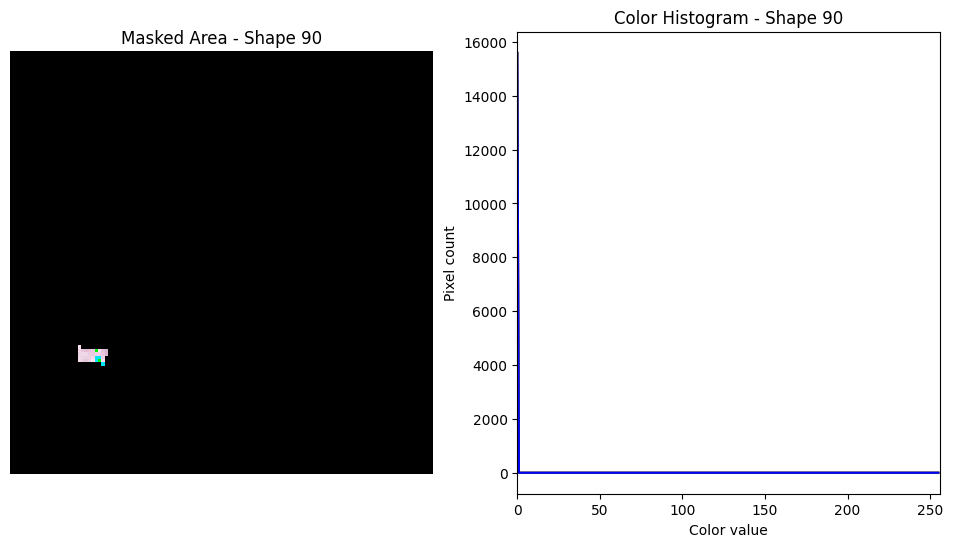

[(38.45169756370089, 82.20283493325007), (46.23838935699001, 83.03256489044591), (45.39553314986523, 87.01231003532249), (37.77502097309329, 86.01631174356257)]


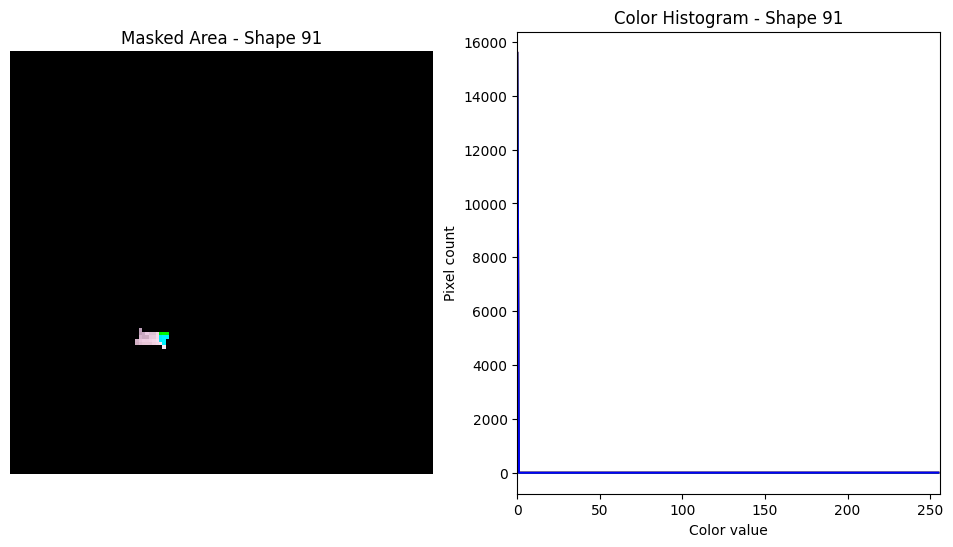

[(39.59562863777248, 86.6798239137369), (46.38892768945465, 87.3441266503468), (45.38437905400542, 90.16323881350849), (38.83936896648959, 89.58160555269404)]


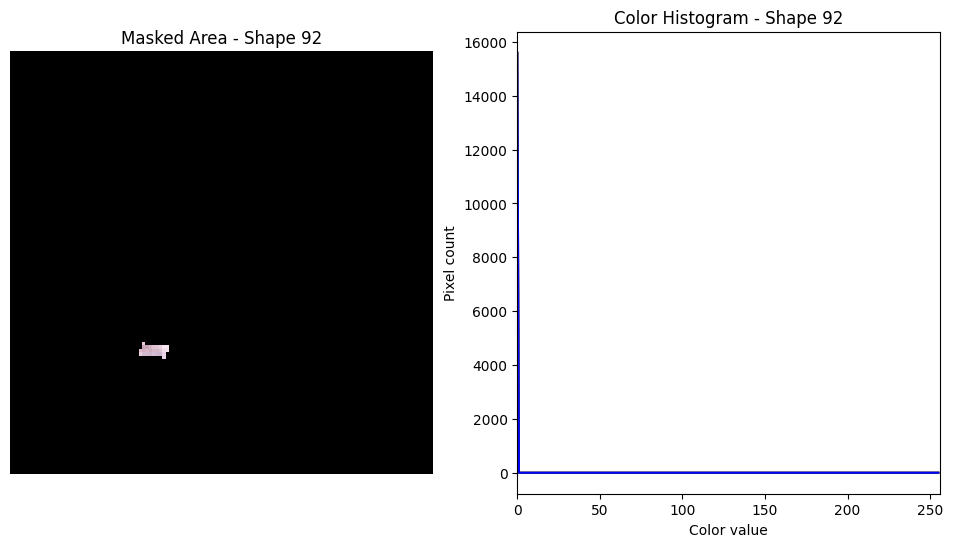

[(37.05739696433665, 101.1074092277196), (44.84534103001903, 101.9394398810108), (44.00228928232755, 105.9204872866744), (36.380554243765886, 104.92216718574008)]


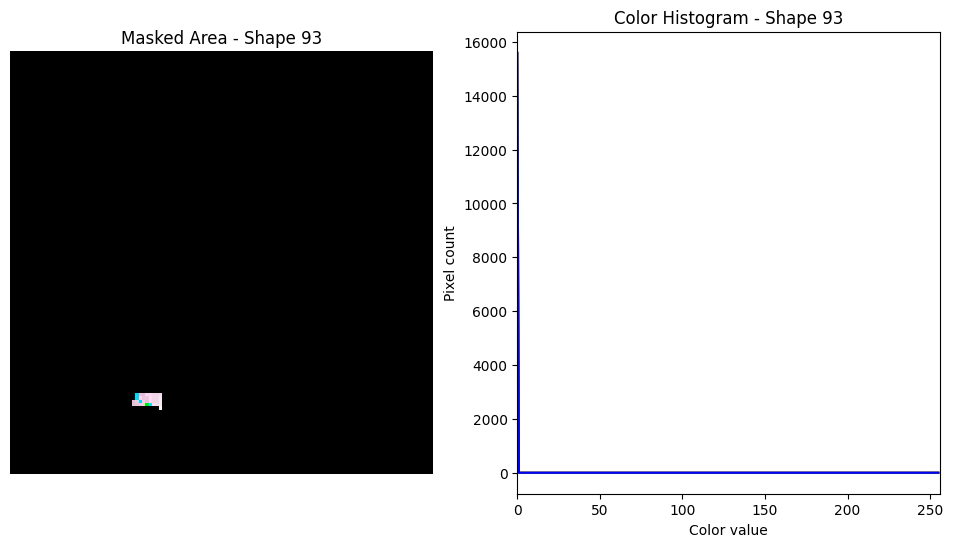

[(28.659710180282588, 95.3832812036152), (34.757009545432, 95.63361871147325), (34.58431606481449, 97.5407606650906), (28.618436051769294, 97.57220876192136)]


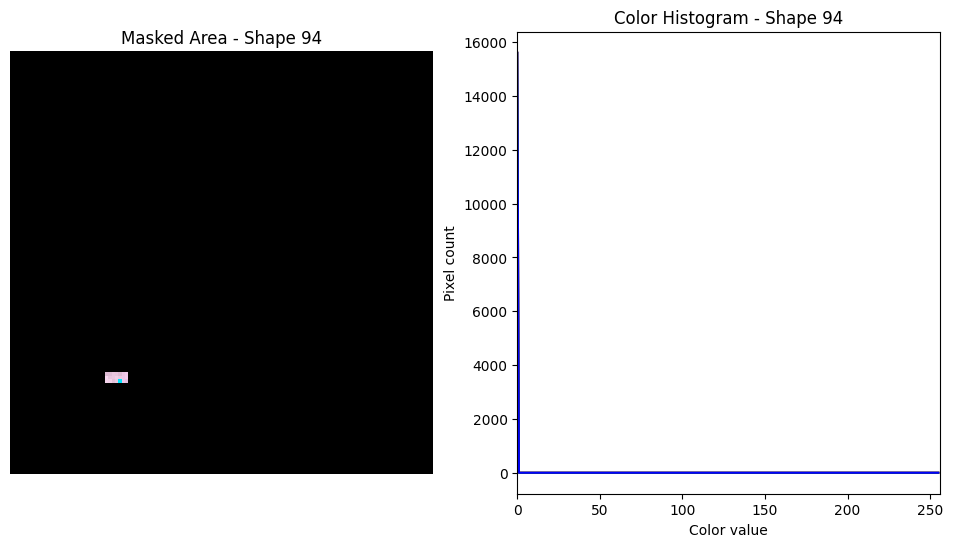

[(27.451552172444902, 99.4457869880577), (35.23725864702536, 100.277506324698), (34.39403557778985, 104.25791728003487), (26.77450909316229, 103.25993221481517)]


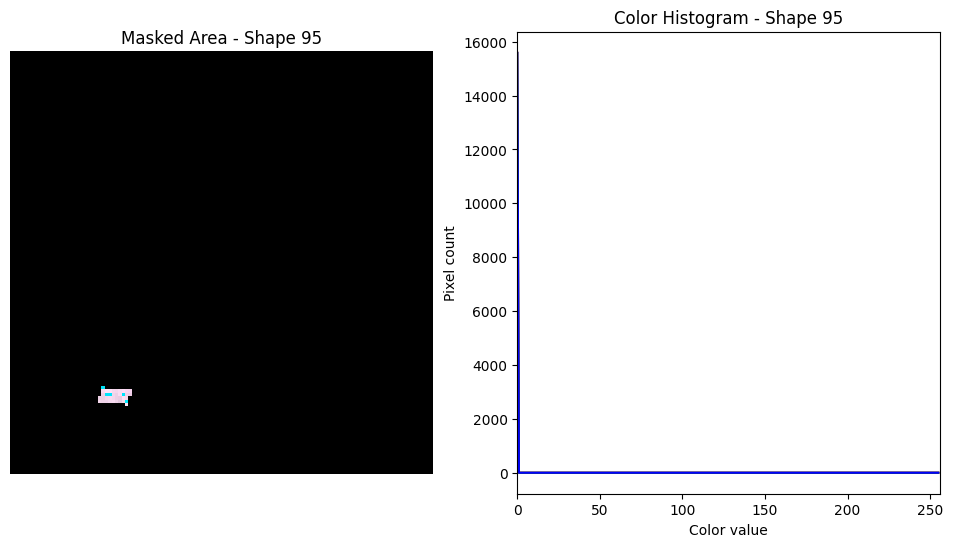

[(9.014672638886395, 111.8596977544515), (16.797370035649152, 112.6927312990036), (15.95367914943921, 116.6730572523445), (8.33713341549236, 115.67378349155987)]


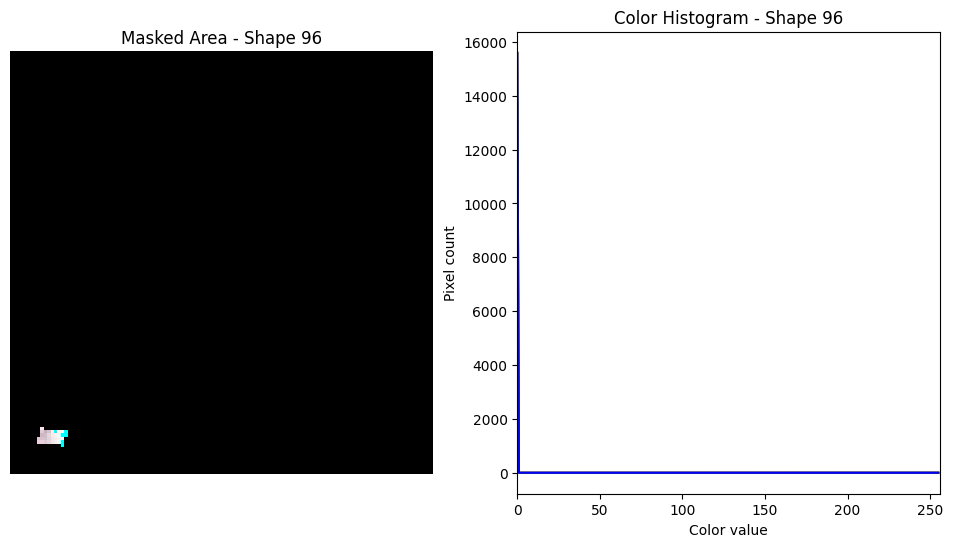

[(42.01232286660425, 106.08558142416928), (49.80176074243769, 106.91827777326604), (48.95876066994856, 110.899953712972), (41.3355540376856, 109.90095039645703)]


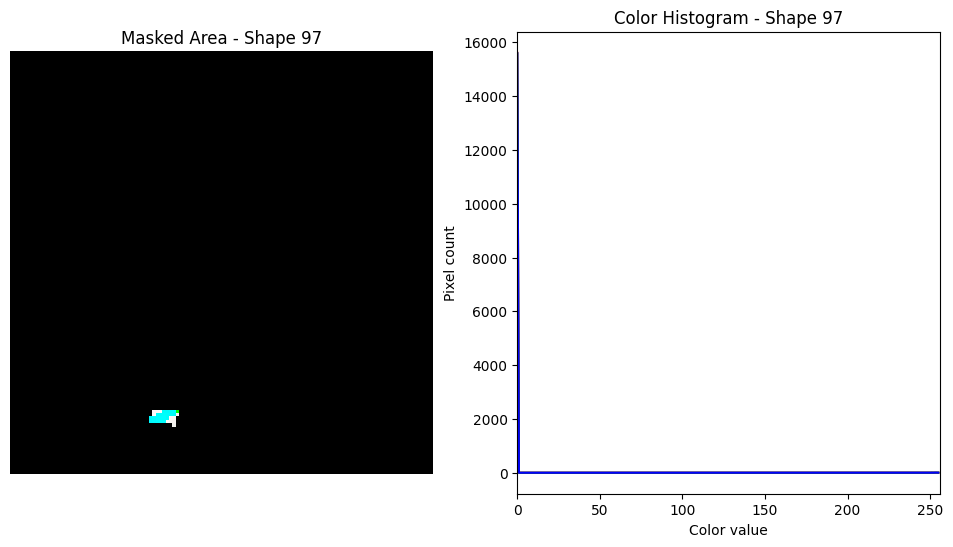

[(70.71649240299803, 86.71740904388449), (76.90251631466651, 87.1828166557778), (76.14530353700201, 90.50086575119133), (70.42320702505401, 90.1679601683776)]


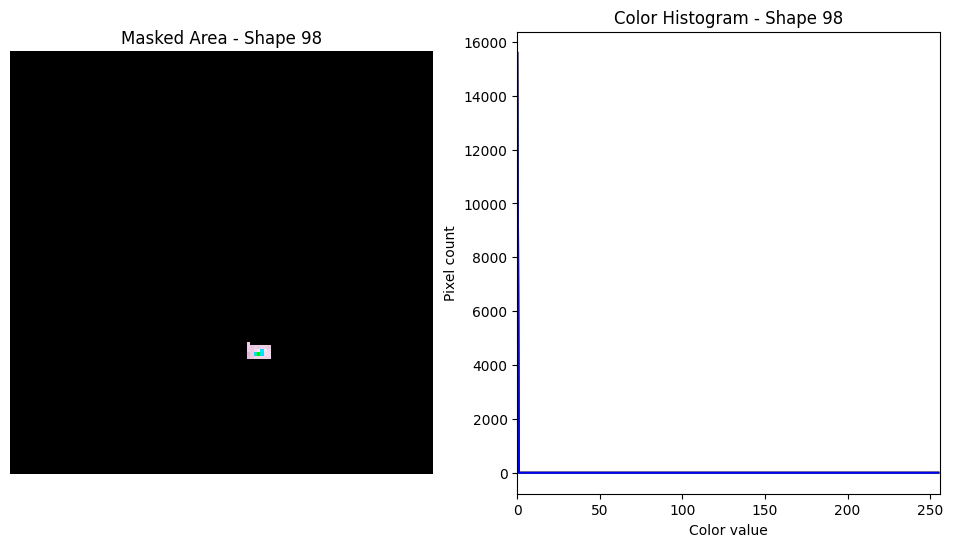

[(66.92642823005451, 104.27023350170631), (72.78252686248362, 104.30564147219532), (72.69282532614568, 106.3800855018736), (66.42233440240238, 106.211585969672)]


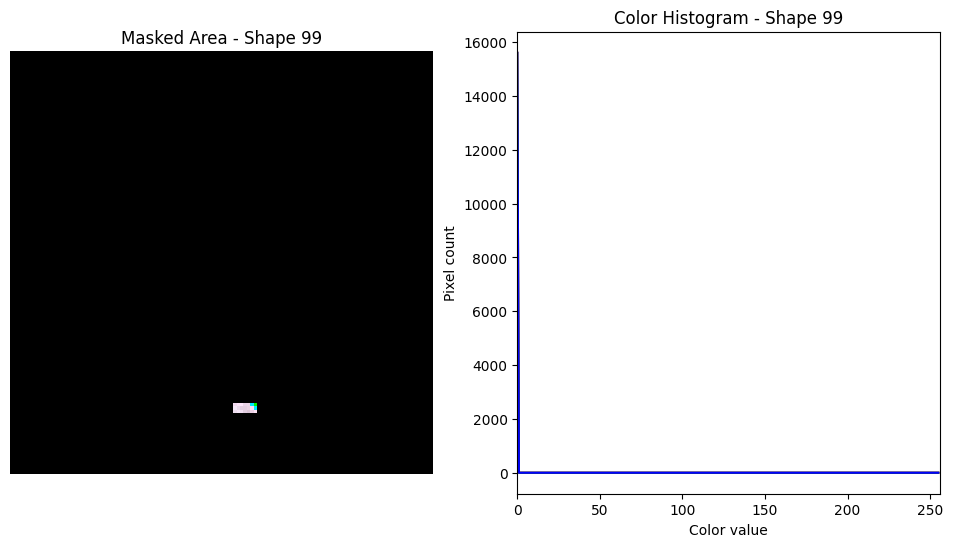

[(53.206504952302, 81.37487382277357), (60.99635559606202, 82.2046673591322), (60.15379275502528, 86.1851437598682), (52.53016039410648, 85.18904978951747)]


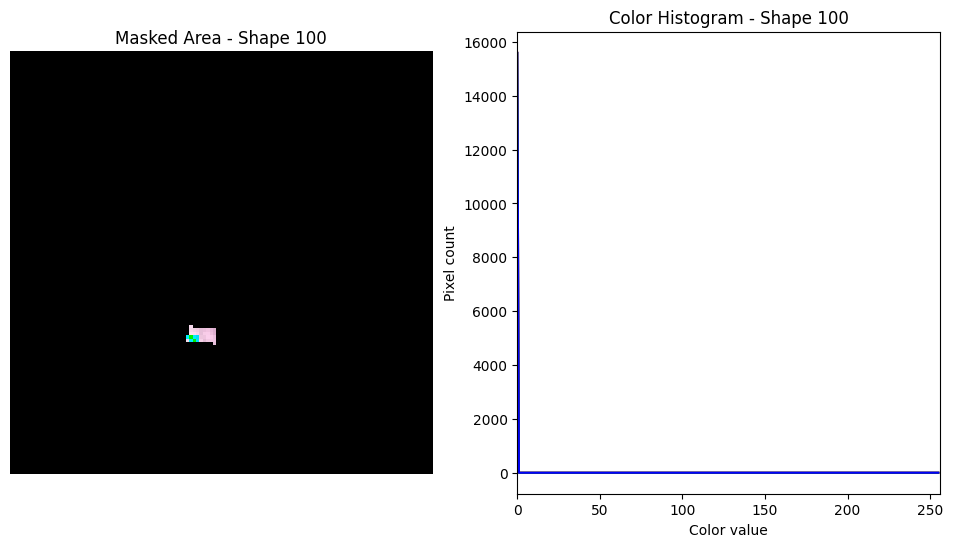

[(60.912885694627846, 82.37051161799587), (67.21347638648854, 82.70276980337192), (66.8209213731293, 86.05334112847825), (60.488244485938935, 85.35587732830211)]


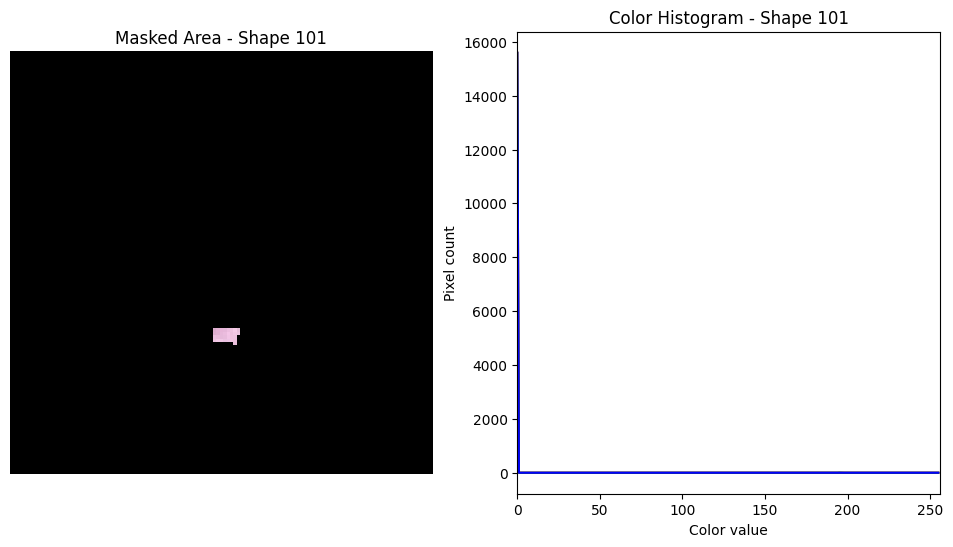

[(73.78711706088501, 75.90270511325943), (81.58101905421529, 76.73205819248236), (80.73890413520621, 80.71324005144467), (73.11126677934288, 79.71754730121631)]


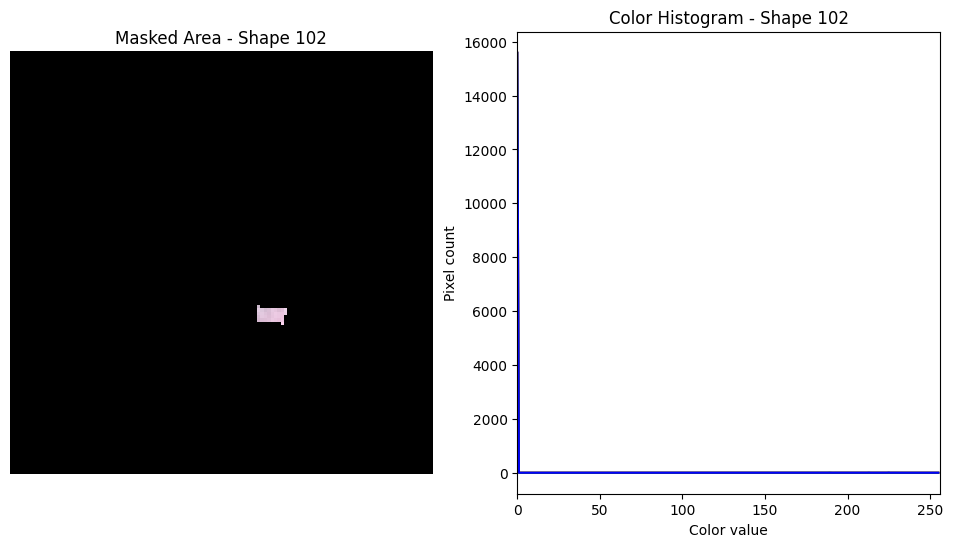

[(75.61937103446621, 83.8149543936076), (82.22152007201925, 84.06449082098507), (82.04696811996001, 86.80197574868811), (75.61039168820406, 86.60197486672075)]


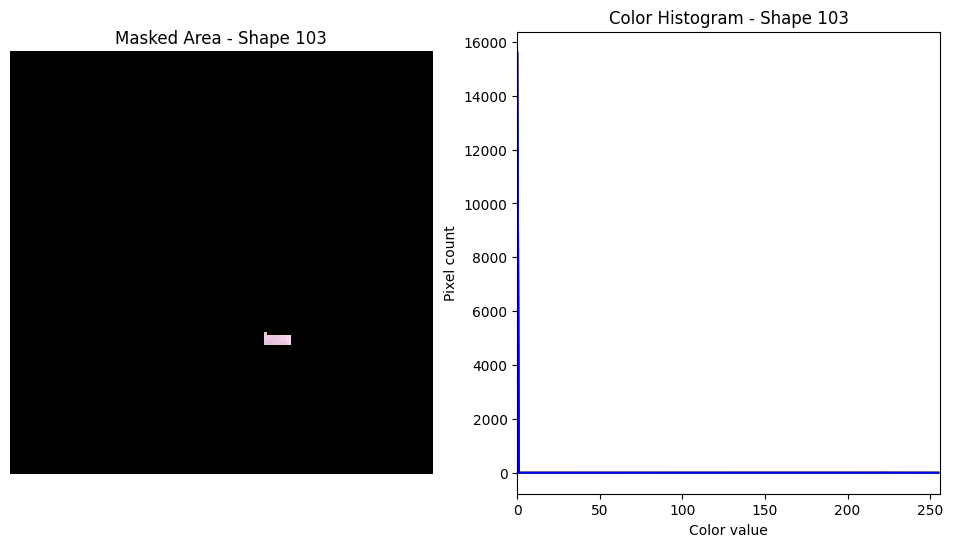

[(74.51830622184394, 106.26465240404436), (82.314870507362, 107.09773546627284), (81.47249948546482, 111.08116866002172), (73.84225515568141, 110.08170534851344)]


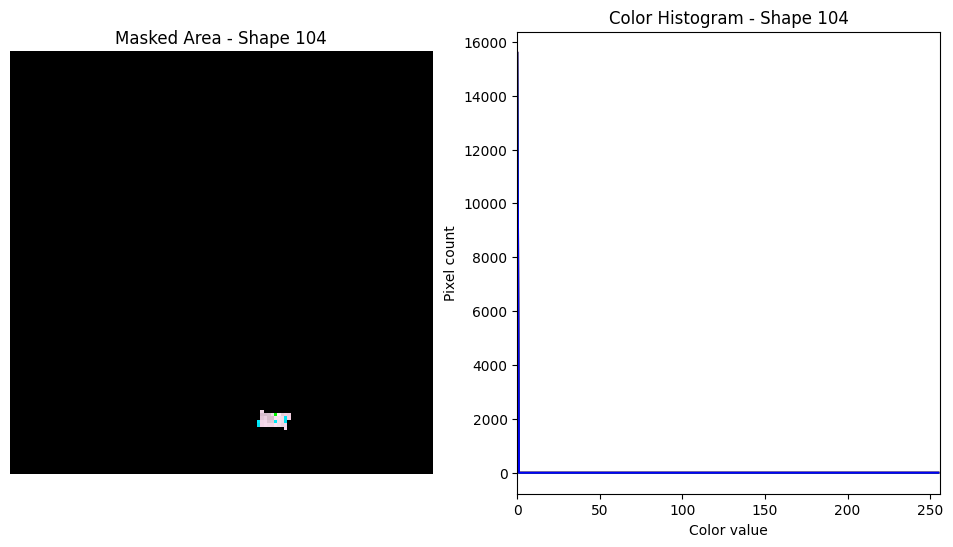

[(94.82788521226196, 113.395292698294), (101.75058598496923, 113.813893777074), (101.2106289666695, 116.71961378937864), (94.68643978331392, 116.25112097073064)]


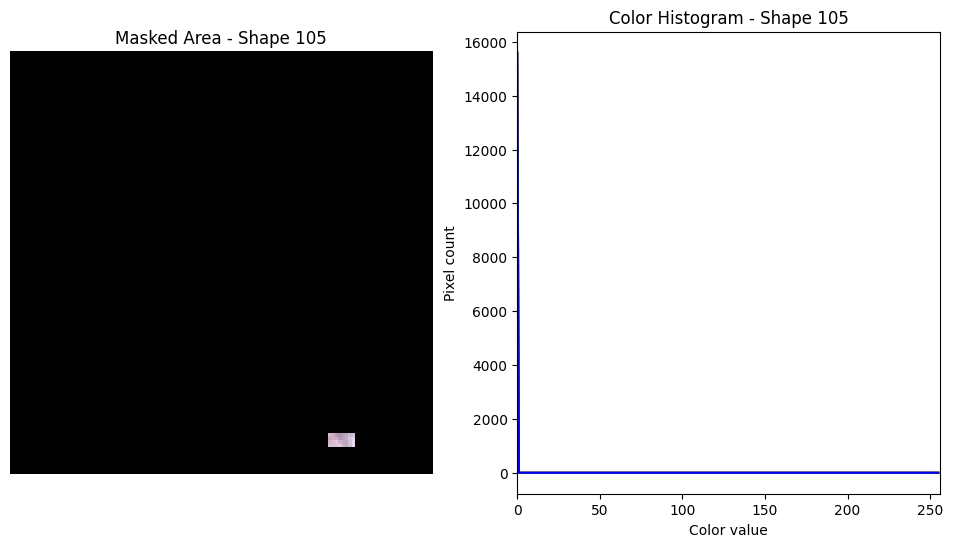

[(81.41945880237984, 112.110341736854), (88.72191235648256, 112.32970069716704), (88.9637484970329, 114.65414316629408), (81.21242950352774, 114.60032238141407)]


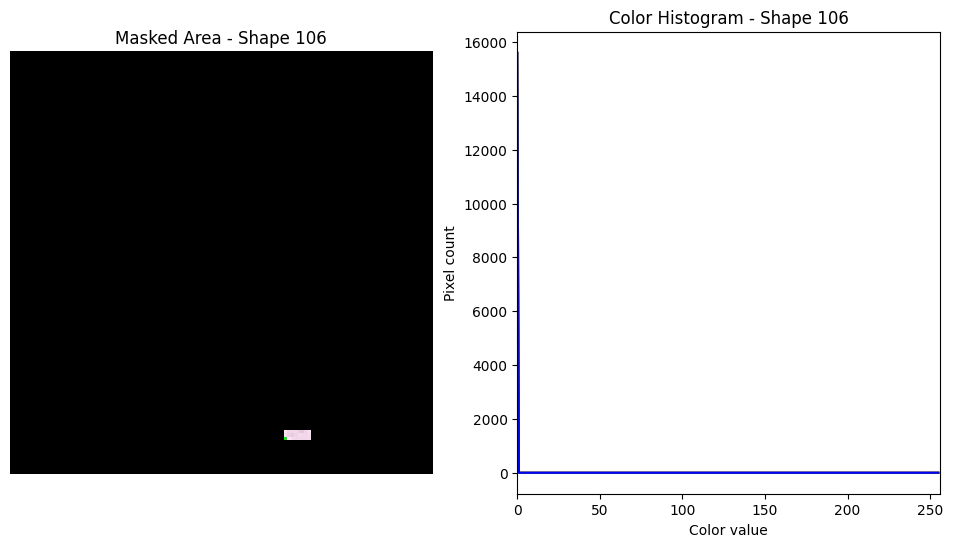

[(97.00528530539084, 107.05404981450464), (103.22963265416404, 107.77058376608332), (102.55908405499564, 109.92878310300668), (96.94886150642184, 109.26212321341644)]


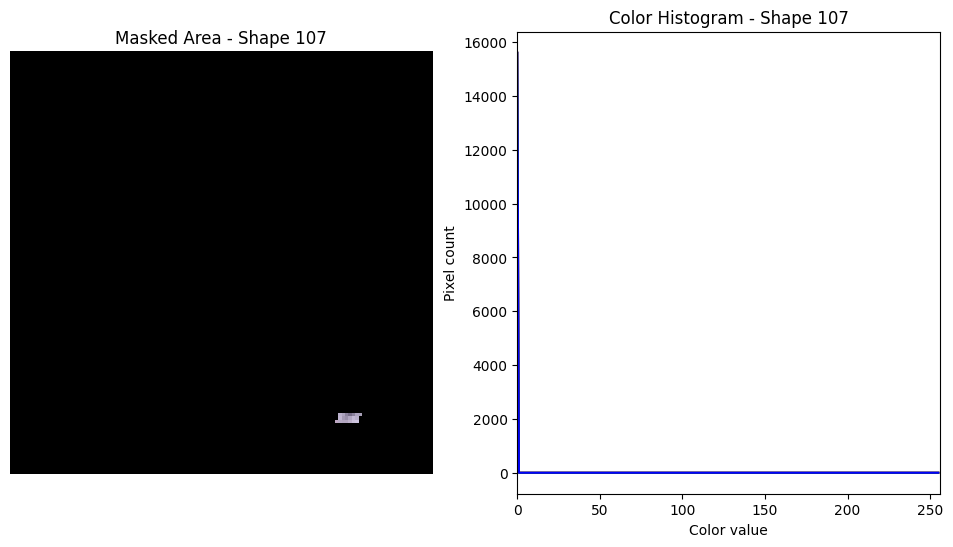

[(77.85813351854904, 99.62755129066304), (85.65488164418679, 100.45985802163553), (84.81263454591789, 104.44298679793744), (77.18220380122546, 103.4443008221468)]


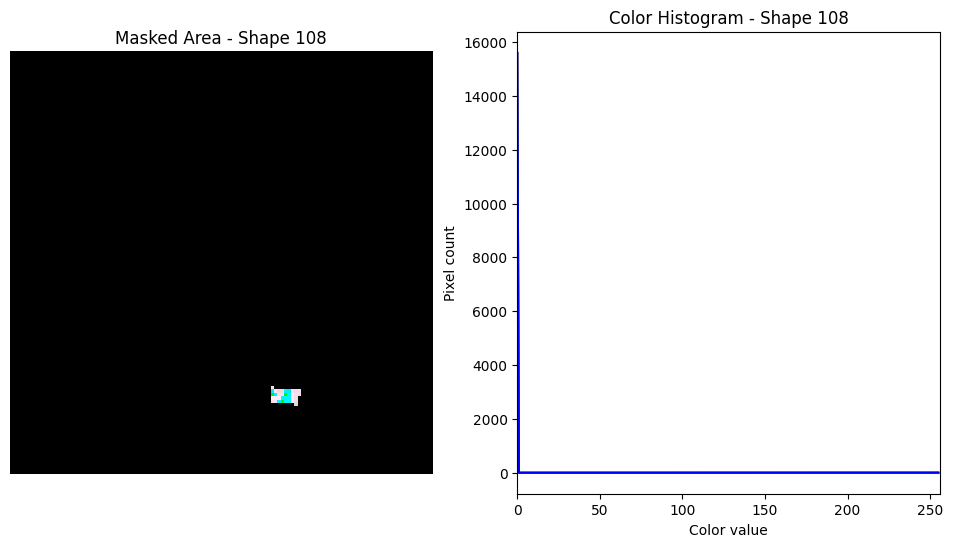

[(84.02129449813776, 92.16173012116536), (91.8187759899385, 92.99319058263188), (90.97671500517772, 96.97610604792084), (83.34555454233242, 95.97826206365384)]


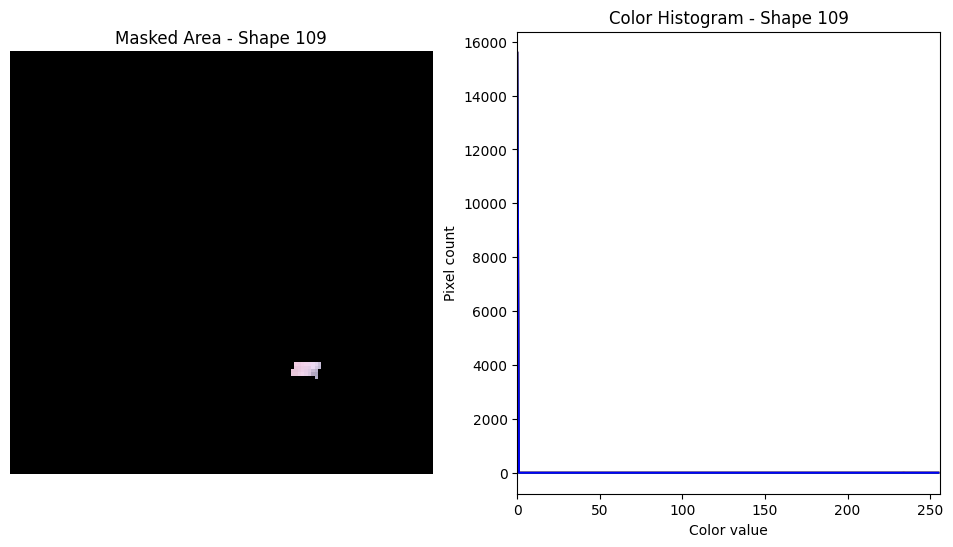

[(77.28322388832726, 71.92209441602381), (85.07756273754342, 72.75099876245835), (84.23555109480873, 76.73207819242796), (76.607479398833, 75.73683142252801)]


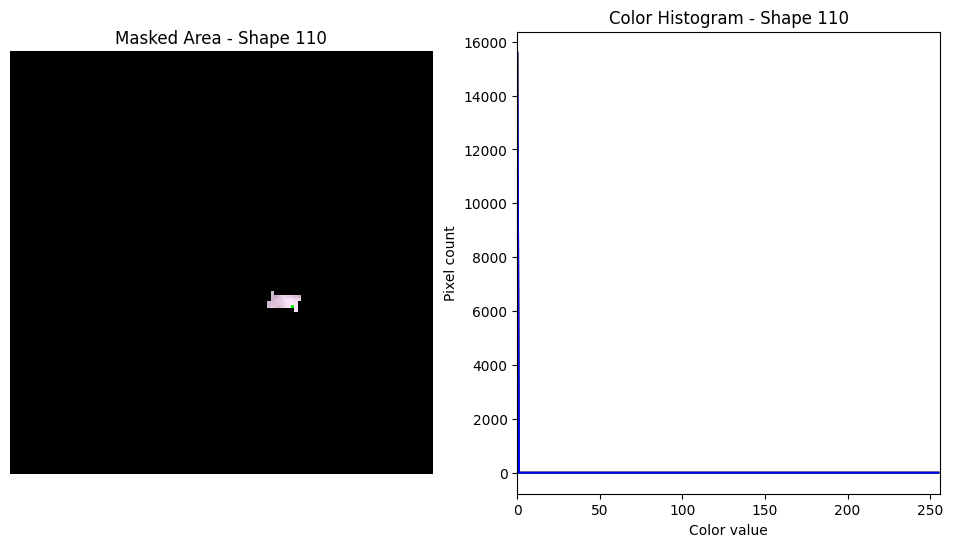

[(105.73064561329602, 104.28492413169435), (113.53387834708212, 105.11811460182), (112.69213130206708, 109.10307830644216), (105.05529993872732, 108.10343997996652)]


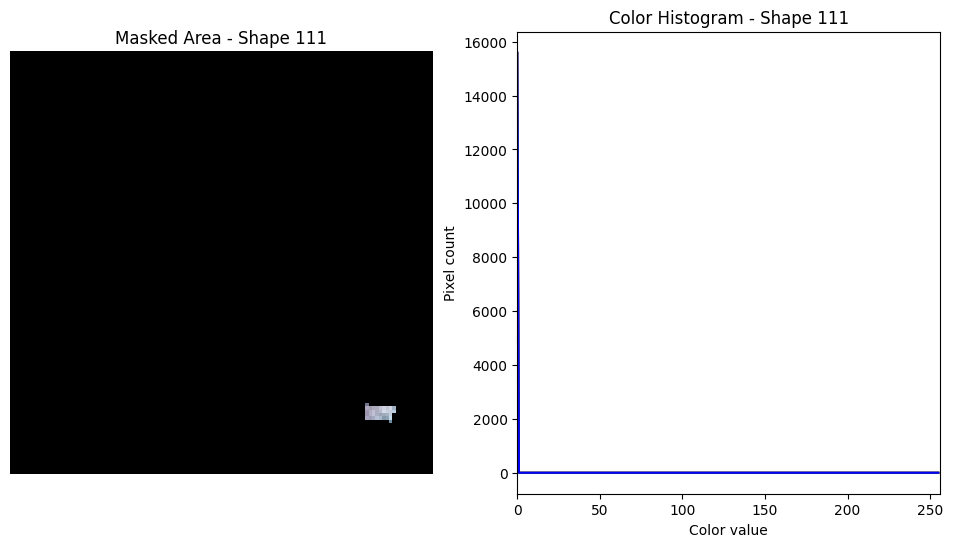

[(113.7051249453238, 103.2916765076543), (121.5100216682352, 104.1248345951526), (120.6684385000579, 108.11015379804948), (113.02996309395344, 107.1105312059407)]


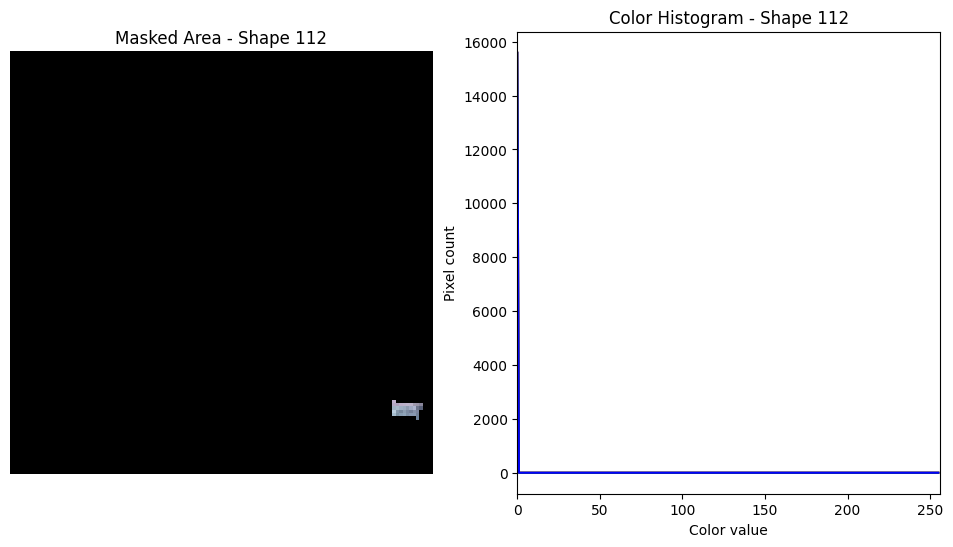

[(3.0405602360734463, 114.7588574453876), (7.182550378544903, 114.42932411201156), (7.505007688686305, 116.6684436591232), (3.198582589992867, 116.66609203570688)]


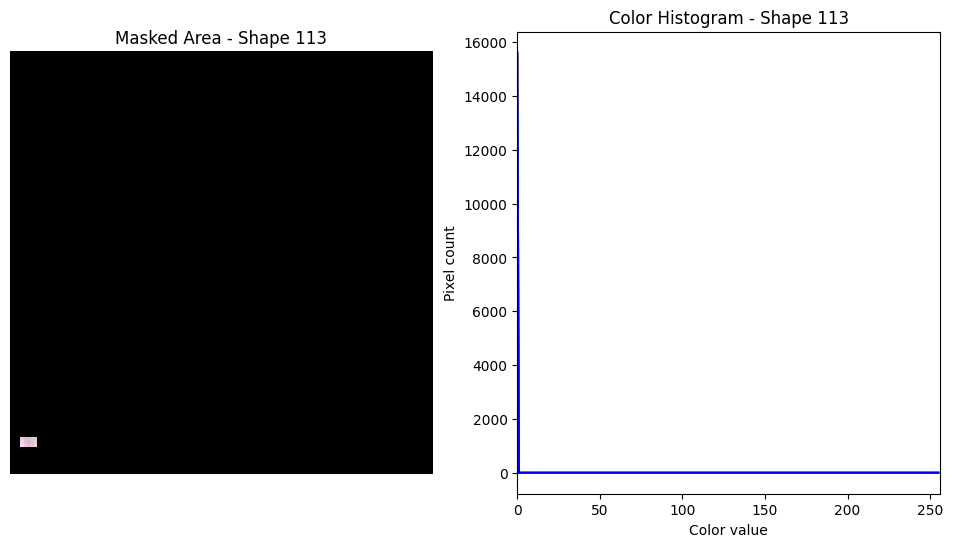

[(79.80126287705298, 62.53538159084036), (78.13094569346691, 66.18387458595376), (81.94088120707585, 67.84180647342967), (84.76834857933363, 65.51959457639603)]


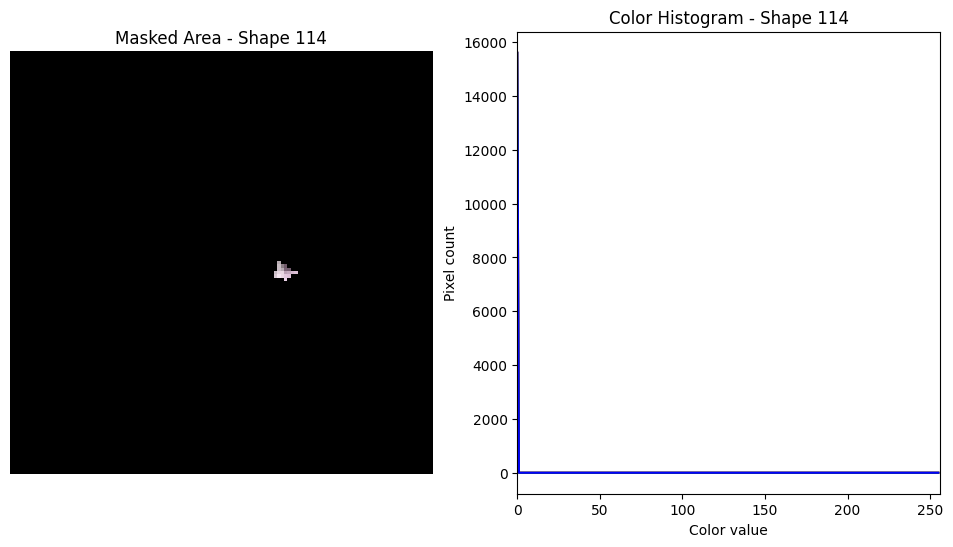

[(84.26339056851634, 67.84154582234481), (87.7458872553533, 68.33873861417663), (86.7365034549261, 72.81727246240604), (82.7567610541912, 72.15399043993497)]


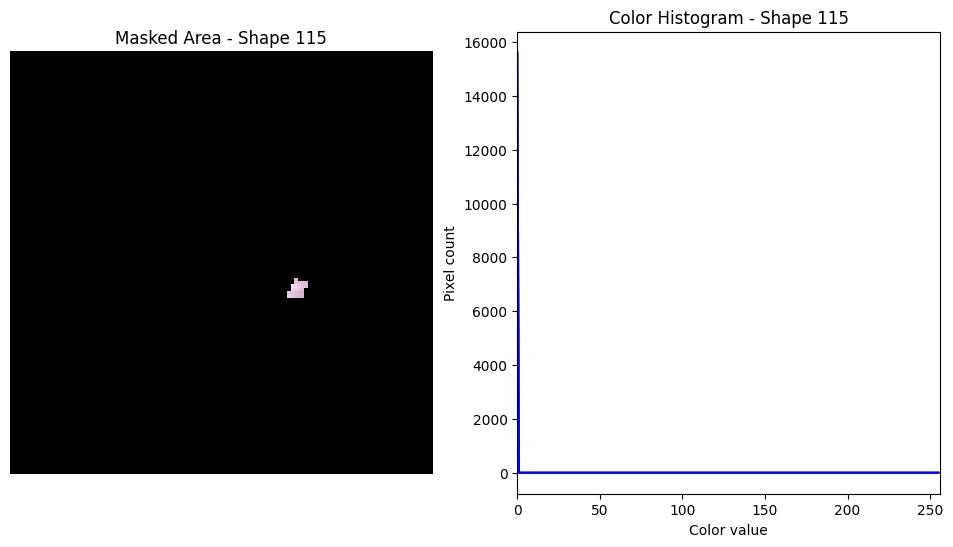

[(33.39779158577841, 59.5610351819285), (33.719392478684966, 62.21240673006065), (39.35295977040761, 62.04561440968408), (39.36251760950896, 59.39397663203039)]


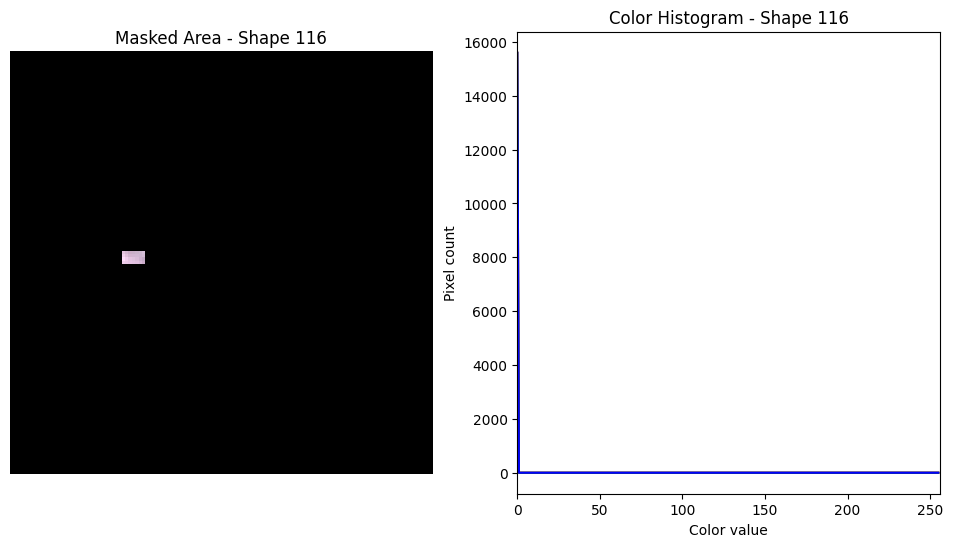

[(2.9545382705659904, 53.273881200990274), (2.6076528268570485, 57.24901175425447), (9.22626036638573, 57.90991825895131), (9.905311388030157, 53.60300654640184)]


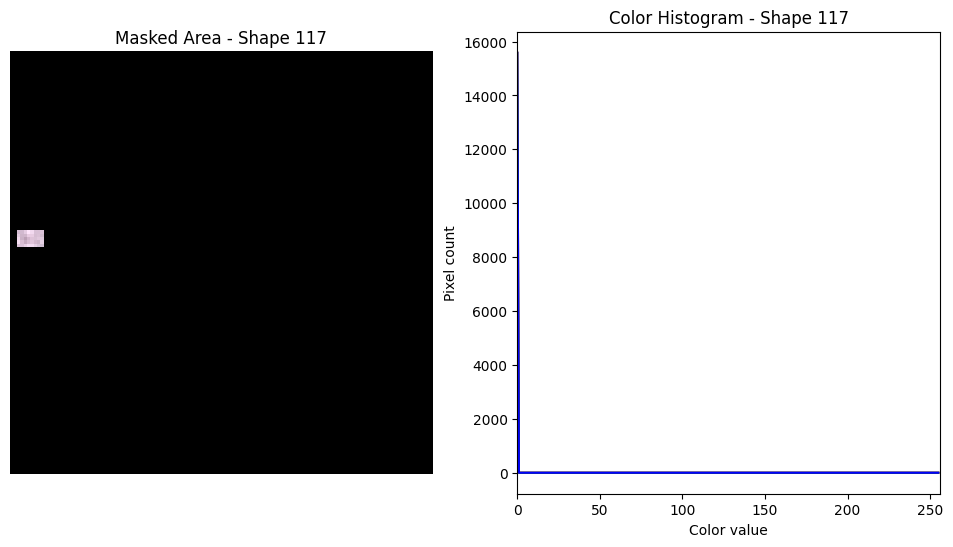

[(23.708495205613588, 81.43911177018063), (23.69412692760409, 85.251857235546), (30.81751887369319, 85.41852363949045), (30.50023586408972, 81.60537438211529)]


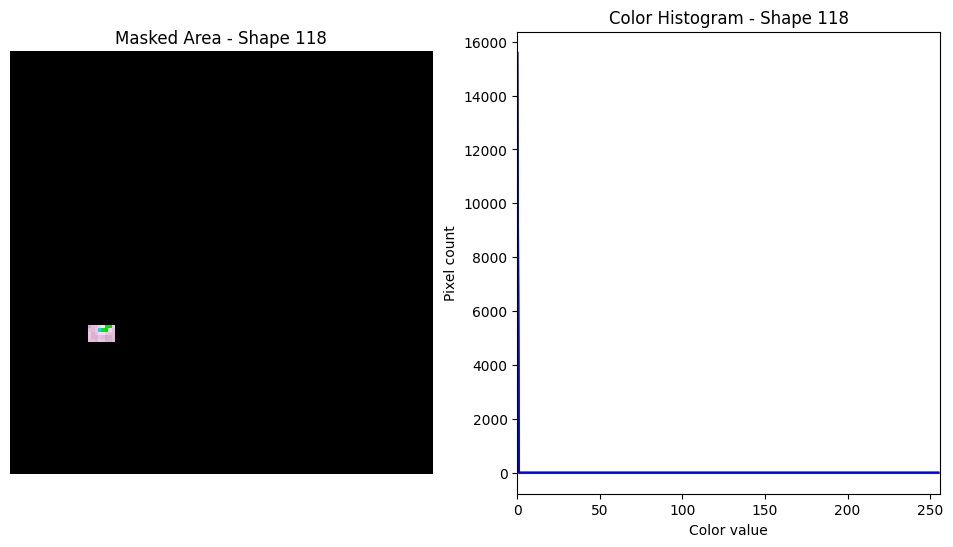

[(39.90776542858751, 92.05272562897756), (39.23105051359545, 95.86698212478088), (47.01903831042682, 96.69839496336104), (47.531558280256206, 92.3860694159811)]


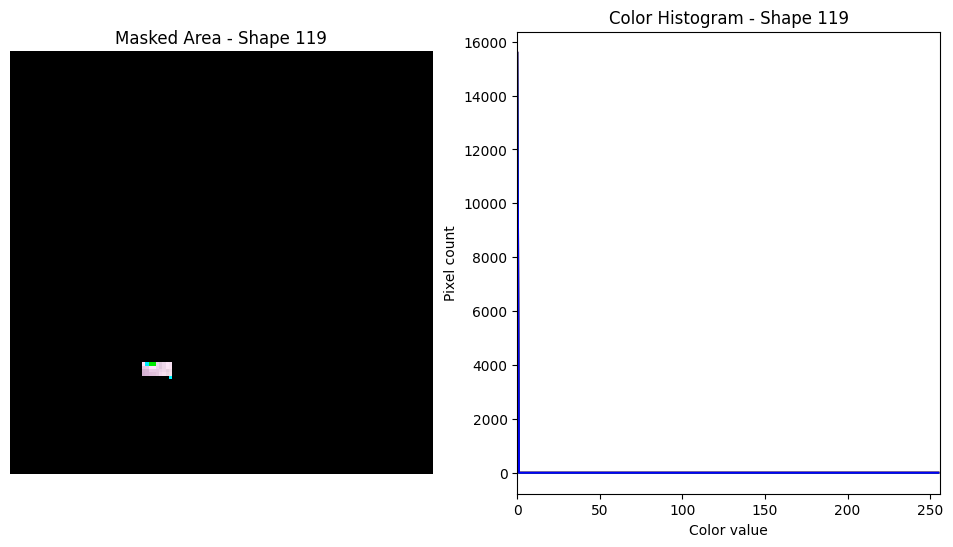

[(67.37268478878951, 84.70981630746081), (74.6208921947997, 84.79359520549988), (74.28252033963764, 86.8340433344672), (66.8663345438556, 87.36379801750203)]


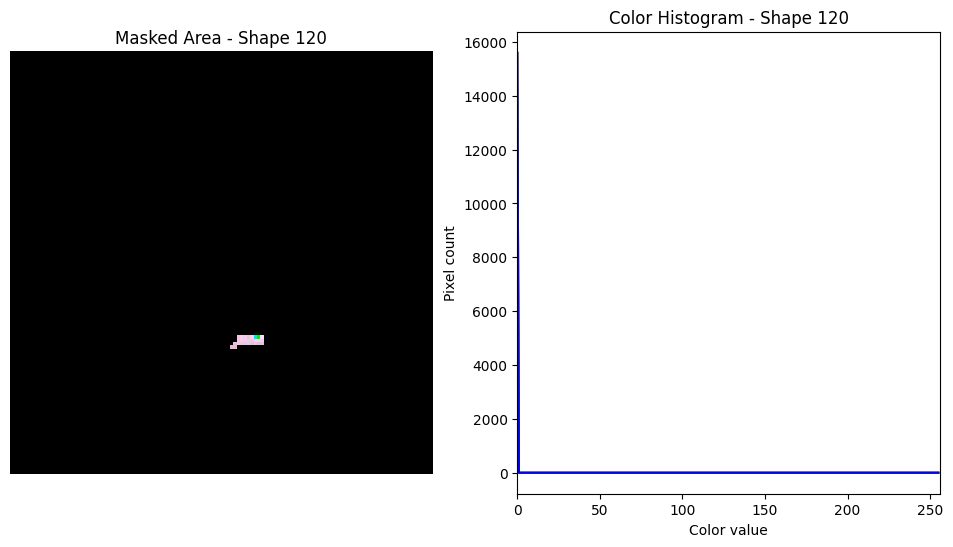

[(94.4868383364268, 88.9112661505036), (101.63059452789793, 86.9209505431391), (102.78391155707952, 89.90850726012715), (95.30674962861792, 92.23054589716092)]


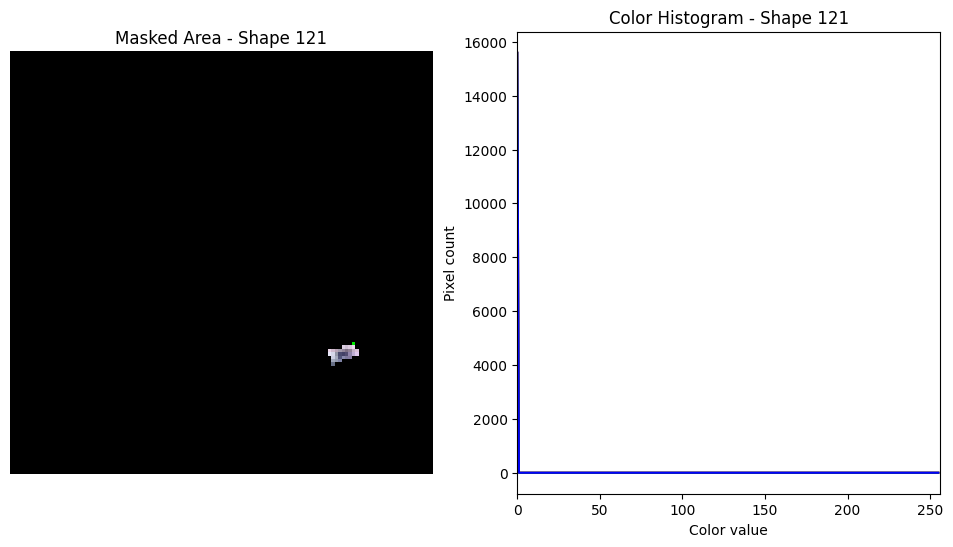

[(99.15434966962158, 82.27414336725369), (104.1426438092837, 79.4535282307153), (105.627100855518, 82.77253062046887), (100.97195526296632, 85.09536552009288)]


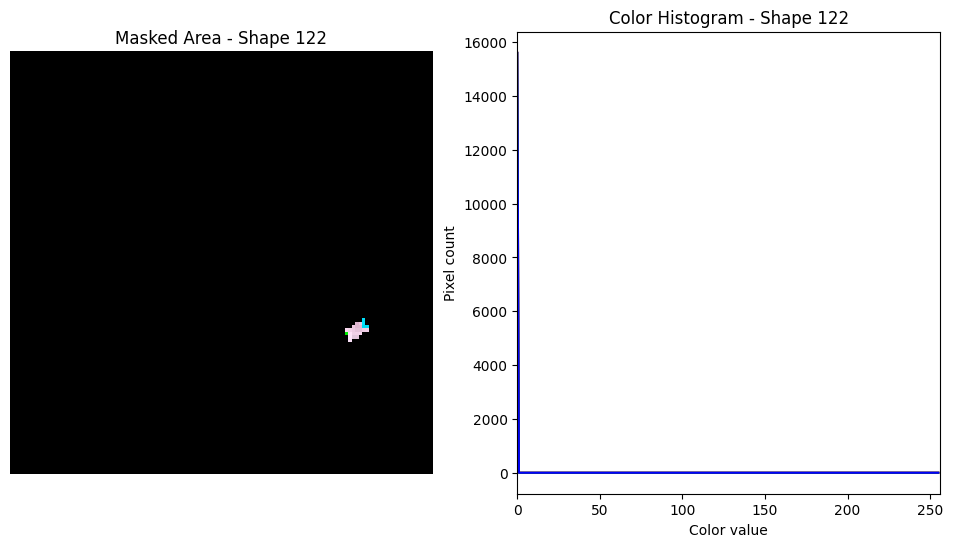

[(103.0219406047358, 93.6596642404165), (108.8336091657644, 93.57803396688324), (108.57379304281466, 97.313056295084), (102.76266654207814, 97.14540499791585)]


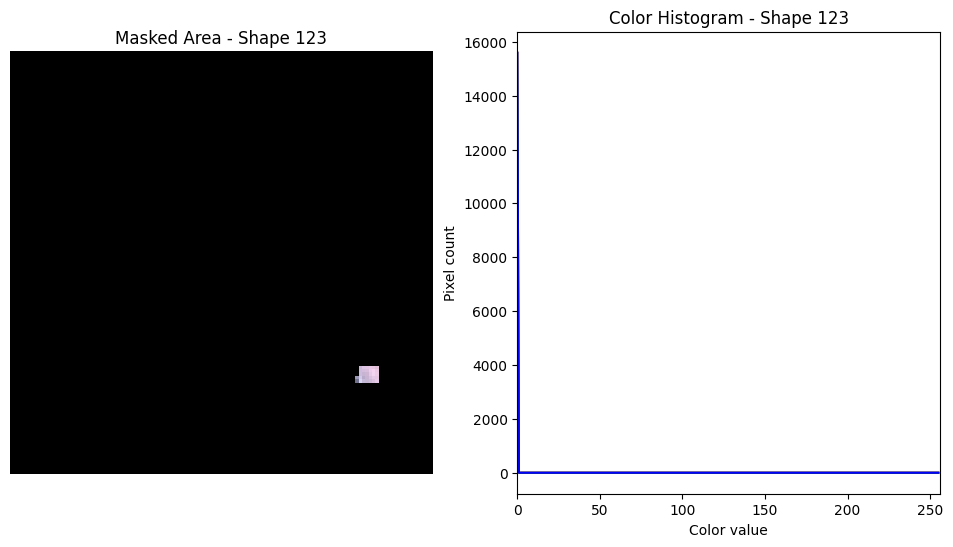

[(108.417044865835, 94.07592934282384), (113.89508356522668, 94.8243045003888), (113.55402634244264, 97.97856427803592), (107.90980173864602, 97.22986295785128)]


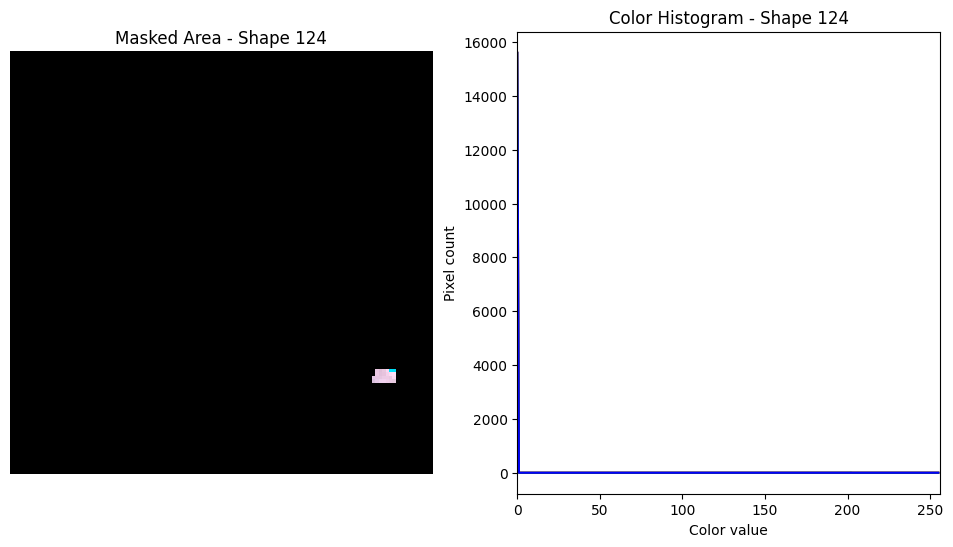

[(115.05671973001046, 95.15662942526924), (122.86124152670992, 95.98880480256604), (122.0197569556405, 99.97360364497708), (114.38164586166198, 98.97497115485568)]


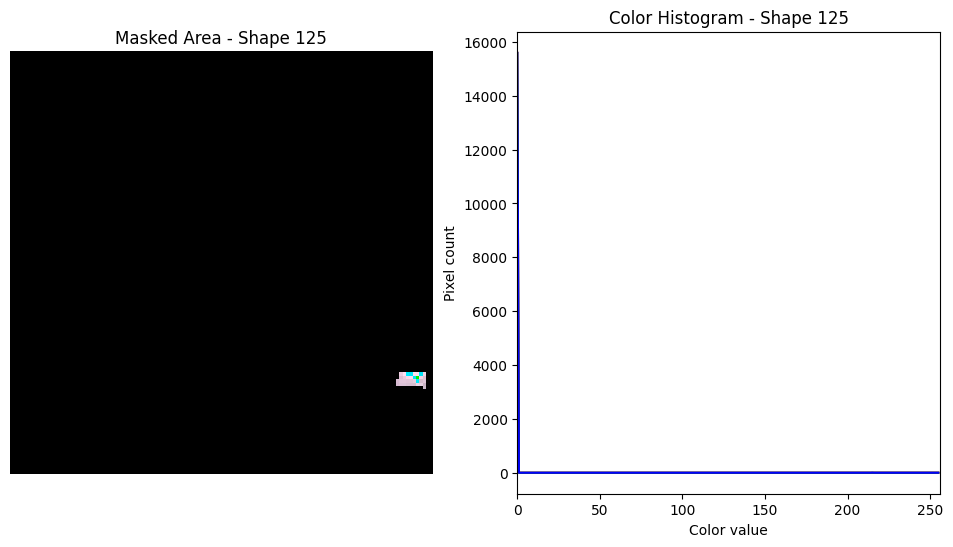

[(114.21509086224648, 99.14094899330296), (122.0197569556405, 99.97360364497708), (121.17822060174626, 103.95864770179624), (113.53996992088634, 102.95953272069944)]


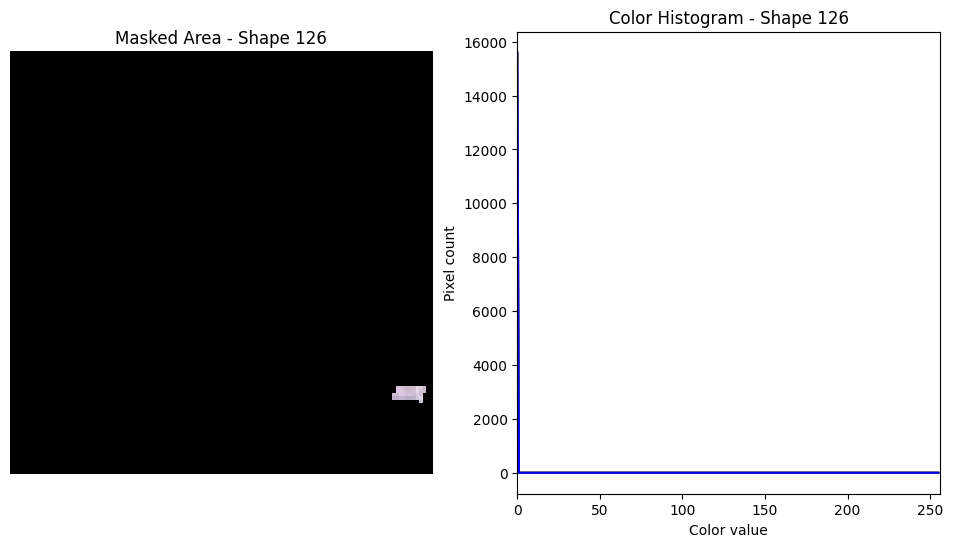

[(110.7794858805359, 80.88103477892), (118.58189408253044, 81.71141162058208), (117.74045326804544, 85.69494069762672), (110.10441905719097, 84.69813465953169)]


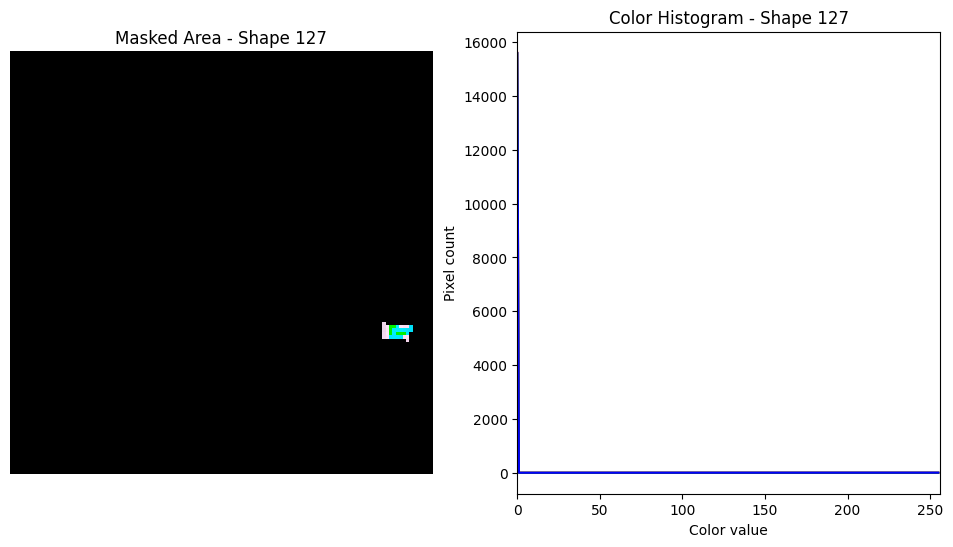

[(86.76606548293705, 63.29697005189172), (94.56176831070542, 64.12492335528572), (93.72001747388828, 68.10588316004839), (86.09059243821292, 67.11157718172797)]


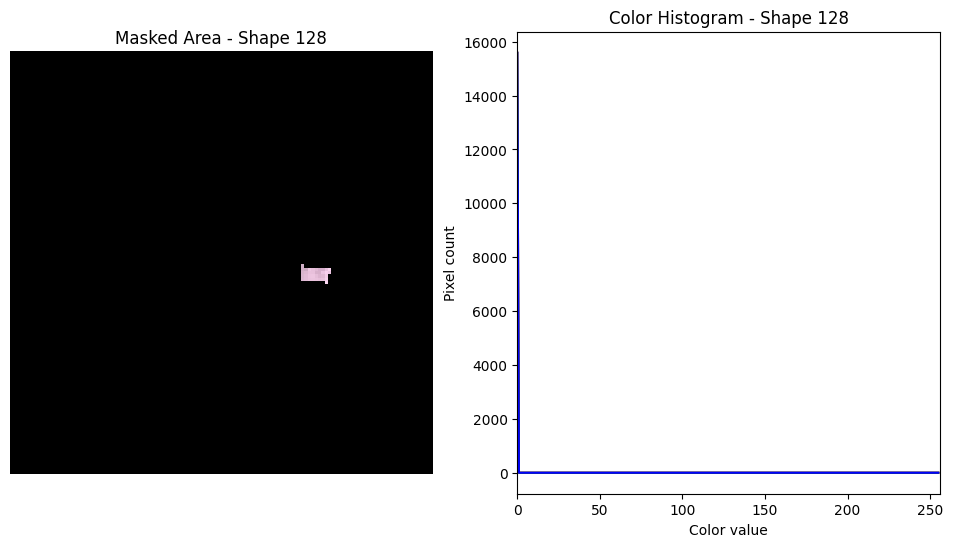

[(68.5869277301851, 43.40811654562566), (76.37701416454041, 44.23343103162054), (75.53508769179564, 48.211967178473685), (67.9111946784949, 47.22036639014868)]


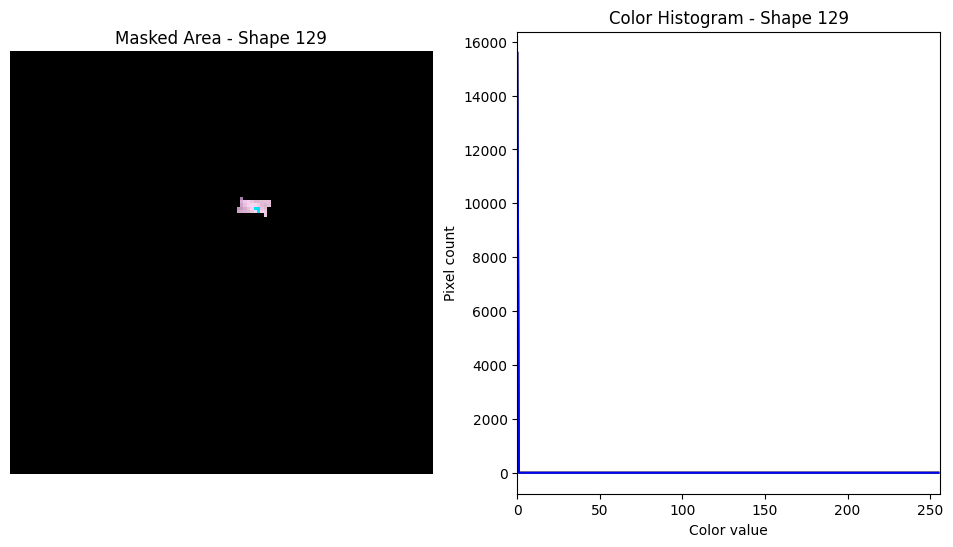

[(16.5619584232696, 44.65665534814886), (22.0238141251356, 45.15123354387117), (20.8314059129803, 53.9310042316844), (15.534790665132874, 53.4356445342375)]


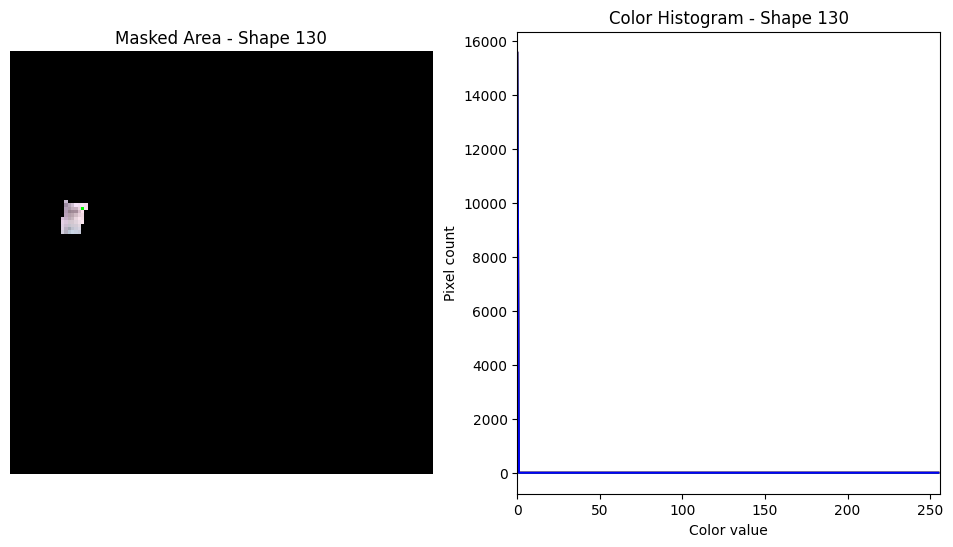

[(24.34351479351588, 44.75273121160464), (32.12403733897571, 45.57771805440723), (31.28124184744999, 49.55397923537757), (23.66679478822067, 48.56280381251145)]


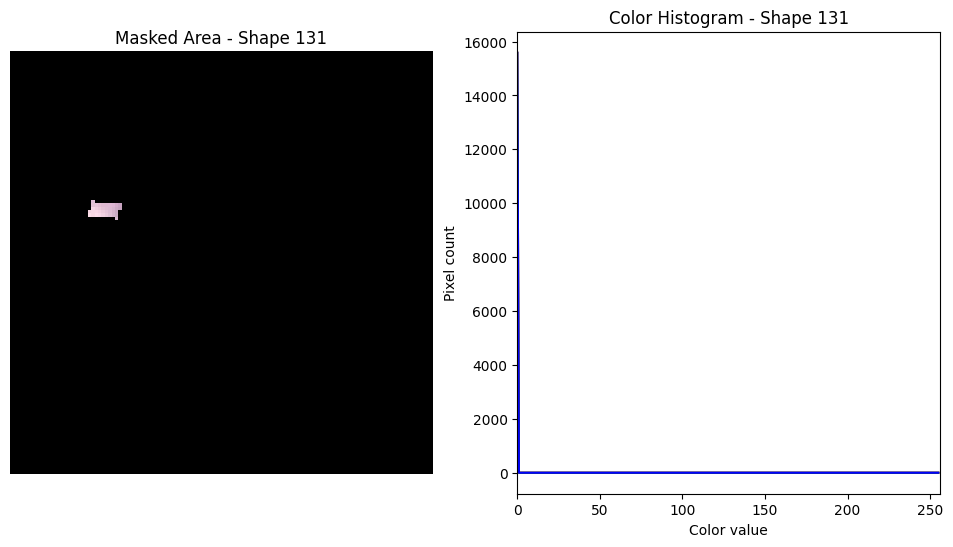

[(15.255432340706164, 40.02016055524573), (14.910277499252146, 43.66366993955512), (21.860744226685995, 44.48877219461557), (22.204444662704645, 41.17610164181002)]


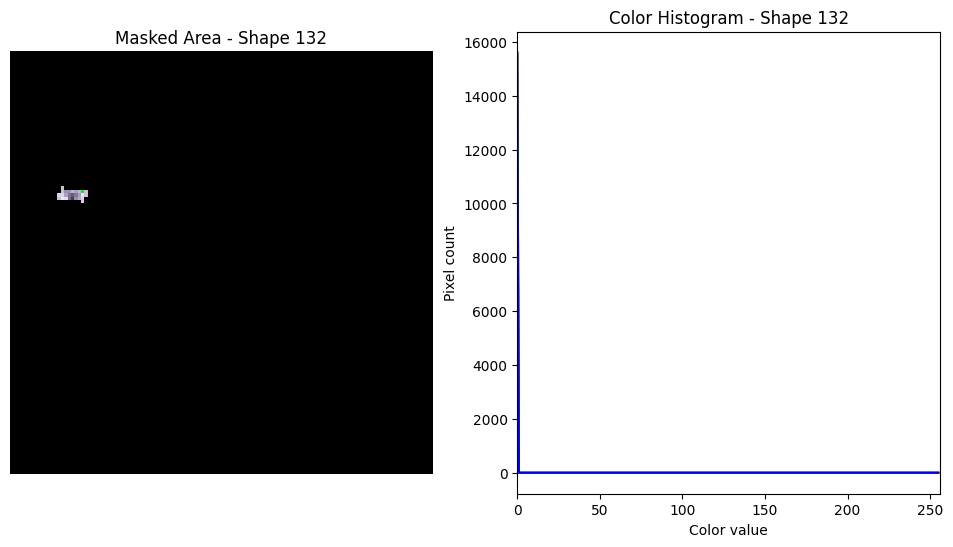

[(44.75939439940413, 46.732324457165305), (49.84540970372723, 46.97885942214276), (49.05498006074589, 50.29330111530487), (44.4171384844808, 49.79781536489256)]


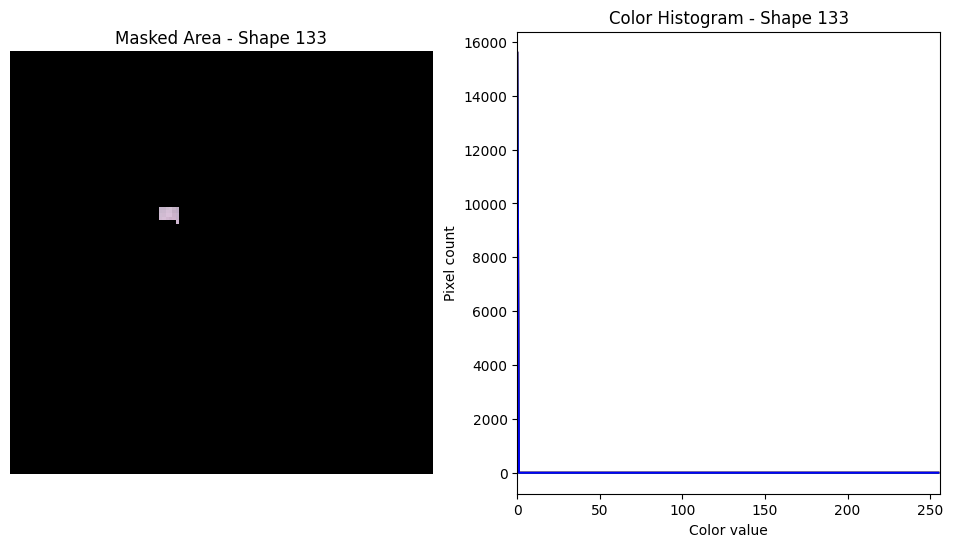

[(60.73135632168851, 47.77007171034475), (65.886854448914, 47.75152444886368), (66.0778052388149, 50.15476375039137), (60.77161857114453, 50.57097086967392)]


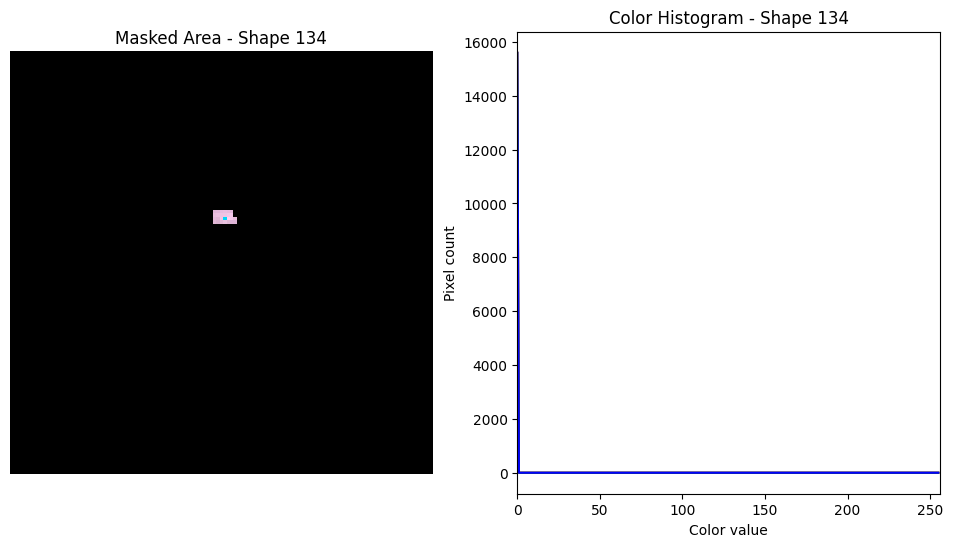

[(28.74859652914813, 93.7582461107265), (34.84580592664128, 94.00844176859565), (34.67311679218392, 95.9155242244858), (28.70726345973111, 95.96368463171608)]


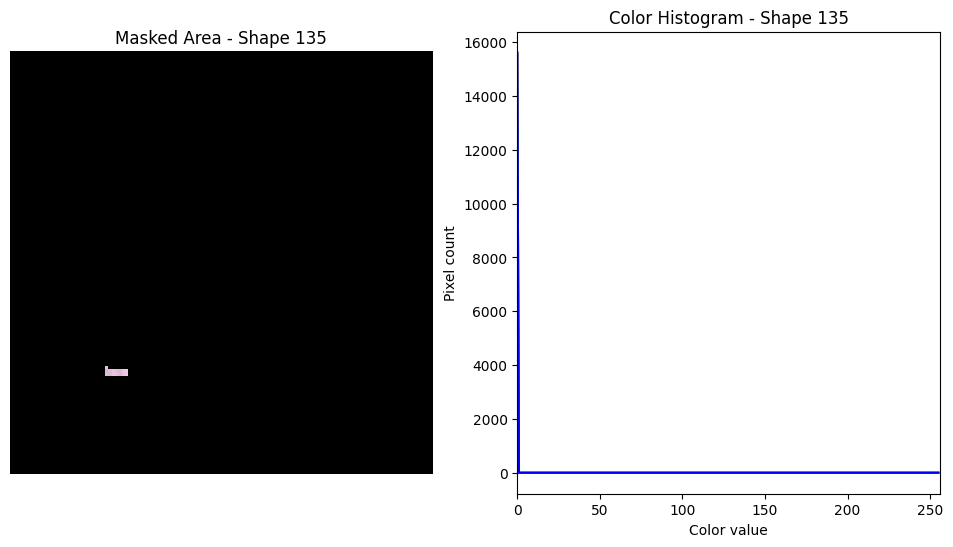

[(28.971081725253896, 91.8514084286839), (35.05163315320965, 92.101434483574), (34.87895069540892, 94.00844973727897), (28.913184692797188, 94.05676166470904)]


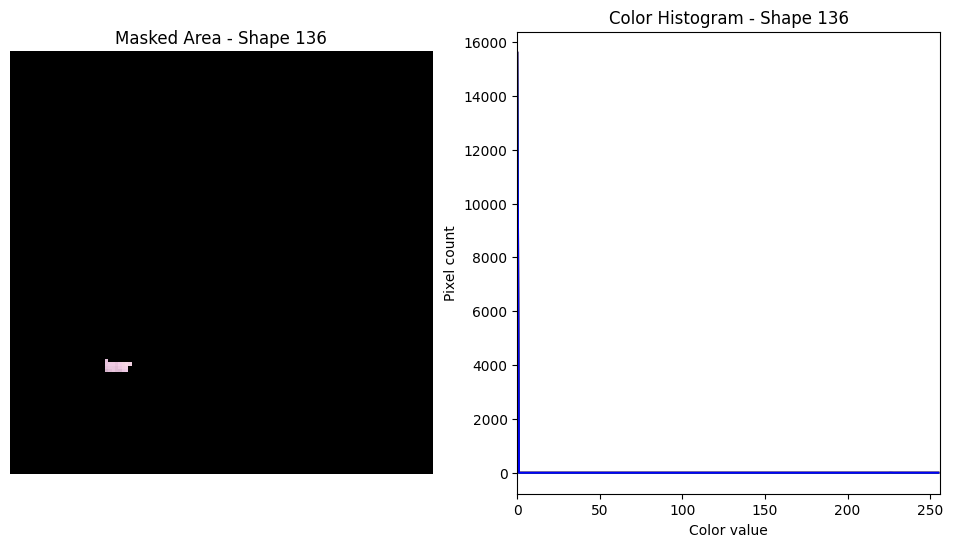

[(28.978468881874196, 89.86169309879512), (35.05889355416332, 90.11154558558108), (34.88621484347141, 92.0184853842282), (28.920573228775595, 92.0669552763932)]


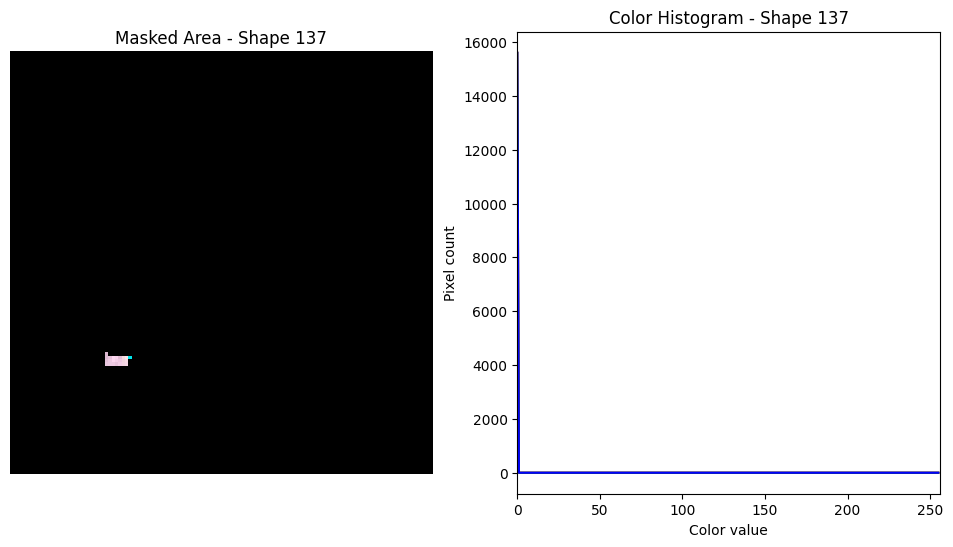

[(8.172906378525198, 102.67281948339637), (14.962340535012116, 103.08979716026408), (14.91864881652009, 105.825910925168), (7.9130629690111505, 105.57438781427044)]


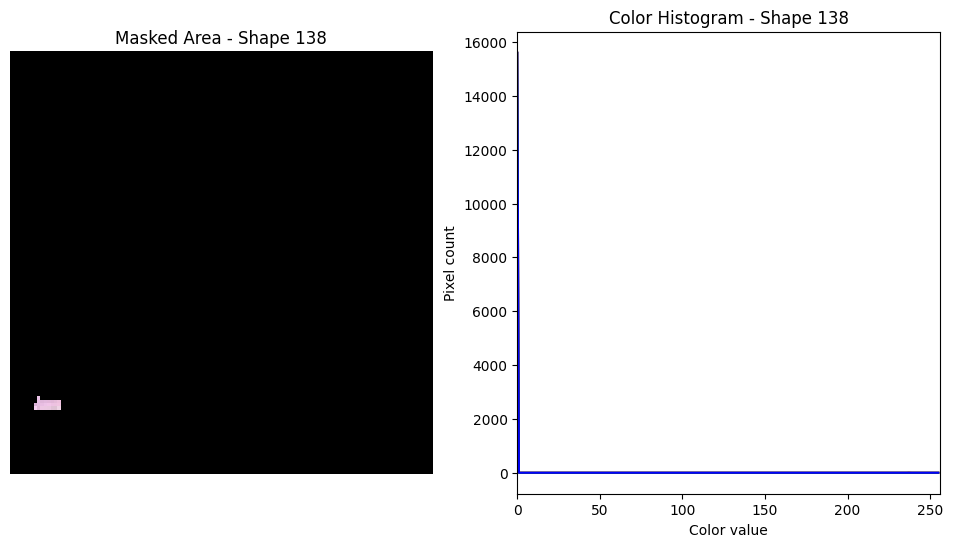

[(7.934260810154683, 100.18573712233557), (14.723471566395348, 100.60246388484003), (14.67977436533053, 103.33842631844584), (7.674418584233081, 103.08715213782448)]


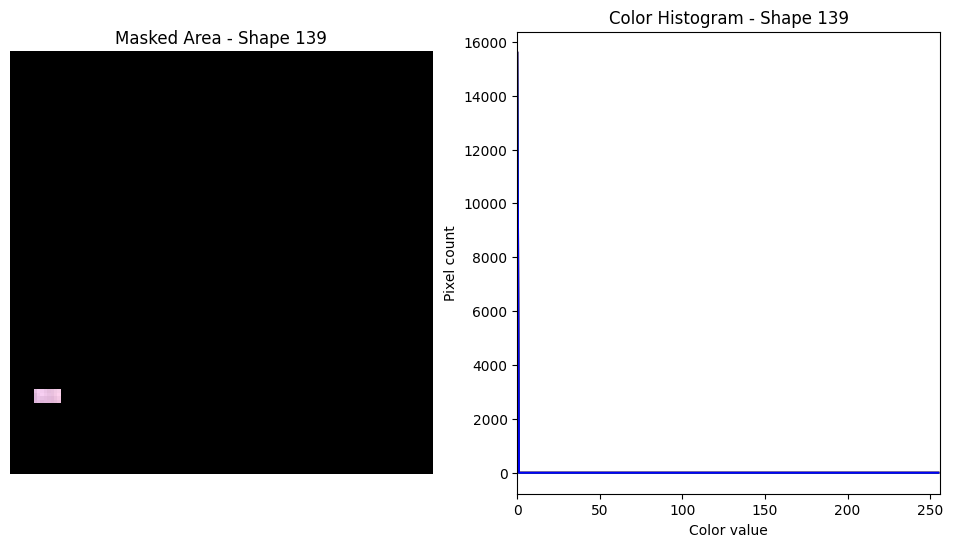

[(8.330617187393557, 117.33231579567835), (15.290968678833565, 116.67269536390452), (15.60890369709307, 120.1562764955558), (8.648889445494518, 120.64975281991693)]


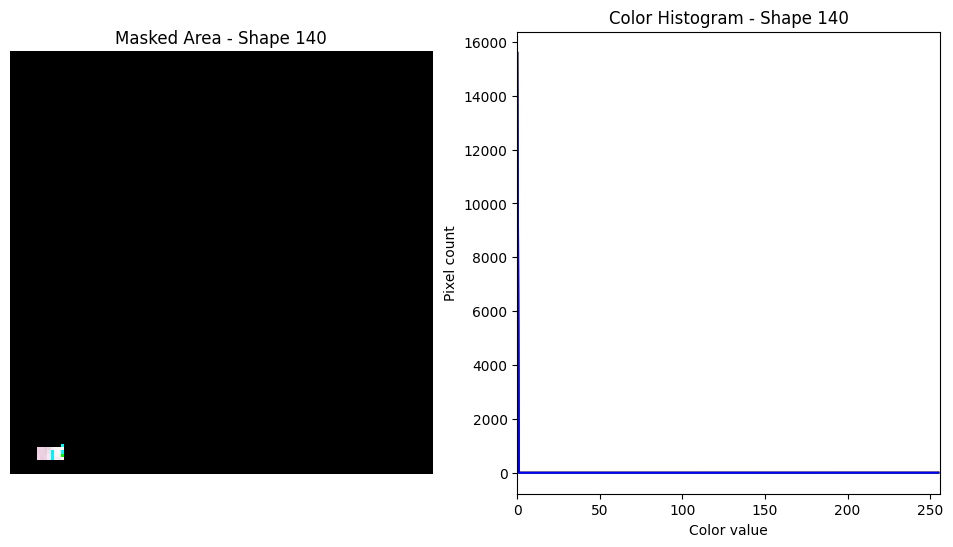

[(35.659630640940634, 120.83188207884837), (42.62517814053783, 120.17229825129364), (42.94436678335697, 123.6574357281799), (35.97910860836677, 124.1508018435394)]


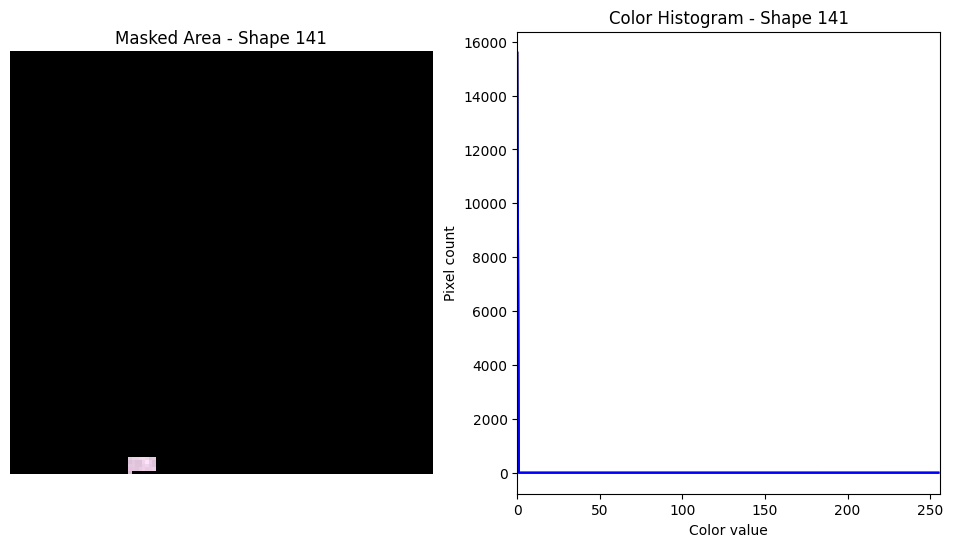

[(27.48512979710688, 117.1106884310084), (27.8067092779184, 119.76532810916191), (33.77616781536088, 119.10515327166463), (33.61927774787239, 116.68270396263785)]


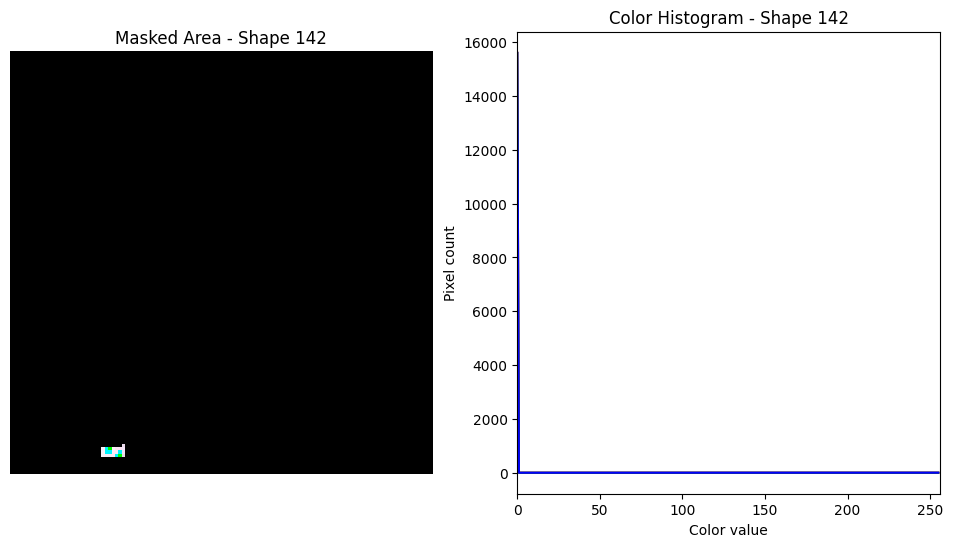

[(35.774194774893886, 116.6838807051156), (36.098732334642506, 118.6087257354005), (42.5656071135364, 118.28055110324848), (42.23969708019487, 116.6874113427723)]


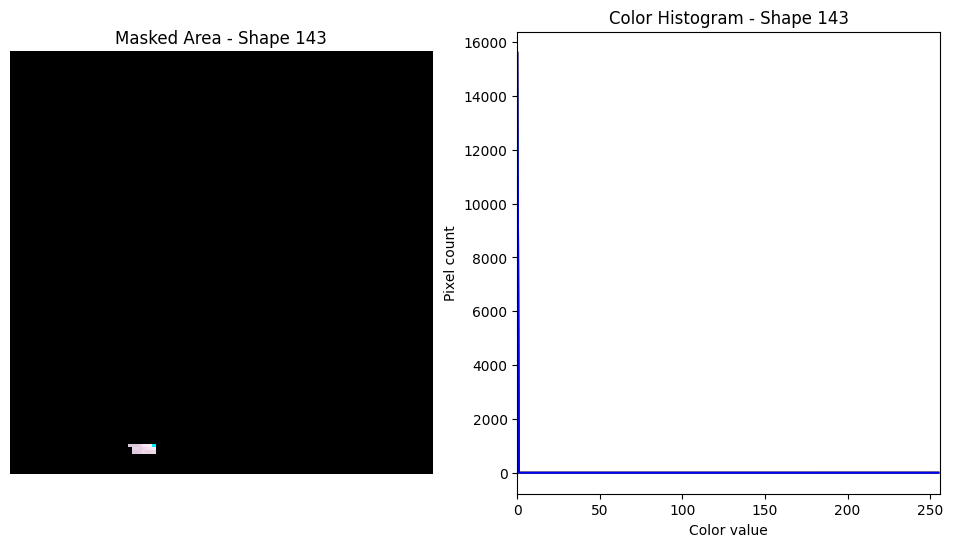

[(114.02670439210584, 118.8526190352952), (113.51662659545002, 123.00492965173066), (120.49367326359652, 123.34158474991108), (120.83738993501528, 119.1887607836407)]


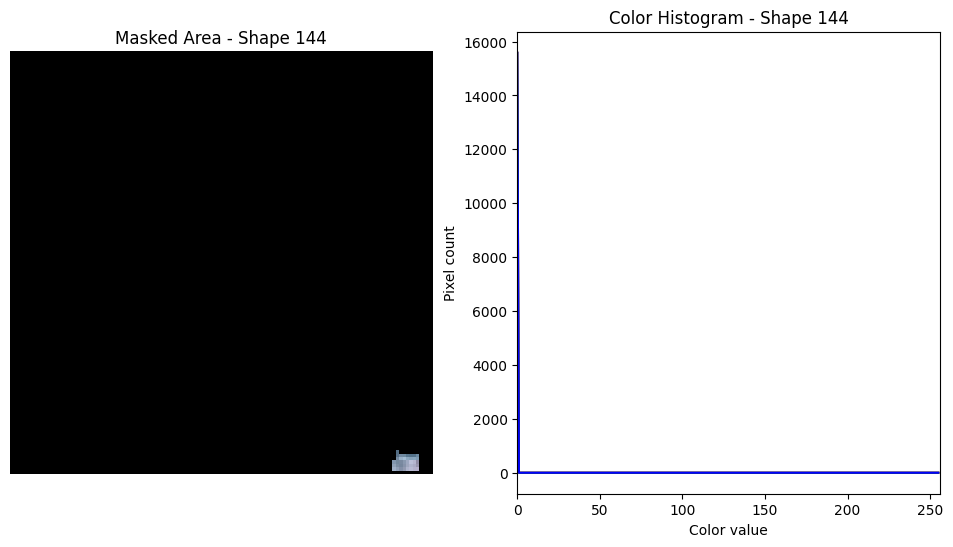

[(82.39946453731807, 117.12439286785288), (81.72560657713933, 120.278501746936), (87.78229302005013, 120.94628255196044), (88.29005906247619, 117.79178493228744)]


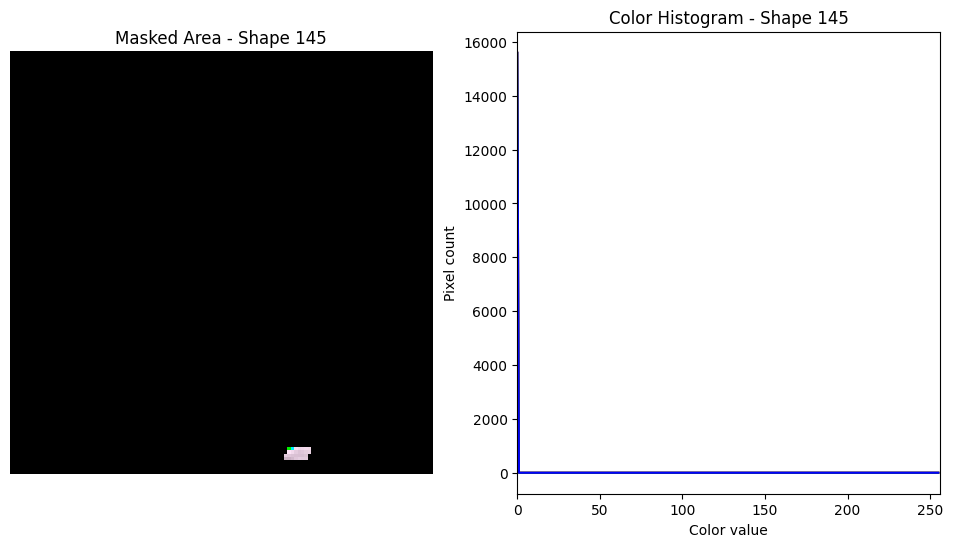

[(89.69959222341282, 118.2906975306824), (89.27664688723468, 120.8641588534098), (95.00332396670764, 121.2827644806258), (94.92706834112964, 119.04090922564772)]


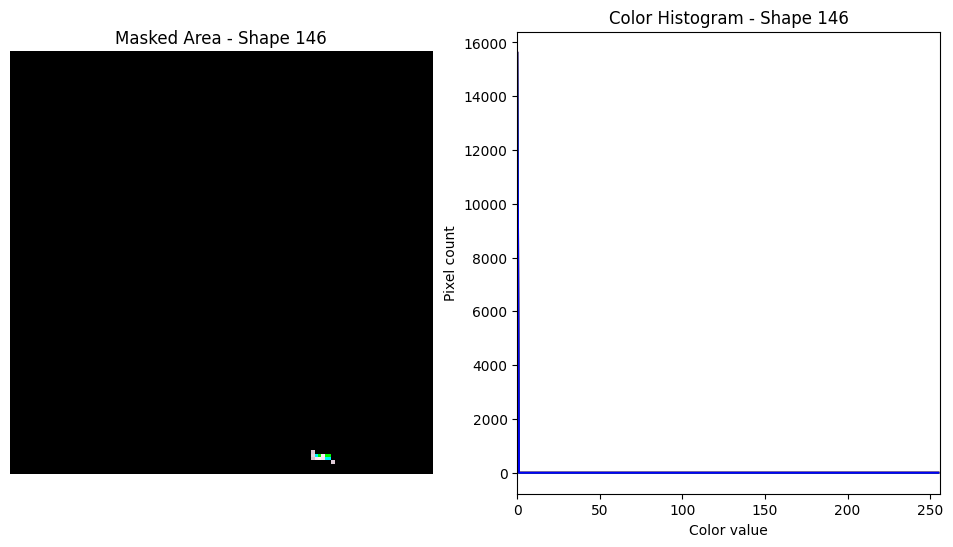

[(89.27674906913506, 120.83094897481564), (88.85352986848375, 123.48754810373754), (94.33073250817364, 124.07228839160824), (94.92065458394784, 121.16646970781044)]


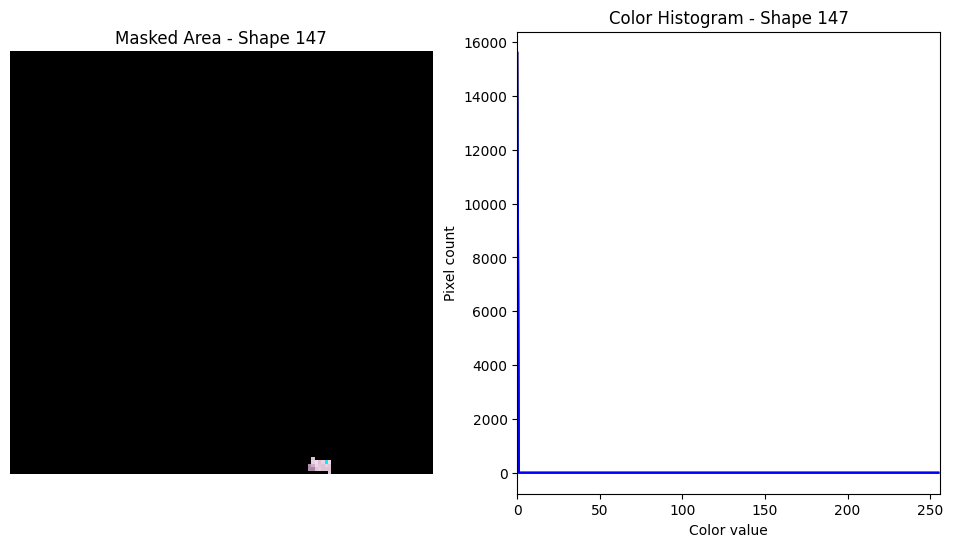

[(73.85398661331743, 116.70467505962604), (73.67863354217798, 119.60967389542289), (80.7321098832495, 119.5307886133121), (80.99000163072742, 116.70857184631784)]


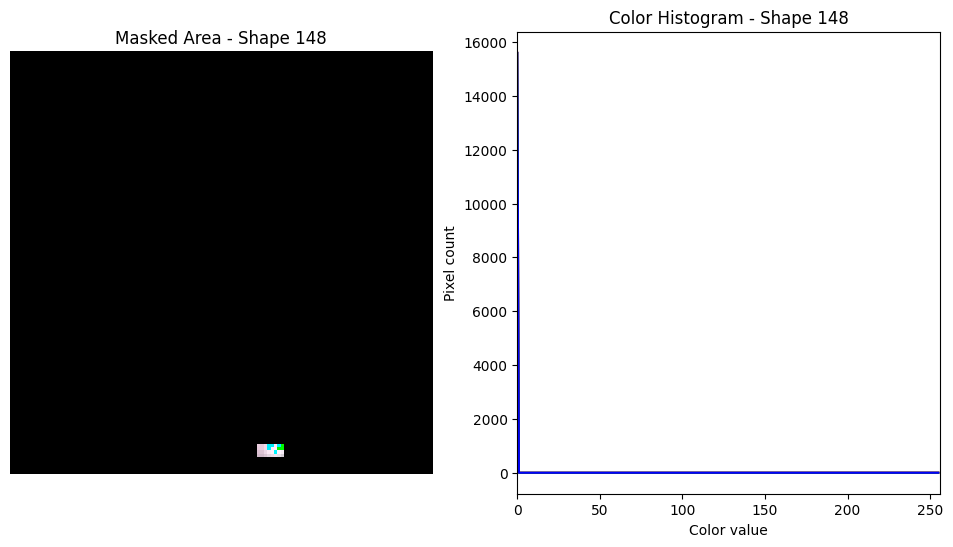

In [66]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import pandas as pd

# Load image
input_image_path = '/Users/kweitzel/Library/CloudStorage/OneDrive-ResearchTriangleInstitute/Projects/NYU Detect/satellite_drone_overlays/SuperimposedSatelliteTiles/DAR_UNLABLED_1_3.png'
image = Image.open(input_image_path)

# Load coordinates from CSV
image_label_path ='/Users/kweitzel/Library/CloudStorage/OneDrive-ResearchTriangleInstitute/Projects/NYU Detect/satellite_drone_overlays/SuperimposedSatelliteTiles/DAR_UNLABLED_1_3.txt'

# Convert PIL Image to NumPy array
image_array = np.array(image)

df = pd.read_csv(image_label_path,
            sep=' ',
            names=['x1', 'y1', 'x2', 'y2', 'x3', 'y3', 'x4', 'y4', 'label', 'difficulty'])


# Tuple to select colors of each channel line
colors = ("red", "green", "blue")


# Iterate through rows in the DataFrame and create subplots for each shape
for index, row in df.iterrows():

    # Set up the figure with two subplots
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))

    # Extract points for the current shape
    points = [(row[f'x{i+1}'], row[f'y{i+1}']) for i in range(4)]
    print(points)

    # Create a mask for the current shape
    mask = Image.new('L', image.size, 0)
    draw_mask = ImageDraw.Draw(mask)
    draw_mask.polygon(points, outline=255, fill=255)
    mask_array = np.array(mask)

    # Extract pixel values within the shape
    masked_image = image_array * mask_array[:, :, np.newaxis]

    # Plot the masked area on the left subplot
    axs[0].imshow(masked_image)
    axs[0].set_title(f"Masked Area - Shape {index+1}")
    axs[0].axis('off')

    # Plot the color histogram on the right subplot
    axs[1].clear()
    axs[1].set_xlim([0, 256])
    for channel_id, color in enumerate(colors):
        histogram, bin_edges = np.histogram(
            masked_image[:, :, channel_id], bins=256, range=(0, 256)
        )
        axs[1].plot(bin_edges[0:-1], histogram, color=color)

    axs[1].set_title(f"Color Histogram - Shape {index+1}")
    axs[1].set_xlabel("Color value")
    axs[1].set_ylabel("Pixel count")

    #save image
    plt.savefig(f'shape_{index+1}.png')
    plt.show()
